# Section 1 image processing

*   Binary Images
*   Angle rotate





In [1]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="ot1GdmcHDFR44JKsFzX9")
project = rf.workspace("msc-9pkbx").project("c-yhahi")
version = project.version(2)
dataset = version.download("yolov5")


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.7/76.7 kB 1.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 2.3 MB/s eta 0:00:00
  Attempting uninstall: chardet
    Found existing installation: chardet 5.2.0
    Uninstalling chardet-5.2.0:
      Successfully uninstalled chardet-5.2.0
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to c-2 in yolov5pytorch:: 100%|██████████| 3300/3300 [00:01<00:00, 2004.29it/s]


In [52]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import skimage.transform

def rotate_image_mine(image, angle):
  image_center = tuple(np.array(image.shape[1::-1]) / 2)
  rot_mat = cv2.getRotationMatrix2D(image_center, angle, 1.0)
  result = cv2.warpAffine(image, rot_mat, image.shape[1::-1], flags=cv2.INTER_LINEAR)
  return result

def rotate_image(image, angle):
    return skimage.transform.rotate(image, angle)

def find_best_two_rotation_angles(image, angle_increment=1, max_angle=60):
    best_angle11 = 0
    best_angle22 = 0
    highest_max_value1 = -np.inf
    highest_max_value2 = -np.inf

    angles = range(-max_angle, max_angle, angle_increment)

    for angle in angles:
        rotated_image = rotate_image(image, angle)
        vertical_hist = np.sum(rotated_image, axis=1, keepdims=True) / 100
        max_value = np.max(vertical_hist)

        if max_value > highest_max_value1:
            highest_max_value2 = highest_max_value1
            best_angle22 = best_angle11

            highest_max_value1 = max_value
            best_angle11 = angle
        elif max_value > highest_max_value2:
            highest_max_value2 = max_value
            best_angle22 = angle



    return (best_angle11, highest_max_value1), (best_angle22, highest_max_value2)

In [53]:
import cv2, os
from google.colab.patches import cv2_imshow
def preprocess_image(image_path):
    # Read the image
    image = cv2.imread(image_path)

    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian blur
    blurred = cv2.GaussianBlur(gray, (3, 3), 0)

    # Apply adaptive thresholding
    thresh11 = cv2.adaptiveThreshold(blurred, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
                                   cv2.THRESH_BINARY_INV, 5, 5)

    return thresh11



In [118]:
!unzip /content/Arabic-plate.zip

Archive:  /content/Arabic-plate.zip
  inflating: Arabic-plate/011_jpg.rf.b2fd2d2ba617f08597b1fe82093187f0.jpg  
  inflating: Arabic-plate/018_jpg.rf.c9d875cc92b9d4f9212f9955b988e299.jpg  
  inflating: Arabic-plate/021_jpg.rf.241cea8f00dea616586dbdb05f793550.jpg  
  inflating: Arabic-plate/025_jpg.rf.5a308601e45fd68269101a3184322a2f.jpg  
  inflating: Arabic-plate/045_jpg.rf.6d856a6ca9bcf2ccb0b0dc6825797924.jpg  
  inflating: Arabic-plate/067_jpg.rf.1212c19bab5742c491b05439e0d9a3ab.jpg  
  inflating: Arabic-plate/069_jpg.rf.5d9e8f2a22245542fb7a0f2a3ac55a2a.jpg  
  inflating: Arabic-plate/097_jpg.rf.910338ccbcf1af00c73f1075b2dd262a.jpg  
  inflating: Arabic-plate/1_jpg.rf.e0d71bfac749526f7f57a7274f7f8f1e.jpg  
  inflating: Arabic-plate/1_JPG_jpg.rf.ca2292efa05f502a389155610f637f07.jpg  
  inflating: Arabic-plate/104_jpg.rf.0ed9868348ec11b38e0599fe313be3a0.jpg  
  inflating: Arabic-plate/114_jpg.rf.518e09fd6bd2679e687ffcb503d6832a.jpg  
  inflating: Arabic-plate/118_jpg.rf.26dcec77b4b7d16

In [55]:
!rm -rf /content/rotated_images

417570965_1736849176812307_1723590590995587808_n_jpg.rf.dedfea8f854ec3a3addb7b059de3fd53.jpg


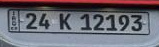

Best Angle: 1, Highest Max Value: 1.585611278707088
Best Angle 2: 0, Highest Max Value 2: 1.58


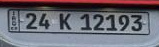

bz78_jpg.rf.181b56eb65783ad76608e88a4afde992.jpg


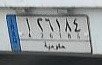

Best Angle: 0, Highest Max Value: 1.02
Best Angle 2: 1, Highest Max Value 2: 1.0158883364010745


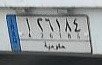

202_jpg.rf.9f4dc9aa70efdd9d3c0f3b5d51efd414.jpg


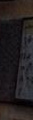

Best Angle: 0, Highest Max Value: 0.14
Best Angle 2: 9, Highest Max Value 2: 0.13468764830004126


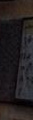

253_jpg.rf.97f44a1104240ca2dda69cf682d0287b.jpg


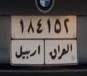

Best Angle: 0, Highest Max Value: 0.82
Best Angle 2: -3, Highest Max Value 2: 0.8030178866135534


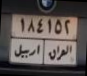

492_jpg.rf.6c93c21b17d0eb16d92292228a72837d.jpg


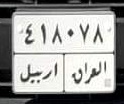

Best Angle: 0, Highest Max Value: 1.23
Best Angle 2: -1, Highest Max Value 2: 1.1460069118080938


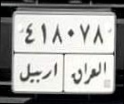

407_jpg.rf.e17304de116b6487450a4c63468485c4.jpg


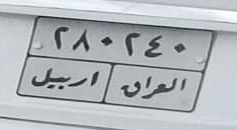

Best Angle: 5, Highest Max Value: 2.3181472284730917
Best Angle 2: 6, Highest Max Value 2: 1.7224979282153852


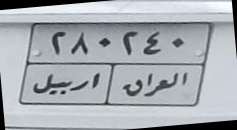

bz55_jpg.rf.530decdda9e06c7af61f364545a894ed.jpg


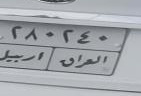

Best Angle: 4, Highest Max Value: 1.3844096838642201
Best Angle 2: 3, Highest Max Value 2: 1.3180626587614723


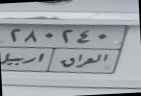

a-456-_JPG_jpg.rf.b5551402494918829089a8549bc7eca2.jpg


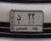

Best Angle: 0, Highest Max Value: 0.51
Best Angle 2: 1, Highest Max Value 2: 0.5067531712936691


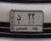

44_png.rf.aef019e084dafaf2c07358199d3e5cca.jpg


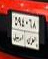

Best Angle: 10, Highest Max Value: 0.382851491487046
Best Angle 2: 9, Highest Max Value 2: 0.38089638124862446


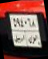

a-231-_JPG_jpg.rf.0da42755b6aa2101ef59ee2d60e2f409.jpg


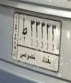

Best Angle: 11, Highest Max Value: 0.6349068290190563
Best Angle 2: 12, Highest Max Value 2: 0.6320323426219089


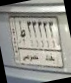

025_jpg.rf.5a308601e45fd68269101a3184322a2f.jpg


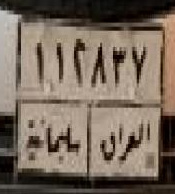

Best Angle: 0, Highest Max Value: 1.3
Best Angle 2: -1, Highest Max Value 2: 1.1691791697670453


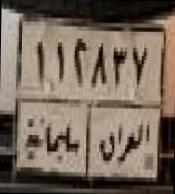

455_jpg.rf.c8b78f908b87cfb4f80fd1d1e4b15c23.jpg


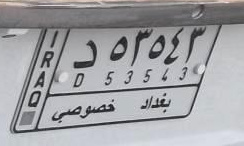

Best Angle: -1, Highest Max Value: 2.005844787009387
Best Angle 2: -5, Highest Max Value 2: 1.7424390992605734


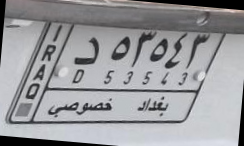

261_jpg.rf.693f3435e5f37f7e96599496c6a090a4.jpg


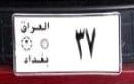

Best Angle: -1, Highest Max Value: 1.2453022762650943
Best Angle 2: 0, Highest Max Value 2: 1.14


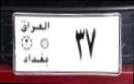

400_jpg.rf.28c6b1aa0f59d9fa4e1e81e5842dee76.jpg


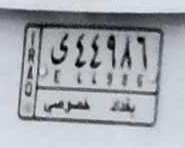

Best Angle: 1, Highest Max Value: 1.727707767830662
Best Angle 2: 2, Highest Max Value 2: 1.6331890188463933


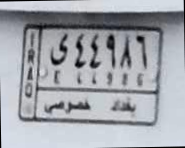

179_jpg.rf.922254f69ac3c9e73dddff1c93fafcb8.jpg


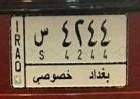

Best Angle: 0, Highest Max Value: 1.23
Best Angle 2: -1, Highest Max Value 2: 1.2099803592473488


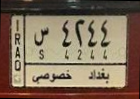

045_jpg.rf.6d856a6ca9bcf2ccb0b0dc6825797924.jpg


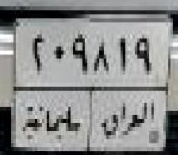

Best Angle: 0, Highest Max Value: 1.78
Best Angle 2: 1, Highest Max Value 2: 1.6277986907182247


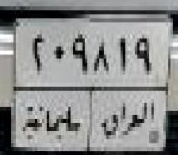

189_jpg.rf.b9d5b30ec71075a507f23d6622a1f7eb.jpg


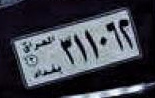

Best Angle: -16, Highest Max Value: 1.1213106534067032
Best Angle 2: -17, Highest Max Value 2: 1.0349065340275638


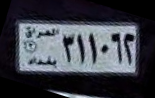

250_jpg.rf.16b52dd7548b1b0b8a257cc622bd9675.jpg


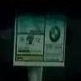

Best Angle: 0, Highest Max Value: 0.51
Best Angle 2: 1, Highest Max Value 2: 0.5057838044586405


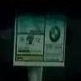

118_jpg.rf.26dcec77b4b7d16403942bca586889cc.jpg


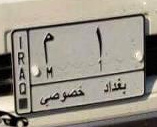

Best Angle: -7, Highest Max Value: 1.4068539036505512
Best Angle 2: -8, Highest Max Value 2: 1.3555436242125836


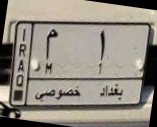

317_jpg.rf.8dc11c7ff9f4fccc2455716ea38f45b5.jpg


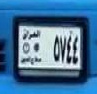

Best Angle: 0, Highest Max Value: 0.94
Best Angle 2: 2, Highest Max Value 2: 0.7342817296267082


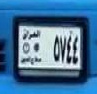

a-508-_JPG_jpg.rf.55721598ea577ef2c44ee790e23f194a.jpg


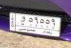

Best Angle: 6, Highest Max Value: 0.6458633523075636
Best Angle 2: 8, Highest Max Value 2: 0.6410300909524449


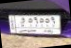

485_jpg.rf.91a743d8711bd0c0d86d74e1a60e342a2.jpg


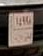

Best Angle: 0, Highest Max Value: 0.43
Best Angle 2: -1, Highest Max Value 2: 0.42627971663314185


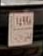

bz69_jpg.rf.f90cbc38fd48391f6f57ca1913b15a6c.jpg


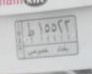

Best Angle: -6, Highest Max Value: 0.8439718976872457
Best Angle 2: -7, Highest Max Value 2: 0.7976465207938784


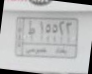

353_jpg.rf.87d68f4303f35d471d129867c8fc25a8.jpg


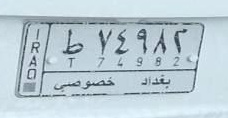

Best Angle: 0, Highest Max Value: 1.83
Best Angle 2: 1, Highest Max Value 2: 1.633526281187327


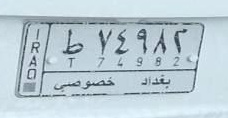

a-355-_JPG_jpg.rf.c85e2b56c5355e8e9c48e0a63e0d85f1.jpg


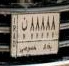

Best Angle: -4, Highest Max Value: 0.6166813729670451
Best Angle 2: -2, Highest Max Value 2: 0.5998722110474163


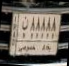

348_jpg.rf.93798dde0e7f8a7eca65ab22a3dec1cd.jpg


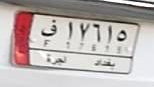

Best Angle: 6, Highest Max Value: 1.1742934530164981
Best Angle 2: 5, Highest Max Value 2: 1.1131237711617137


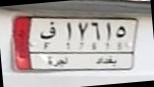

a-175-_JPG_jpg.rf.f6872354b69743328ccbe61c6d2ede9a.jpg


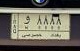

Best Angle: 0, Highest Max Value: 0.8
Best Angle 2: 1, Highest Max Value 2: 0.7943978649645612


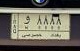

bz129_png_jpg.rf.b7b08ec9e96891391a2a41aa015e9082.jpg


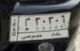

Best Angle: -5, Highest Max Value: 0.6503350355958214
Best Angle 2: -4, Highest Max Value 2: 0.6452739069210449


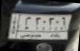

a-43-_JPG_jpg.rf.1f08691b9c8be739f8b0b76c83a051b2.jpg


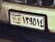

Best Angle: 8, Highest Max Value: 0.5249488493028539
Best Angle 2: 9, Highest Max Value 2: 0.5179959251276918


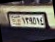

205_jpg.rf.c8534ffbadd4d84a06b929cc182f7efa.jpg


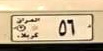

Best Angle: 0, Highest Max Value: 1.03
Best Angle 2: -1, Highest Max Value 2: 1.022687895914099


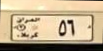

a-263-_JPG_jpg.rf.dc3116af80bd600f902fb689dd002137.jpg


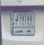

Best Angle: 0, Highest Max Value: 0.44
Best Angle 2: 1, Highest Max Value 2: 0.43401480144740145


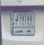

210_jpg.rf.476bda26faf9322e528e37228773adbc.jpg


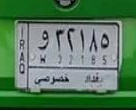

Best Angle: 0, Highest Max Value: 1.36
Best Angle 2: 1, Highest Max Value 2: 1.1585946968346834


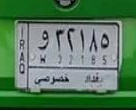

48_png.rf.f474577f25d41c4c25bfedae974bfa5f.jpg


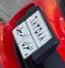

Best Angle: -40, Highest Max Value: 0.4609967068314805
Best Angle 2: -39, Highest Max Value 2: 0.4599702800792321


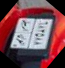

a-284-_JPG_jpg.rf.4481b55c37e387c5a9c1fdffe51a285e.jpg


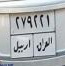

Best Angle: -4, Highest Max Value: 0.6094190964308411
Best Angle 2: -5, Highest Max Value 2: 0.593490838584332


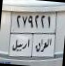

275_jpg.rf.1c12c068dc8301646e72d57b5317d59c.jpg


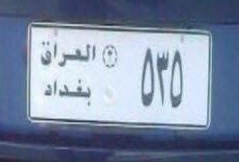

Best Angle: 3, Highest Max Value: 1.7422327323412916
Best Angle 2: 2, Highest Max Value 2: 1.6837607779261208


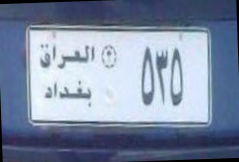

263_jpg.rf.17573144800e45c66a981c587ab1bc0c.jpg


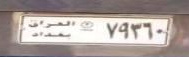

Best Angle: 1, Highest Max Value: 1.6068815117060768
Best Angle 2: 0, Highest Max Value 2: 1.35


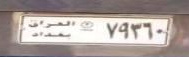

021_jpg.rf.241cea8f00dea616586dbdb05f793550.jpg


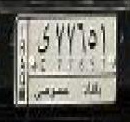

Best Angle: 0, Highest Max Value: 1.13
Best Angle 2: 1, Highest Max Value 2: 1.0014088550290368


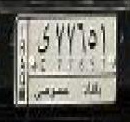

photo_2023-02-12_07-56-32_jpg.rf.63c68441075f11f27a3284747a18b580.jpg


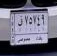

Best Angle: -2, Highest Max Value: 0.4866396854314776
Best Angle 2: -1, Highest Max Value 2: 0.46979786421125325


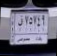

158_jpg.rf.a8ec1791f89b72973af805b1a5bad9ba.jpg


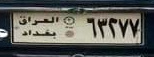

Best Angle: 0, Highest Max Value: 1.54
Best Angle 2: 1, Highest Max Value 2: 1.502457968456182


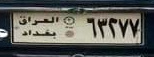

277_jpg.rf.8604d566b4baf5f879da8e224ec7071b.jpg


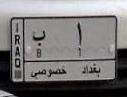

Best Angle: 0, Highest Max Value: 1.07
Best Angle 2: -1, Highest Max Value 2: 1.0597659632257241


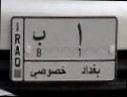

097_jpg.rf.910338ccbcf1af00c73f1075b2dd262a.jpg


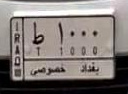

Best Angle: -1, Highest Max Value: 1.1599277792191105
Best Angle 2: -2, Highest Max Value 2: 1.154204176757694


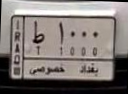

485_jpg.rf.91a743d8711bd0c0d86d74e1a60e342a.jpg


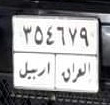

Best Angle: 3, Highest Max Value: 0.906640605974919
Best Angle 2: 4, Highest Max Value 2: 0.8978302703817357


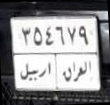

40_JPG_jpg.rf.bbb51bcaa32d153142537d1983c81323.jpg


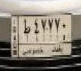

Best Angle: 0, Highest Max Value: 0.68
Best Angle 2: 1, Highest Max Value 2: 0.6750065945815222


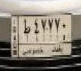

421_jpg.rf.d2d4d2ae5e3627243e0ea221bb656ed8.jpg


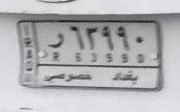

Best Angle: 0, Highest Max Value: 1.65
Best Angle 2: 1, Highest Max Value 2: 1.4668261129290046


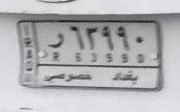

photo_2023-02-12_07-54-56_jpg.rf.92516d77badc2543d8bffc6f1f41e9ab.jpg


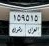

Best Angle: 5, Highest Max Value: 0.3753822091051059
Best Angle 2: 0, Highest Max Value 2: 0.37


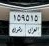

51_JPG_jpg.rf.3e30c08a07efe5bce09477cfa224ffe5.jpg


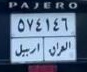

Best Angle: -4, Highest Max Value: 0.7590348929499826
Best Angle 2: -5, Highest Max Value 2: 0.7102395066576445


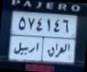

456_jpg.rf.ad8fe5bb75f2b47b732a6fb0ae50d3cd.jpg


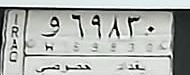

Best Angle: 0, Highest Max Value: 1.85
Best Angle 2: 1, Highest Max Value 2: 1.7958875281281224


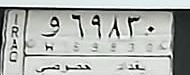

123_jpg.rf.97873db52d1ab7e497bd116fa8e3cea9.jpg


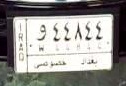

Best Angle: -2, Highest Max Value: 1.1008573556057384
Best Angle 2: -1, Highest Max Value 2: 1.0495559382771373


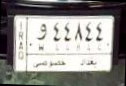

bz58_jpg.rf.da83a9281d1c72989a4332ab6bfb32f0.jpg


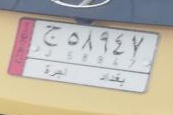

Best Angle: 8, Highest Max Value: 1.2957049832259315
Best Angle 2: 7, Highest Max Value 2: 1.29266913181335


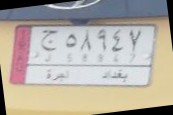

a-531-_JPG_jpg.rf.5fe6da22d2d3e80837db140a6ebd96d4.jpg


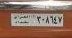

Best Angle: 0, Highest Max Value: 0.69
Best Angle 2: -1, Highest Max Value 2: 0.6438971134145806


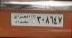

1_jpg.rf.e0d71bfac749526f7f57a7274f7f8f1e.jpg


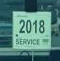

Best Angle: 0, Highest Max Value: 0.6
Best Angle 2: -1, Highest Max Value 2: 0.5679240050374854


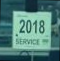

172_jpg.rf.aa7ca09a3e8687c73097ebb21557252d.jpg


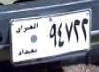

Best Angle: -8, Highest Max Value: 0.8914880066687894
Best Angle 2: -7, Highest Max Value 2: 0.8181730624836022


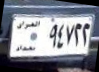

photo_2023-02-12_07-56-20_jpg.rf.791f8d34c744c7f5eb0e15b189e6f081.jpg


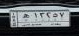

Best Angle: 0, Highest Max Value: 0.62
Best Angle 2: -1, Highest Max Value 2: 0.613571016765104


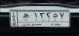

446_jpg.rf.059eb703dd4fff7bf0228e7121f89285.jpg


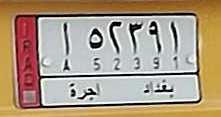

Best Angle: 0, Highest Max Value: 1.76
Best Angle 2: -2, Highest Max Value 2: 1.7487591200154853


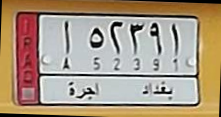

187_jpg.rf.e5d71253f97f384eefb42f5305069326.jpg


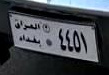

Best Angle: 11, Highest Max Value: 0.8589160786028833
Best Angle 2: 10, Highest Max Value 2: 0.8354454539397057


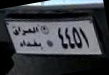

41_JPG_jpg.rf.7b7685d0f27ddb3a84b215305cc82087.jpg


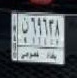

Best Angle: 3, Highest Max Value: 0.661831394180878
Best Angle 2: 4, Highest Max Value 2: 0.6602921340824938


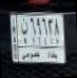

a-265-_JPG_jpg.rf.e281de964ca208f66d56fbdf8920b212.jpg


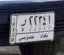

Best Angle: -2, Highest Max Value: 0.5715185707866466
Best Angle 2: -4, Highest Max Value 2: 0.5566617556758353


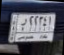

photo_2024-01-29_02-26-55_jpg.rf.73dccdd8631503038b65e74fe6c90d2d.jpg


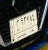

Best Angle: -25, Highest Max Value: 0.40827444246404776
Best Angle 2: -24, Highest Max Value 2: 0.40751377845965264


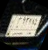

011_jpg.rf.b2fd2d2ba617f08597b1fe82093187f0.jpg


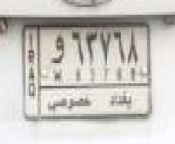

Best Angle: -1, Highest Max Value: 1.6459824388800057
Best Angle 2: 0, Highest Max Value 2: 1.49


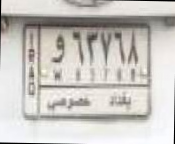

332_jpg.rf.42ca7240b94167a38f4bcef555091abe.jpg


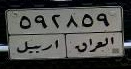

Best Angle: -2, Highest Max Value: 1.1688391789821113
Best Angle 2: -1, Highest Max Value 2: 1.1067693339502112


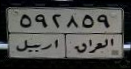

a-150-_JPG_jpg.rf.943095372214be178cb0c5f22c341320.jpg


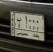

Best Angle: 9, Highest Max Value: 0.47962484978741826
Best Angle 2: 10, Highest Max Value 2: 0.4790920945770688


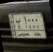

202_jpg.rf.9f4dc9aa70efdd9d3c0f3b5d51efd4142.jpg


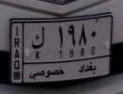

Best Angle: -5, Highest Max Value: 0.8906878321842063
Best Angle 2: -6, Highest Max Value 2: 0.8702532931570852


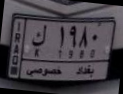

250_jpg.rf.16b52dd7548b1b0b8a257cc622bd96752.jpg


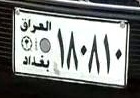

Best Angle: 7, Highest Max Value: 1.2673114137915076
Best Angle 2: 6, Highest Max Value 2: 1.1912916097501125


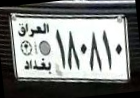

412_jpg.rf.a8e57465ce167d980d2c965ea98d77a1.jpg


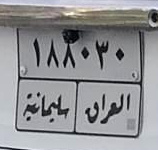

Best Angle: 0, Highest Max Value: 1.25
Best Angle 2: 2, Highest Max Value 2: 1.2329588408463907


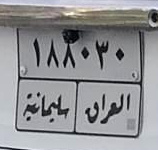

photo_2023-02-12_07-54-39_jpg.rf.80269e20499f0d6f78f4ed769c05349f.jpg


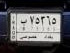

Best Angle: 0, Highest Max Value: 0.62
Best Angle 2: 1, Highest Max Value 2: 0.547053010949783


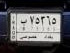

66_jpg.rf.47032f2c1c7d2a1bb2cbd7b9176df200.jpg


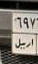

Best Angle: 0, Highest Max Value: 0.38
Best Angle 2: 1, Highest Max Value 2: 0.37592686088330596


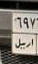

a-472-_JPG_jpg.rf.87e6f6d2712c3dc1394478dc3f4b121a.jpg


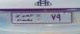

Best Angle: 0, Highest Max Value: 0.8
Best Angle 2: -1, Highest Max Value 2: 0.7943840335434905


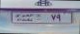

FB_IMG_1666327006200_jpg.rf.0447381f4960f83ba382316057795813.jpg


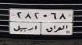

Best Angle: 0, Highest Max Value: 0.82
Best Angle 2: 1, Highest Max Value 2: 0.817443822496069


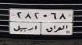

018_jpg.rf.c9d875cc92b9d4f9212f9955b988e299.jpg


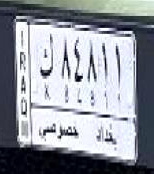

Best Angle: 8, Highest Max Value: 1.134421207291372
Best Angle 2: 6, Highest Max Value 2: 1.0896097742366206


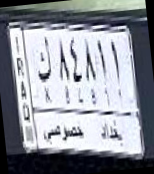

57_JPG_jpg.rf.79b17b9c6d51ef6357cc53a93f9a6e48.jpg


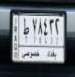

Best Angle: 0, Highest Max Value: 0.74
Best Angle 2: 1, Highest Max Value 2: 0.6957931983500142


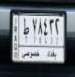

photo_2023-02-12_07-56-00_jpg.rf.f8aa64228e893d5cef23c18da903e58a.jpg


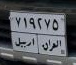

Best Angle: 5, Highest Max Value: 0.5959639425677935
Best Angle 2: 6, Highest Max Value 2: 0.5782097698635991


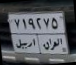

photo_2023-02-12_07-55-56_jpg.rf.f369cb5c0b55db4b2a838bf97e324549.jpg


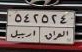

Best Angle: 0, Highest Max Value: 0.82
Best Angle 2: 1, Highest Max Value 2: 0.8135023503858995


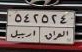

photo_2023-02-12_07-56-36_jpg.rf.7fa27e3d2e44c3d5f7b9413701ec6a9c.jpg


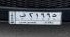

Best Angle: 2, Highest Max Value: 0.6613094785599166
Best Angle 2: 1, Highest Max Value 2: 0.659867261839961


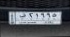

198_jpg.rf.2d0fce5d194de41debd20fe7525bf0f5.jpg


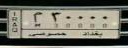

Best Angle: 0, Highest Max Value: 1.28
Best Angle 2: 1, Highest Max Value 2: 1.2570468440499651


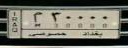

a-470-_JPG_jpg.rf.d28dd4a3ddf5d3bfa5dbb68c2d297de2.jpg


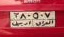

Best Angle: 0, Highest Max Value: 0.61
Best Angle 2: -1, Highest Max Value 2: 0.5561115795097712


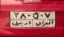

104_jpg.rf.0ed9868348ec11b38e0599fe313be3a0.jpg


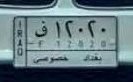

Best Angle: 0, Highest Max Value: 1.24
Best Angle 2: -1, Highest Max Value 2: 1.1510013672586383


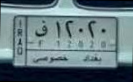

114_jpg.rf.518e09fd6bd2679e687ffcb503d6832a.jpg


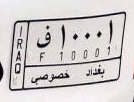

Best Angle: -5, Highest Max Value: 1.01764963526978
Best Angle 2: -4, Highest Max Value 2: 1.0053886531623022


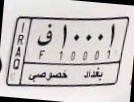

a-490-_JPG_jpg.rf.c299a3c25002c94bbee3a3f70c9bddd7.jpg


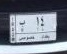

Best Angle: -3, Highest Max Value: 0.6507235598151975
Best Angle 2: -4, Highest Max Value 2: 0.6456131776480433


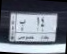

295_jpg.rf.0b85f848ffc971c682024a5cbeeee835.jpg


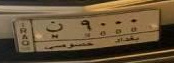

Best Angle: -4, Highest Max Value: 1.2960750550692988
Best Angle 2: -5, Highest Max Value 2: 1.2682715386184922


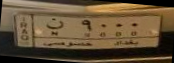

bz79_jpg.rf.40fbc09b9750d2ed30a5e4b386bc4f97.jpg


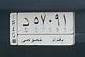

Best Angle: 0, Highest Max Value: 0.69
Best Angle 2: 1, Highest Max Value 2: 0.6549554823344473


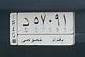

069_jpg.rf.5d9e8f2a22245542fb7a0f2a3ac55a2a.jpg


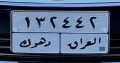

Best Angle: 0, Highest Max Value: 1.2
Best Angle 2: 1, Highest Max Value 2: 1.1154800441084654


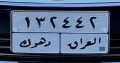

358_jpg.rf.33bb2be803624abd5f76e75cd71de719.jpg


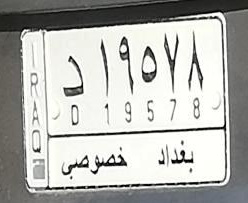

Best Angle: -2, Highest Max Value: 1.9680152532909798
Best Angle 2: -4, Highest Max Value 2: 1.8969969675707363


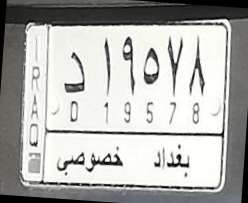

photo_2023-02-12_07-56-08_jpg.rf.f569df5a9fb39d40163b4e388e0a55b4.jpg


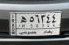

Best Angle: 0, Highest Max Value: 0.69
Best Angle 2: -1, Highest Max Value 2: 0.6865613023593704


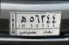

bz87_jpg.rf.3b8c887f07308d4258b65c2159e4de70.jpg


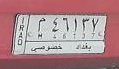

Best Angle: 0, Highest Max Value: 0.91
Best Angle 2: -1, Highest Max Value 2: 0.9082196179284145


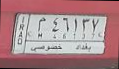

525_jpg.rf.f4816452469f63467f8fd69080e6c3e9.jpg


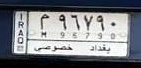

Best Angle: 1, Highest Max Value: 1.3601211329236618
Best Angle 2: 2, Highest Max Value 2: 1.3458310799227036


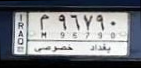

bz80_jpg.rf.e15c06df6283cec56fb4da9ed459e463.jpg


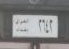

Best Angle: 0, Highest Max Value: 0.61
Best Angle 2: 1, Highest Max Value 2: 0.6074736656519342


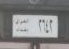

376_jpg.rf.88d386f3bfb41ca77131e36fed5291a3.jpg


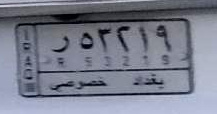

Best Angle: -3, Highest Max Value: 1.972813822117694
Best Angle 2: -1, Highest Max Value 2: 1.692564832820757


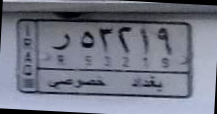

20_JPG_jpg.rf.189b6a17ae6d45d6dba9e06e5ecd01c8.jpg


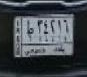

Best Angle: 0, Highest Max Value: 0.65
Best Angle 2: 6, Highest Max Value 2: 0.6335406730838187


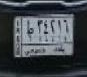

a-309-b_JPG_jpg.rf.f437b3fcc68f61a4bb6215d7808243be.jpg


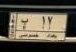

Best Angle: 0, Highest Max Value: 0.76
Best Angle 2: 1, Highest Max Value 2: 0.7570029431898287


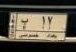

a-426-_JPG_jpg.rf.93081220d9e4d21f03946da46a1521c7.jpg


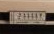

Best Angle: 0, Highest Max Value: 0.54
Best Angle 2: 1, Highest Max Value 2: 0.5330631532762932


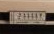

bz3_jpg.rf.8049d9be3bae1db1c43466c53592dbf2.jpg


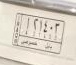

Best Angle: 11, Highest Max Value: 0.7187386638590886
Best Angle 2: 10, Highest Max Value 2: 0.7157355661296019


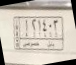

170_jpg.rf.e4dd4cb84a98dfc957c5b9b5cab6735e.jpg


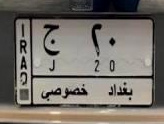

Best Angle: 1, Highest Max Value: 1.4433721416295497
Best Angle 2: 0, Highest Max Value 2: 1.42


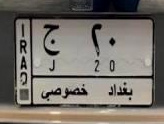

1_JPG_jpg.rf.ca2292efa05f502a389155610f637f07.jpg


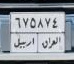

Best Angle: 0, Highest Max Value: 0.74
Best Angle 2: -1, Highest Max Value 2: 0.7361287998195283


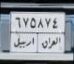

067_jpg.rf.1212c19bab5742c491b05439e0d9a3ab.jpg


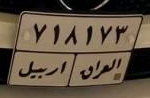

Best Angle: 1, Highest Max Value: 1.1658073162710836
Best Angle 2: 0, Highest Max Value 2: 1.12


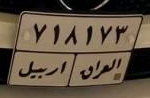

a-422-_JPG_jpg.rf.0c2ad4022a56e74513750500e4ea7c61.jpg


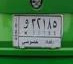

Best Angle: 0, Highest Max Value: 0.73
Best Angle 2: 1, Highest Max Value 2: 0.689843011184249


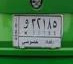

255_jpg.rf.7a2232c9b5532f446a4e9e1880c9db7e.jpg


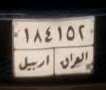

Best Angle: 0, Highest Max Value: 0.79
Best Angle 2: -3, Highest Max Value 2: 0.7791575443906633


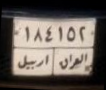

519_jpg.rf.07b1780b24590e3840b9c3d00b350004.jpg


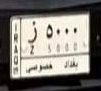

Best Angle: 0, Highest Max Value: 0.9
Best Angle 2: -7, Highest Max Value 2: 0.8639561122704003


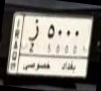

468_jpg.rf.96246de13438a5fa6fcbb79e4b22ce92.jpg


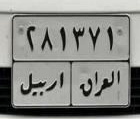

Best Angle: 0, Highest Max Value: 1.4
Best Angle 2: 2, Highest Max Value 2: 1.2533054466615596


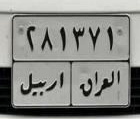

273_jpg.rf.529761297f07e9e58b68d9e72d89b302.jpg


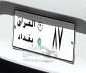

Best Angle: 14, Highest Max Value: 0.8080785005902483
Best Angle 2: 13, Highest Max Value 2: 0.8066509279281684


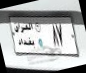

355_jpg.rf.6aa44c97377e52d8b9c9a1cc8f0106c5.jpg


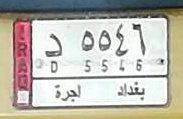

Best Angle: -1, Highest Max Value: 1.6521927834837016
Best Angle 2: -2, Highest Max Value 2: 1.5931005323295613


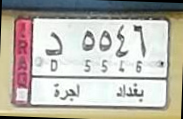

149_jpg.rf.e843eb92de61544b5776cfbd37764b0c.jpg


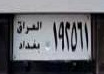

Best Angle: 0, Highest Max Value: 1.04
Best Angle 2: -1, Highest Max Value 2: 0.9242390399388748


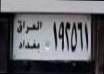

photo_2023-02-12_07-55-21_jpg.rf.fe797521d0af53d94c56c36696bc8452.jpg


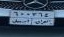

Best Angle: 0, Highest Max Value: 0.51
Best Angle 2: 3, Highest Max Value 2: 0.493713162742506


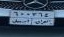

a-496-_JPG_jpg.rf.59980f92bcc481a6cad912952d2e4bfc.jpg


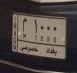

Best Angle: 8, Highest Max Value: 0.5471733613821425
Best Angle 2: 9, Highest Max Value 2: 0.5467369280197844


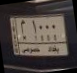

In [124]:
paths=os.listdir("/content/Arabic-plate")
for path in paths:
  if path.endswith(".jpg"):
    print(path)
    save_path='/content/rotate_images_ar/'+path
    image_read=cv2.imread("/content/Arabic-plate/"+path)
    thresh= preprocess_image("/content/Arabic-plate/"+path)

    cv2_imshow(image_read)
    (best_angle1, highest_max_value1), (best_angle2, highest_max_value2) = find_best_two_rotation_angles(thresh)
    print(f"Best Angle: {best_angle1}, Highest Max Value: {highest_max_value1}")
    print(f"Best Angle 2: {best_angle2}, Highest Max Value 2: {highest_max_value2}")
    rotate1=rotate_image_mine(image_read, min(best_angle1, best_angle2))
    cv2.imwrite(save_path, rotate1)
    cv2_imshow(rotate1)

In [ ]:
def resize_image(image_path, scale_factor, interpolation=cv2.INTER_CUBIC):
    # Read the image
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)

    # Get the original dimensions
    original_size = (image.shape[1], image.shape[0])  # (width, height)

    # Calculate the new dimensions
    new_size = (int(original_size[0] * scale_factor), int(original_size[1] * scale_factor))

    # Resize the image
    resized_image = cv2.resize(image, new_size, interpolation=interpolation)

    return resized_image
#scale_factor = 2  # Double the size of the image
# Example usage
#paths=os.listdir("/content/images_rotated")
#for path in paths:
#  if path.endswith(".jpg"):
#    resized_image = resize_image("/content/images_rotated/"+path, scale_factor, interpolation=cv2.INTER_LANCZOS4)
#    output_image_path = '/content/images_resized/RESIZED_'+path.split('/')[-1]
#    cv2.imwrite(output_image_path, resized_image)


In [ ]:
import cv2

cv2.imwrite("saved.jpg", resize_image("saved.jpg", 2))

True

In [ ]:
kernel = np.ones((3, 3), np.uint8)

# The first parameter is the original image,
# kernel is the matrix with which image is
# convolved and third parameter is the number
# of iterations, which will determine how much
# you want to erode/dilate a given image.
img_erosion = cv2.erode(thresh, kernel, iterations=1)
img_erosion
img_dilation = cv2.dilate(img_erosion, kernel, iterations=1)
img_dilation
cv2.imwrite("saved.jpg", thresh)

True

In [3]:
import os

def calculate_height_width_ratio(path):
    ratios = {}
    for label in os.listdir(os.path.join(path, "train", "labels")):
        with open(os.path.join(path, "train", "labels", label), "r") as f:
            lines = f.readlines()
            for line in lines:
                line = line.strip().split(" ")
                if len(line) != 5:
                    continue
                width, height = float(line[3]), float(line[4])
                class_id = int(line[0])
                if class_id in ratios.keys():
                    ratios[class_id].append(height/width)
                else:
                    ratios[class_id] = [height/width]
    return ratios

ratios = calculate_height_width_ratio("/content/c-2")

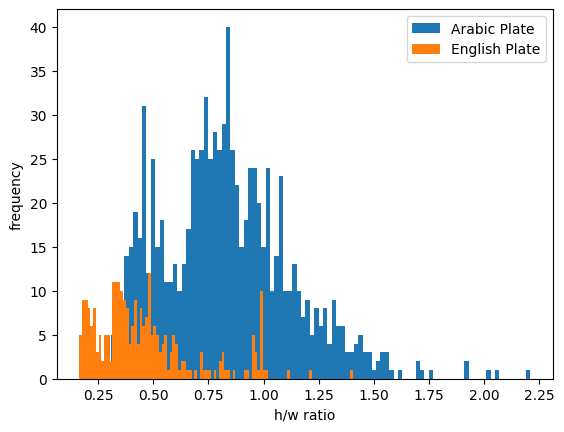

In [4]:
import matplotlib.pyplot as plt

plt.hist(ratios[0], bins=100, label="Arabic Plate")
plt.hist(ratios[1], bins=100, label="English Plate")
plt.xlabel("h/w ratio")
plt.ylabel("frequency")
plt.legend()

plt.show()

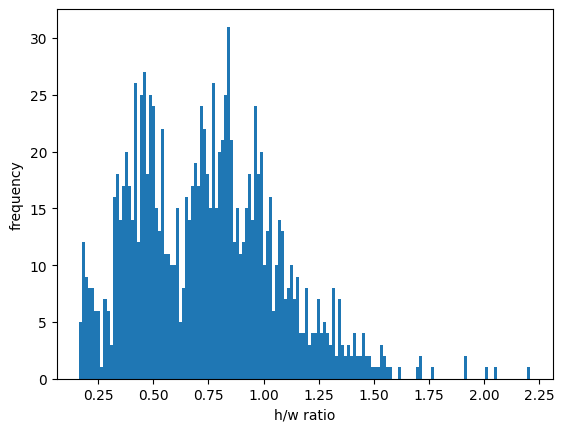

In [5]:
import matplotlib.pyplot as plt

all_data = ratios[0] + ratios[1]
plt.hist(all_data, bins=150)
plt.xlabel("h/w ratio")
plt.ylabel("frequency")
plt.show()

In [6]:
import statistics

def get_stats(data):
    "Returns the harmonic mean, mean, and standard deviation of a given dataset"
    return statistics.harmonic_mean(data), statistics.mean(data), statistics.stdev(data)

with open("bboxes_data.csv", "w") as f:
    f.write("Plate type, harmonic mean, mean, standard deviation\n")
    arabic_hm, arabic_mean, arabic_stdev = get_stats(ratios[0])
    f.write(f"Arabic Plate, {arabic_hm}, {arabic_mean}, {arabic_stdev}\n")
    english_hm, english_mean, english_stdev = get_stats(ratios[1])
    f.write(f"English Plate, {english_hm}, {english_mean}, {english_stdev}\n")
    hm, mean, stdev = get_stats(all_data)
    f.write(f"Total, {hm}, {mean}, {stdev}")

In [ ]:
# prompt: perform canny edge on the roatet image

edges = cv2.Canny(thresh, 50, 100)

cv2.imwrite('canny_edges.png', edges)
edges

array([[  0,   0,   0, ..., 255,   0,   0],
       [  0,   0,   0, ..., 255,   0,   0],
       [255, 255, 255, ..., 255,   0,   0],
       ...,
       [  0, 255,   0, ..., 255, 255,   0],
       [  0, 255,   0, ...,   0,   0,   0],
       [  0, 255,   0, ...,   0,   0,   0]], dtype=uint8)

In [96]:
def is_close_to_edge(x, y, w, h, image_height, threshold):
    # Check if close to the top
    close_to_top = y < threshold

    # Check if close to the bottom
    close_to_bottom = (y + h) > (image_height - threshold)

    return close_to_top, close_to_bottom

In [67]:
import cv2
import numpy as np
def visualize_canny_edges(image_path, low_threshold=50, high_threshold=100):
    # Load the image
    image = cv2.imread(image_path)

    # Convert to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Canny edge detector
    edges = cv2.Canny(gray_image, low_threshold, high_threshold)

    # Display the original and edge-detected images side by side
    combined_image = np.hstack((gray_image, edges))

    # Add text labels to differentiate between original and edge-detected images
    cv2.putText(combined_image, 'Original', (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    cv2.putText(combined_image, 'Edges', (gray_image.shape[1] + 10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

    # Show the combined image
    # cv2_imshow(edges)
    cv2.imwrite(f'./{image_path.split("/")[-1][:-3]}png', edges)

# Example usage
#image_path = "saved.jpg"  # Replace with your image path
#visualize_canny_edges(image_path)

In [135]:
import cv2
import csv

def adjust_contour(image, x, y, w, h):
    """
    Takes image with its best fit contour as input. Modifies contour to ensure whole license plate is captured.
    """
    print("we are adjusting")
    assert h != 0 and w != 0, "Invalid box dimensions"
    image_height, image_width, _ = image.shape
    #print(image.shape)


    #LP width should be at least 80% of bounding box width
    w = round(max(w, 0.8 * image_width))

    stat_file = "./bboxes_data.csv"

    #Extract average LP H/W ratio
    with open(stat_file, "r") as f:
         reader = csv.reader(f)
         line = None
         for row in reader:
              if row[0] == "Arabic Plate":
                   line = row
    _, harmonic_mean, mean, stdev = line
    harmonic_mean = float(harmonic_mean)
    mean = float(mean)
    stdev = float(stdev)
    #print(mean, stdev)

    #Ensure consistency with average ratio
    hw_ratio = h / w
   # print(hw_ratio)
    if hw_ratio < mean - stdev or hw_ratio> mean + 2 * stdev:
            h = round(h * (mean / hw_ratio))

    image_center_x, image_center_y = image_width // 2, image_height // 2
    #print(image_center_x, image_center_y)
    center_x, center_y = x + w // 2, y + h//2
    #print(center_x, center_y)
    if center_x < image_center_x - 0.05 * image_width or center_x > image_center_x + 0.05 * image_width:
        #If LP is not centered, move it to center of image
        print("Not x-centered")
        x = image_center_x - w//2
    if center_y < image_center_y - 0.1 * image_height or center_y > image_center_y + 0.1 * image_height:
        print("Not y-centered")
        y = image_center_y - h//2


    return x, y, w, h
#Example Usage
#image = cv2.imread("./raw_saved.jpg")
#adjust_contour(image, 67, 26, 9, 14)

In [141]:
import cv2
import numpy as np

def find_license_plate_boxes(edge_image, image_path):
    # Find contours in the edge-detected image
    contours, _ = cv2.findContours(edge_image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    # Initialize variables to hold the largest contours by area and perimeter
    largest_contour_area = None
    largest_contour_perimeter = None
    largest_area = 0
    largest_perimeter = 0

    # Loop through all detected contours
    for contour in contours:
        image = cv2.imread(image_path)
        cv2.drawContours(image, contour, -1, (0, 255, 0), 2)
        # Calculate the perimeter of the contour
        perimeter = cv2.arcLength(contour, True)
        # Approximate the contour
        approx = cv2.approxPolyDP(contour, 0.02 * perimeter, True)

        if 2 <= len(approx) <= 17:
            area = cv2.contourArea(contour)
            if perimeter > largest_perimeter:
                rect_perimeter = cv2.minAreaRect(contour)
                box_perimeter = cv2.boxPoints(rect_perimeter)
                box_perimeter = np.int0(box_perimeter)

                largest_contour_perimeter = contour
                largest_perimeter = perimeter

            # Update if the current contour has the largest area
            if area > largest_area:
                rect_area = cv2.minAreaRect(contour)
                box_area = cv2.boxPoints(rect_area)
                box_area = np.int0(box_area)

                largest_contour_area = contour
                largest_area = area

    # Check if any contours were found
    if largest_contour_area is not None and largest_contour_perimeter is not None:
        # Get bounding box coordinates for the largest area
        x_area, y_area, w_area, h_area = cv2.boundingRect(largest_contour_area)
        # print(x_area, y_area, w_area, h_area)
        # Adjust box to optimize fitting
        # Get bounding box coordinates for the largest perimeter
        x_perimeter, y_perimeter, w_perimeter, h_perimeter = cv2.boundingRect(largest_contour_perimeter)
        # print(x_perimeter, y_perimeter, w_perimeter, h_perimeter)
        # Adjust box to optimize fitting
        if w_perimeter * h_perimeter < 0.25 * edge_image.shape[0] * edge_image.shape[1] and w_area * h_area < 0.25 * edge_image.shape[0] * edge_image.shape[1]:
             x_perimeter, y_perimeter, w_perimeter, h_perimeter = adjust_contour(image, x_perimeter, y_perimeter, w_perimeter, h_perimeter)
             x_area, y_area, w_area, h_area = adjust_contour(image, x_area, y_area, w_area, h_area)

        # Determine which box has the largest area between the two
        box_area1 = w_area * h_area
        box_area2 = w_perimeter * h_perimeter
        image=cv2.imread(image_path)
        image_height, image_width, _ = image.shape
        print(image_height, image_width)
        if box_area1 > box_area2:
            centerX, centerY = x_area +( w_area// 2) , y_area +( h_area// 2)
            image_center_x, image_center_y = image_width // 2, image_height//2
            print(image_center_x, image_center_y)
            print(centerX, centerY)
            #print(center_x, center_y)
            if centerX < image_center_x - 0.05 * image_width or centerX > image_center_x + 0.05 * image_width:
                #If LP is not centered, move it to center of image
                print("Not x-centered")
                x_area, y_area, w_area, h_area = adjust_contour(image, x_area, y_area, w_area, h_area)
            if centerY < image_center_y - 0.1 * image_height or centerY > image_center_y + 0.1 * image_height:
                print("Not y-centered")
                x_area, y_area, w_area, h_area = adjust_contour(image, x_area, y_area, w_area, h_area)

            return (x_area, y_area, w_area, h_area), largest_contour_area
        else:
            centerX, centerY =x_perimeter+ ( w_perimeter//2) , y_perimeter+( h_perimeter// 2)
            image_center_x, image_center_y = image_width // 2, image_height//2
            print(image_center_x, image_center_y)
            print(centerX, centerY)
            #print(center_x, center_y)
            if centerX < image_center_x - 0.1 * image_width or centerX > image_center_x + 0.1 * image_width:
                #If LP is not centered, move it to center of image
                print("Not x-centered adjusting")
                x_perimeter, y_perimeter, w_perimeter, h_perimeter = adjust_contour(image, x_perimeter, y_perimeter, w_perimeter, h_perimeter)
            if centerY < image_center_y - 0.1 * image_height or centerY > image_center_y + 0.1 * image_height:
                print("Not y-centered adjusting")
                x_perimeter, y_perimeter, w_perimeter, h_perimeter = adjust_contour(image, x_perimeter, y_perimeter, w_perimeter, h_perimeter)
            return (x_perimeter, y_perimeter, w_perimeter, h_perimeter), largest_contour_perimeter
    else:
        raise ValueError("No suitable license plate contours detected.")

def visualize_license_plate_boxes(image_path, edge_image):
    # Load the original image

    image = cv2.imread(image_path)
    # Find the bounding boxes of the license plate
    bounding_box, contour = find_license_plate_boxes(edge_image,image_path)
    x, y, w, h = bounding_box
    # print("box area", w * h)
    # print("image area",image.shape[0]*image.shape[1])
    # Draw the bounding box on the image
    cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)

    cropped_image = image[y:y+h, x:x+w]

    # Save the cropped image
    cropped_image_path = "/content/images_cropped/"+image_path.split('/')[-1]
    print(cropped_image_path)
    cv2.imwrite(cropped_image_path, cropped_image)
    # Draw the contour

    # cv2.drawContours(image, [contour], -1, (255, 0, 0), 2)
    # Display the result
    cv2_imshow(image)


#edge_image = cv2.imread("./canny_edges.png", cv2.IMREAD_GRAYSCALE)
#visualize_license_plate_boxes("./raw_saved.jpg", edge_image)
# Example usage
#paths=os.listdir('/content/images_rotated')
#for path in paths:
#  path= "/content/images_rotated/"+path
#  print(path)
#  visualize_canny_edges(path)
#  edge_image_path = '/content/canny_edges.png'  # Replace with the path to your edge-detected image
#  image_path = path  # Replace with the path to your original image
#  edge_image = cv2.imread(edge_image_path, cv2.IMREAD_GRAYSCALE)
#  visualize_license_plate_boxes(image_path, edge_image)


In [139]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
def visualize_canny_edges(image_path, low_threshold=50, high_threshold=100):
    # Load the image
    image = cv2.imread(image_path)

    # Convert to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Canny edge detector
    edges = cv2.Canny(gray_image, low_threshold, high_threshold)

    # Display the original and edge-detected images side by side
    combined_image = np.hstack((gray_image, edges))

    # Add text labels to differentiate between original and edge-detected images
    cv2.putText(combined_image, 'Original', (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    cv2.putText(combined_image, 'Edges', (gray_image.shape[1] + 10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

    # Show the combined image
    # cv2_imshow(edges)
    cv2.imwrite('/content/canny_edges.png', edges)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

# Example usage
# image_path = "/content/images_rotated/5_jpg.rf.08e989a458736c430ac8684895d3050f.jpg"  # Replace with your image path
# visualize_canny_edges(image_path)


In [15]:
# prompt: cv2_imshow imprt colab

from google.colab.patches import cv2_imshow


/content/rotate_images_ar/417570965_1736849176812307_1723590590995587808_n_jpg.rf.dedfea8f854ec3a3addb7b059de3fd53.jpg
47 159
/content/images_cropped/417570965_1736849176812307_1723590590995587808_n_jpg.rf.dedfea8f854ec3a3addb7b059de3fd53.jpg


`np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
`np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)


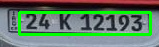

/content/rotate_images_ar/bz78_jpg.rf.181b56eb65783ad76608e88a4afde992.jpg
65 102
/content/images_cropped/bz78_jpg.rf.181b56eb65783ad76608e88a4afde992.jpg


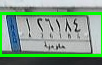

/content/rotate_images_ar/202_jpg.rf.9f4dc9aa70efdd9d3c0f3b5d51efd414.jpg
120 33
Not x-centered adjusting
/content/images_cropped/202_jpg.rf.9f4dc9aa70efdd9d3c0f3b5d51efd414.jpg


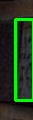

/content/rotate_images_ar/253_jpg.rf.97f44a1104240ca2dda69cf682d0287b.jpg
76 87
43 38
43 39
/content/images_cropped/253_jpg.rf.97f44a1104240ca2dda69cf682d0287b.jpg


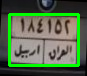

/content/rotate_images_ar/492_jpg.rf.6c93c21b17d0eb16d92292228a72837d.jpg
104 124
/content/images_cropped/492_jpg.rf.6c93c21b17d0eb16d92292228a72837d.jpg


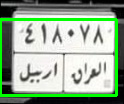

/content/rotate_images_ar/407_jpg.rf.e17304de116b6487450a4c63468485c4.jpg
130 237
/content/images_cropped/407_jpg.rf.e17304de116b6487450a4c63468485c4.jpg


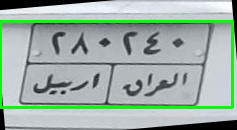

/content/rotate_images_ar/bz55_jpg.rf.530decdda9e06c7af61f364545a894ed.jpg
96 141
/content/images_cropped/bz55_jpg.rf.530decdda9e06c7af61f364545a894ed.jpg


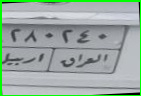

/content/rotate_images_ar/a-456-_JPG_jpg.rf.b5551402494918829089a8549bc7eca2.jpg
41 51
/content/images_cropped/a-456-_JPG_jpg.rf.b5551402494918829089a8549bc7eca2.jpg


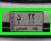

/content/rotate_images_ar/44_png.rf.aef019e084dafaf2c07358199d3e5cca.jpg
59 48
/content/images_cropped/44_png.rf.aef019e084dafaf2c07358199d3e5cca.jpg


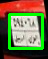

/content/rotate_images_ar/a-231-_JPG_jpg.rf.0da42755b6aa2101ef59ee2d60e2f409.jpg
83 71
/content/images_cropped/a-231-_JPG_jpg.rf.0da42755b6aa2101ef59ee2d60e2f409.jpg


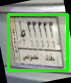

/content/rotate_images_ar/025_jpg.rf.5a308601e45fd68269101a3184322a2f.jpg
194 175
Not x-centered adjusting
Not y-centered adjusting
/content/images_cropped/025_jpg.rf.5a308601e45fd68269101a3184322a2f.jpg


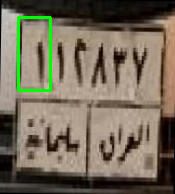

/content/rotate_images_ar/455_jpg.rf.c8b78f908b87cfb4f80fd1d1e4b15c23.jpg
146 244
/content/images_cropped/455_jpg.rf.c8b78f908b87cfb4f80fd1d1e4b15c23.jpg


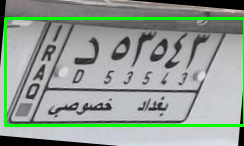

/content/rotate_images_ar/261_jpg.rf.693f3435e5f37f7e96599496c6a090a4.jpg
84 134
/content/images_cropped/261_jpg.rf.693f3435e5f37f7e96599496c6a090a4.jpg


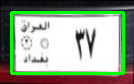

/content/rotate_images_ar/400_jpg.rf.28c6b1aa0f59d9fa4e1e81e5842dee76.jpg
148 185
92 74
91 74
/content/images_cropped/400_jpg.rf.28c6b1aa0f59d9fa4e1e81e5842dee76.jpg


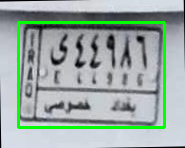

/content/rotate_images_ar/179_jpg.rf.922254f69ac3c9e73dddff1c93fafcb8.jpg
99 140
/content/images_cropped/179_jpg.rf.922254f69ac3c9e73dddff1c93fafcb8.jpg


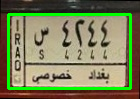

/content/rotate_images_ar/045_jpg.rf.6d856a6ca9bcf2ccb0b0dc6825797924.jpg
155 178
Not y-centered adjusting
/content/images_cropped/045_jpg.rf.6d856a6ca9bcf2ccb0b0dc6825797924.jpg


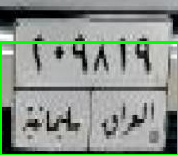

/content/rotate_images_ar/189_jpg.rf.b9d5b30ec71075a507f23d6622a1f7eb.jpg
98 155
/content/images_cropped/189_jpg.rf.b9d5b30ec71075a507f23d6622a1f7eb.jpg


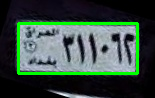

/content/rotate_images_ar/250_jpg.rf.16b52dd7548b1b0b8a257cc622bd9675.jpg
81 81
Not x-centered adjusting
/content/images_cropped/250_jpg.rf.16b52dd7548b1b0b8a257cc622bd9675.jpg


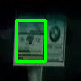

/content/rotate_images_ar/118_jpg.rf.26dcec77b4b7d16403942bca586889cc.jpg
127 157
/content/images_cropped/118_jpg.rf.26dcec77b4b7d16403942bca586889cc.jpg


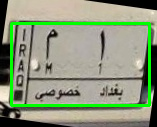

/content/rotate_images_ar/317_jpg.rf.8dc11c7ff9f4fccc2455716ea38f45b5.jpg
94 97
Not x-centered adjusting
/content/images_cropped/317_jpg.rf.8dc11c7ff9f4fccc2455716ea38f45b5.jpg


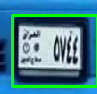

/content/rotate_images_ar/a-508-_JPG_jpg.rf.55721598ea577ef2c44ee790e23f194a.jpg
48 71
Not y-centered adjusting
/content/images_cropped/a-508-_JPG_jpg.rf.55721598ea577ef2c44ee790e23f194a.jpg


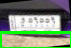

/content/rotate_images_ar/485_jpg.rf.91a743d8711bd0c0d86d74e1a60e342a2.jpg
56 43
/content/images_cropped/485_jpg.rf.91a743d8711bd0c0d86d74e1a60e342a2.jpg


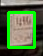

/content/rotate_images_ar/bz69_jpg.rf.f90cbc38fd48391f6f57ca1913b15a6c.jpg
74 92
46 37
47 37
/content/images_cropped/bz69_jpg.rf.f90cbc38fd48391f6f57ca1913b15a6c.jpg


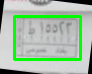

/content/rotate_images_ar/353_jpg.rf.87d68f4303f35d471d129867c8fc25a8.jpg
118 228
/content/images_cropped/353_jpg.rf.87d68f4303f35d471d129867c8fc25a8.jpg


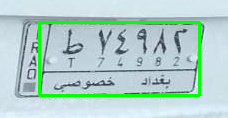

/content/rotate_images_ar/a-355-_JPG_jpg.rf.c85e2b56c5355e8e9c48e0a63e0d85f1.jpg
66 69
/content/images_cropped/a-355-_JPG_jpg.rf.c85e2b56c5355e8e9c48e0a63e0d85f1.jpg


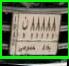

/content/rotate_images_ar/348_jpg.rf.93798dde0e7f8a7eca65ab22a3dec1cd.jpg
87 154
/content/images_cropped/348_jpg.rf.93798dde0e7f8a7eca65ab22a3dec1cd.jpg


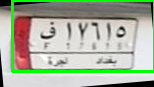

/content/rotate_images_ar/a-175-_JPG_jpg.rf.f6872354b69743328ccbe61c6d2ede9a.jpg
51 80
/content/images_cropped/a-175-_JPG_jpg.rf.f6872354b69743328ccbe61c6d2ede9a.jpg


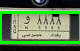

/content/rotate_images_ar/bz129_png_jpg.rf.b7b08ec9e96891391a2a41aa015e9082.jpg
51 80
/content/images_cropped/bz129_png_jpg.rf.b7b08ec9e96891391a2a41aa015e9082.jpg


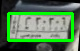

/content/rotate_images_ar/a-43-_JPG_jpg.rf.1f08691b9c8be739f8b0b76c83a051b2.jpg
42 55
/content/images_cropped/a-43-_JPG_jpg.rf.1f08691b9c8be739f8b0b76c83a051b2.jpg


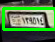

/content/rotate_images_ar/205_jpg.rf.c8534ffbadd4d84a06b929cc182f7efa.jpg
51 103
/content/images_cropped/205_jpg.rf.c8534ffbadd4d84a06b929cc182f7efa.jpg


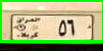

/content/rotate_images_ar/a-263-_JPG_jpg.rf.dc3116af80bd600f902fb689dd002137.jpg
45 44
Not y-centered adjusting
/content/images_cropped/a-263-_JPG_jpg.rf.dc3116af80bd600f902fb689dd002137.jpg


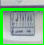

/content/rotate_images_ar/210_jpg.rf.476bda26faf9322e528e37228773adbc.jpg
110 136
/content/images_cropped/210_jpg.rf.476bda26faf9322e528e37228773adbc.jpg


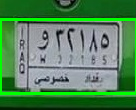

/content/rotate_images_ar/48_png.rf.f474577f25d41c4c25bfedae974bfa5f.jpg
68 65
Not x-centered adjusting
Not y-centered adjusting
/content/images_cropped/48_png.rf.f474577f25d41c4c25bfedae974bfa5f.jpg


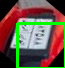

/content/rotate_images_ar/a-284-_JPG_jpg.rf.4481b55c37e387c5a9c1fdffe51a285e.jpg
66 65
Not y-centered adjusting
/content/images_cropped/a-284-_JPG_jpg.rf.4481b55c37e387c5a9c1fdffe51a285e.jpg


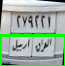

/content/rotate_images_ar/275_jpg.rf.1c12c068dc8301646e72d57b5317d59c.jpg
162 239
/content/images_cropped/275_jpg.rf.1c12c068dc8301646e72d57b5317d59c.jpg


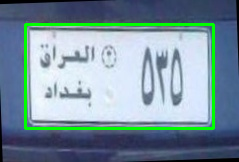

/content/rotate_images_ar/263_jpg.rf.17573144800e45c66a981c587ab1bc0c.jpg
57 189
/content/images_cropped/263_jpg.rf.17573144800e45c66a981c587ab1bc0c.jpg


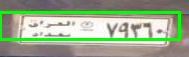

/content/rotate_images_ar/021_jpg.rf.241cea8f00dea616586dbdb05f793550.jpg
122 130
/content/images_cropped/021_jpg.rf.241cea8f00dea616586dbdb05f793550.jpg


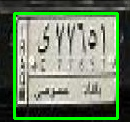

/content/rotate_images_ar/photo_2023-02-12_07-56-32_jpg.rf.63c68441075f11f27a3284747a18b580.jpg
56 57
Not y-centered adjusting
/content/images_cropped/photo_2023-02-12_07-56-32_jpg.rf.63c68441075f11f27a3284747a18b580.jpg


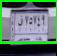

/content/rotate_images_ar/158_jpg.rf.a8ec1791f89b72973af805b1a5bad9ba.jpg
57 154
/content/images_cropped/158_jpg.rf.a8ec1791f89b72973af805b1a5bad9ba.jpg


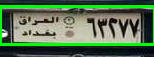

/content/rotate_images_ar/277_jpg.rf.8604d566b4baf5f879da8e224ec7071b.jpg
97 127
/content/images_cropped/277_jpg.rf.8604d566b4baf5f879da8e224ec7071b.jpg


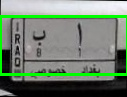

/content/rotate_images_ar/097_jpg.rf.910338ccbcf1af00c73f1075b2dd262a.jpg
94 128
/content/images_cropped/097_jpg.rf.910338ccbcf1af00c73f1075b2dd262a.jpg


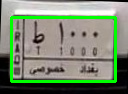

/content/rotate_images_ar/485_jpg.rf.91a743d8711bd0c0d86d74e1a60e342a.jpg
105 110
/content/images_cropped/485_jpg.rf.91a743d8711bd0c0d86d74e1a60e342a.jpg


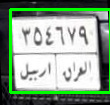

/content/rotate_images_ar/40_JPG_jpg.rf.bbb51bcaa32d153142537d1983c81323.jpg
71 81
Not x-centered adjusting
/content/images_cropped/40_JPG_jpg.rf.bbb51bcaa32d153142537d1983c81323.jpg


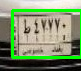

/content/rotate_images_ar/421_jpg.rf.d2d4d2ae5e3627243e0ea221bb656ed8.jpg
112 180
/content/images_cropped/421_jpg.rf.d2d4d2ae5e3627243e0ea221bb656ed8.jpg


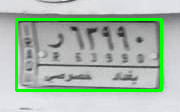

/content/rotate_images_ar/photo_2023-02-12_07-54-56_jpg.rf.92516d77badc2543d8bffc6f1f41e9ab.jpg
46 49
24 23
25 23
/content/images_cropped/photo_2023-02-12_07-54-56_jpg.rf.92516d77badc2543d8bffc6f1f41e9ab.jpg


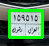

/content/rotate_images_ar/51_JPG_jpg.rf.3e30c08a07efe5bce09477cfa224ffe5.jpg
72 87
/content/images_cropped/51_JPG_jpg.rf.3e30c08a07efe5bce09477cfa224ffe5.jpg


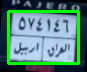

/content/rotate_images_ar/456_jpg.rf.ad8fe5bb75f2b47b732a6fb0ae50d3cd.jpg
75 190
/content/images_cropped/456_jpg.rf.ad8fe5bb75f2b47b732a6fb0ae50d3cd.jpg


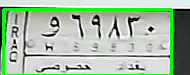

/content/rotate_images_ar/123_jpg.rf.97873db52d1ab7e497bd116fa8e3cea9.jpg
86 126
/content/images_cropped/123_jpg.rf.97873db52d1ab7e497bd116fa8e3cea9.jpg


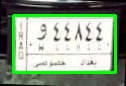

/content/rotate_images_ar/bz58_jpg.rf.da83a9281d1c72989a4332ab6bfb32f0.jpg
115 173
/content/images_cropped/bz58_jpg.rf.da83a9281d1c72989a4332ab6bfb32f0.jpg


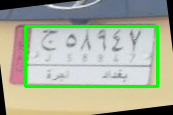

/content/rotate_images_ar/a-531-_JPG_jpg.rf.5fe6da22d2d3e80837db140a6ebd96d4.jpg
38 72
36 19
37 19
/content/images_cropped/a-531-_JPG_jpg.rf.5fe6da22d2d3e80837db140a6ebd96d4.jpg


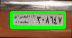

/content/rotate_images_ar/1_jpg.rf.e0d71bfac749526f7f57a7274f7f8f1e.jpg
61 60
/content/images_cropped/1_jpg.rf.e0d71bfac749526f7f57a7274f7f8f1e.jpg


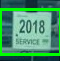

/content/rotate_images_ar/172_jpg.rf.aa7ca09a3e8687c73097ebb21557252d.jpg
72 99
/content/images_cropped/172_jpg.rf.aa7ca09a3e8687c73097ebb21557252d.jpg


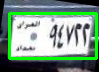

/content/rotate_images_ar/photo_2023-02-12_07-56-20_jpg.rf.791f8d34c744c7f5eb0e15b189e6f081.jpg
36 79
/content/images_cropped/photo_2023-02-12_07-56-20_jpg.rf.791f8d34c744c7f5eb0e15b189e6f081.jpg


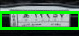

/content/rotate_images_ar/446_jpg.rf.059eb703dd4fff7bf0228e7121f89285.jpg
117 221
/content/images_cropped/446_jpg.rf.059eb703dd4fff7bf0228e7121f89285.jpg


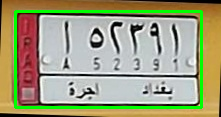

/content/rotate_images_ar/187_jpg.rf.e5d71253f97f384eefb42f5305069326.jpg
75 109
54 37
53 35
/content/images_cropped/187_jpg.rf.e5d71253f97f384eefb42f5305069326.jpg


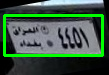

/content/rotate_images_ar/41_JPG_jpg.rf.7b7685d0f27ddb3a84b215305cc82087.jpg
78 77
Not x-centered adjusting
/content/images_cropped/41_JPG_jpg.rf.7b7685d0f27ddb3a84b215305cc82087.jpg


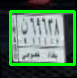

/content/rotate_images_ar/a-265-_JPG_jpg.rf.e281de964ca208f66d56fbdf8920b212.jpg
55 64
/content/images_cropped/a-265-_JPG_jpg.rf.e281de964ca208f66d56fbdf8920b212.jpg


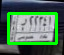

/content/rotate_images_ar/photo_2024-01-29_02-26-55_jpg.rf.73dccdd8631503038b65e74fe6c90d2d.jpg
50 48
/content/images_cropped/photo_2024-01-29_02-26-55_jpg.rf.73dccdd8631503038b65e74fe6c90d2d.jpg


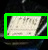

/content/rotate_images_ar/011_jpg.rf.b2fd2d2ba617f08597b1fe82093187f0.jpg
144 175
Not x-centered adjusting
/content/images_cropped/011_jpg.rf.b2fd2d2ba617f08597b1fe82093187f0.jpg


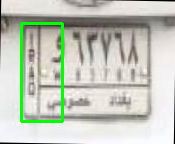

/content/rotate_images_ar/332_jpg.rf.42ca7240b94167a38f4bcef555091abe.jpg
69 131
/content/images_cropped/332_jpg.rf.42ca7240b94167a38f4bcef555091abe.jpg


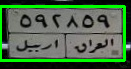

/content/rotate_images_ar/a-150-_JPG_jpg.rf.943095372214be178cb0c5f22c341320.jpg
52 53
Not x-centered adjusting
/content/images_cropped/a-150-_JPG_jpg.rf.943095372214be178cb0c5f22c341320.jpg


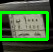

/content/rotate_images_ar/202_jpg.rf.9f4dc9aa70efdd9d3c0f3b5d51efd4142.jpg
94 123
/content/images_cropped/202_jpg.rf.9f4dc9aa70efdd9d3c0f3b5d51efd4142.jpg


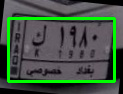

/content/rotate_images_ar/250_jpg.rf.16b52dd7548b1b0b8a257cc622bd96752.jpg
98 140
/content/images_cropped/250_jpg.rf.16b52dd7548b1b0b8a257cc622bd96752.jpg


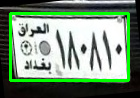

/content/rotate_images_ar/412_jpg.rf.a8e57465ce167d980d2c965ea98d77a1.jpg
150 158
Not x-centered adjusting
Not y-centered adjusting
/content/images_cropped/412_jpg.rf.a8e57465ce167d980d2c965ea98d77a1.jpg


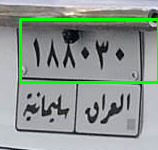

/content/rotate_images_ar/photo_2023-02-12_07-54-39_jpg.rf.80269e20499f0d6f78f4ed769c05349f.jpg
53 70
35 26
35 27
/content/images_cropped/photo_2023-02-12_07-54-39_jpg.rf.80269e20499f0d6f78f4ed769c05349f.jpg


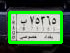

/content/rotate_images_ar/66_jpg.rf.47032f2c1c7d2a1bb2cbd7b9176df200.jpg
64 38
Not x-centered adjusting
Not y-centered adjusting
/content/images_cropped/66_jpg.rf.47032f2c1c7d2a1bb2cbd7b9176df200.jpg


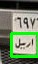

/content/rotate_images_ar/a-472-_JPG_jpg.rf.87e6f6d2712c3dc1394478dc3f4b121a.jpg
34 80
/content/images_cropped/a-472-_JPG_jpg.rf.87e6f6d2712c3dc1394478dc3f4b121a.jpg


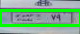

/content/rotate_images_ar/FB_IMG_1666327006200_jpg.rf.0447381f4960f83ba382316057795813.jpg
45 82
/content/images_cropped/FB_IMG_1666327006200_jpg.rf.0447381f4960f83ba382316057795813.jpg


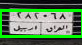

/content/rotate_images_ar/018_jpg.rf.c9d875cc92b9d4f9212f9955b988e299.jpg
174 154
/content/images_cropped/018_jpg.rf.c9d875cc92b9d4f9212f9955b988e299.jpg


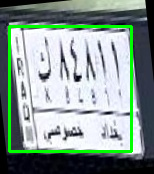

/content/rotate_images_ar/57_JPG_jpg.rf.79b17b9c6d51ef6357cc53a93f9a6e48.jpg
77 75
/content/images_cropped/57_JPG_jpg.rf.79b17b9c6d51ef6357cc53a93f9a6e48.jpg


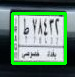

/content/rotate_images_ar/photo_2023-02-12_07-56-00_jpg.rf.f8aa64228e893d5cef23c18da903e58a.jpg
65 76
/content/images_cropped/photo_2023-02-12_07-56-00_jpg.rf.f8aa64228e893d5cef23c18da903e58a.jpg


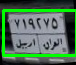

/content/rotate_images_ar/photo_2023-02-12_07-55-56_jpg.rf.f369cb5c0b55db4b2a838bf97e324549.jpg
52 82
Not y-centered adjusting
/content/images_cropped/photo_2023-02-12_07-55-56_jpg.rf.f369cb5c0b55db4b2a838bf97e324549.jpg


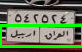

/content/rotate_images_ar/photo_2023-02-12_07-56-36_jpg.rf.7fa27e3d2e44c3d5f7b9413701ec6a9c.jpg
37 70
/content/images_cropped/photo_2023-02-12_07-56-36_jpg.rf.7fa27e3d2e44c3d5f7b9413701ec6a9c.jpg


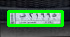

/content/rotate_images_ar/198_jpg.rf.2d0fce5d194de41debd20fe7525bf0f5.jpg
48 128
/content/images_cropped/198_jpg.rf.2d0fce5d194de41debd20fe7525bf0f5.jpg


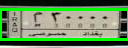

/content/rotate_images_ar/a-470-_JPG_jpg.rf.d28dd4a3ddf5d3bfa5dbb68c2d297de2.jpg
37 64
/content/images_cropped/a-470-_JPG_jpg.rf.d28dd4a3ddf5d3bfa5dbb68c2d297de2.jpg


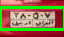

/content/rotate_images_ar/104_jpg.rf.0ed9868348ec11b38e0599fe313be3a0.jpg
82 133
/content/images_cropped/104_jpg.rf.0ed9868348ec11b38e0599fe313be3a0.jpg


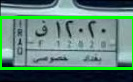

/content/rotate_images_ar/114_jpg.rf.518e09fd6bd2679e687ffcb503d6832a.jpg
102 134
67 51
67 51
/content/images_cropped/114_jpg.rf.518e09fd6bd2679e687ffcb503d6832a.jpg


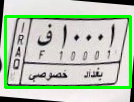

/content/rotate_images_ar/a-490-_JPG_jpg.rf.c299a3c25002c94bbee3a3f70c9bddd7.jpg
54 67
/content/images_cropped/a-490-_JPG_jpg.rf.c299a3c25002c94bbee3a3f70c9bddd7.jpg


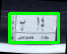

/content/rotate_images_ar/295_jpg.rf.0b85f848ffc971c682024a5cbeeee835.jpg
63 174
/content/images_cropped/295_jpg.rf.0b85f848ffc971c682024a5cbeeee835.jpg


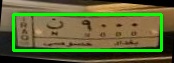

/content/rotate_images_ar/bz79_jpg.rf.40fbc09b9750d2ed30a5e4b386bc4f97.jpg
57 85
42 28
47 29
Not x-centered
/content/images_cropped/bz79_jpg.rf.40fbc09b9750d2ed30a5e4b386bc4f97.jpg


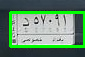

/content/rotate_images_ar/069_jpg.rf.5d9e8f2a22245542fb7a0f2a3ac55a2a.jpg
63 120
/content/images_cropped/069_jpg.rf.5d9e8f2a22245542fb7a0f2a3ac55a2a.jpg


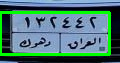

/content/rotate_images_ar/358_jpg.rf.33bb2be803624abd5f76e75cd71de719.jpg
203 248
Not y-centered adjusting
/content/images_cropped/358_jpg.rf.33bb2be803624abd5f76e75cd71de719.jpg


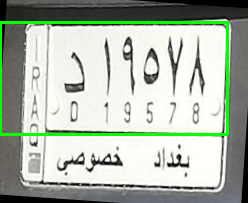

/content/rotate_images_ar/photo_2023-02-12_07-56-08_jpg.rf.f569df5a9fb39d40163b4e388e0a55b4.jpg
45 69
/content/images_cropped/photo_2023-02-12_07-56-08_jpg.rf.f569df5a9fb39d40163b4e388e0a55b4.jpg


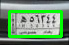

/content/rotate_images_ar/bz87_jpg.rf.3b8c887f07308d4258b65c2159e4de70.jpg
69 119
59 34
58 34
/content/images_cropped/bz87_jpg.rf.3b8c887f07308d4258b65c2159e4de70.jpg


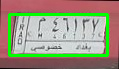

/content/rotate_images_ar/525_jpg.rf.f4816452469f63467f8fd69080e6c3e9.jpg
68 141
70 34
72 34
/content/images_cropped/525_jpg.rf.f4816452469f63467f8fd69080e6c3e9.jpg


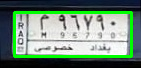

/content/rotate_images_ar/bz80_jpg.rf.e15c06df6283cec56fb4da9ed459e463.jpg
49 69
/content/images_cropped/bz80_jpg.rf.e15c06df6283cec56fb4da9ed459e463.jpg


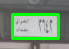

/content/rotate_images_ar/376_jpg.rf.88d386f3bfb41ca77131e36fed5291a3.jpg
114 217
/content/images_cropped/376_jpg.rf.88d386f3bfb41ca77131e36fed5291a3.jpg


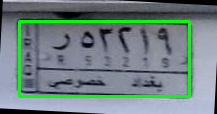

/content/rotate_images_ar/20_JPG_jpg.rf.189b6a17ae6d45d6dba9e06e5ecd01c8.jpg
77 87
/content/images_cropped/20_JPG_jpg.rf.189b6a17ae6d45d6dba9e06e5ecd01c8.jpg


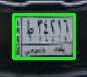

/content/rotate_images_ar/a-309-b_JPG_jpg.rf.f437b3fcc68f61a4bb6215d7808243be.jpg
52 76
Not x-centered adjusting
/content/images_cropped/a-309-b_JPG_jpg.rf.f437b3fcc68f61a4bb6215d7808243be.jpg


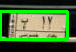

/content/rotate_images_ar/a-426-_JPG_jpg.rf.93081220d9e4d21f03946da46a1521c7.jpg
34 54
/content/images_cropped/a-426-_JPG_jpg.rf.93081220d9e4d21f03946da46a1521c7.jpg


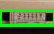

/content/rotate_images_ar/bz3_jpg.rf.8049d9be3bae1db1c43466c53592dbf2.jpg
65 76
/content/images_cropped/bz3_jpg.rf.8049d9be3bae1db1c43466c53592dbf2.jpg


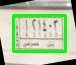

/content/rotate_images_ar/170_jpg.rf.e4dd4cb84a98dfc957c5b9b5cab6735e.jpg
124 164
82 62
92 47
Not x-centered
Not y-centered
/content/images_cropped/170_jpg.rf.e4dd4cb84a98dfc957c5b9b5cab6735e.jpg


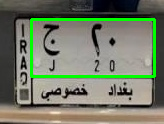

/content/rotate_images_ar/1_JPG_jpg.rf.ca2292efa05f502a389155610f637f07.jpg
64 74
/content/images_cropped/1_JPG_jpg.rf.ca2292efa05f502a389155610f637f07.jpg


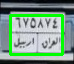

/content/rotate_images_ar/067_jpg.rf.1212c19bab5742c491b05439e0d9a3ab.jpg
98 150
/content/images_cropped/067_jpg.rf.1212c19bab5742c491b05439e0d9a3ab.jpg


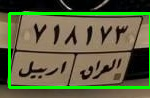

/content/rotate_images_ar/a-422-_JPG_jpg.rf.0c2ad4022a56e74513750500e4ea7c61.jpg
64 73
/content/images_cropped/a-422-_JPG_jpg.rf.0c2ad4022a56e74513750500e4ea7c61.jpg


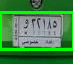

/content/rotate_images_ar/255_jpg.rf.7a2232c9b5532f446a4e9e1880c9db7e.jpg
90 106
/content/images_cropped/255_jpg.rf.7a2232c9b5532f446a4e9e1880c9db7e.jpg


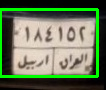

/content/rotate_images_ar/519_jpg.rf.07b1780b24590e3840b9c3d00b350004.jpg
91 101
/content/images_cropped/519_jpg.rf.07b1780b24590e3840b9c3d00b350004.jpg


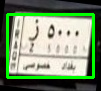

/content/rotate_images_ar/468_jpg.rf.96246de13438a5fa6fcbb79e4b22ce92.jpg
119 140
/content/images_cropped/468_jpg.rf.96246de13438a5fa6fcbb79e4b22ce92.jpg


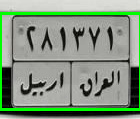

/content/rotate_images_ar/273_jpg.rf.529761297f07e9e58b68d9e72d89b302.jpg
73 86
/content/images_cropped/273_jpg.rf.529761297f07e9e58b68d9e72d89b302.jpg


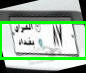

/content/rotate_images_ar/355_jpg.rf.6aa44c97377e52d8b9c9a1cc8f0106c5.jpg
119 183
/content/images_cropped/355_jpg.rf.6aa44c97377e52d8b9c9a1cc8f0106c5.jpg


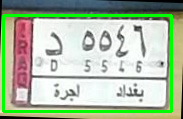

/content/rotate_images_ar/149_jpg.rf.e843eb92de61544b5776cfbd37764b0c.jpg
74 104
/content/images_cropped/149_jpg.rf.e843eb92de61544b5776cfbd37764b0c.jpg


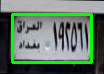

/content/rotate_images_ar/photo_2023-02-12_07-55-21_jpg.rf.fe797521d0af53d94c56c36696bc8452.jpg
37 64
/content/images_cropped/photo_2023-02-12_07-55-21_jpg.rf.fe797521d0af53d94c56c36696bc8452.jpg


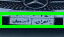

/content/rotate_images_ar/a-496-_JPG_jpg.rf.59980f92bcc481a6cad912952d2e4bfc.jpg
73 77
38 36
39 35
/content/images_cropped/a-496-_JPG_jpg.rf.59980f92bcc481a6cad912952d2e4bfc.jpg


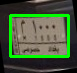

In [133]:
import os

paths=os.listdir('/content/rotate_images_ar')
for path in paths:
  path= "/content/rotate_images_ar/"+path
  print(path)
  visualize_canny_edges(path)
  edge_image_path = '/content/canny_edges.png'  # Replace with the path to your edge-detected image
  image_path = path  # Replace with the path to your original image
  edge_image = cv2.imread(edge_image_path, cv2.IMREAD_GRAYSCALE)
  visualize_license_plate_boxes(image_path, edge_image)


/content/rotate_images_ar/417570965_1736849176812307_1723590590995587808_n_jpg.rf.dedfea8f854ec3a3addb7b059de3fd53.jpg
47 159
/content/images_cropped/417570965_1736849176812307_1723590590995587808_n_jpg.rf.dedfea8f854ec3a3addb7b059de3fd53.jpg


`np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
`np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)


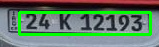

/content/rotate_images_ar/bz78_jpg.rf.181b56eb65783ad76608e88a4afde992.jpg
65 102
/content/images_cropped/bz78_jpg.rf.181b56eb65783ad76608e88a4afde992.jpg


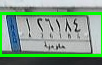

/content/rotate_images_ar/202_jpg.rf.9f4dc9aa70efdd9d3c0f3b5d51efd414.jpg
120 33
Not x-centered adjusting
we are adjusting
Not x-centered
Not y-centered
/content/images_cropped/202_jpg.rf.9f4dc9aa70efdd9d3c0f3b5d51efd414.jpg


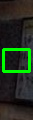

/content/rotate_images_ar/253_jpg.rf.97f44a1104240ca2dda69cf682d0287b.jpg
76 87
43 38
43 39
/content/images_cropped/253_jpg.rf.97f44a1104240ca2dda69cf682d0287b.jpg


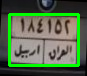

/content/rotate_images_ar/492_jpg.rf.6c93c21b17d0eb16d92292228a72837d.jpg
104 124
/content/images_cropped/492_jpg.rf.6c93c21b17d0eb16d92292228a72837d.jpg


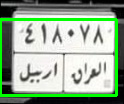

/content/rotate_images_ar/407_jpg.rf.e17304de116b6487450a4c63468485c4.jpg
130 237
/content/images_cropped/407_jpg.rf.e17304de116b6487450a4c63468485c4.jpg


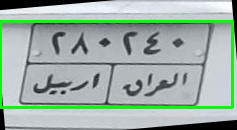

/content/rotate_images_ar/bz55_jpg.rf.530decdda9e06c7af61f364545a894ed.jpg
96 141
/content/images_cropped/bz55_jpg.rf.530decdda9e06c7af61f364545a894ed.jpg


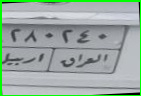

/content/rotate_images_ar/a-456-_JPG_jpg.rf.b5551402494918829089a8549bc7eca2.jpg
41 51
/content/images_cropped/a-456-_JPG_jpg.rf.b5551402494918829089a8549bc7eca2.jpg


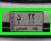

/content/rotate_images_ar/44_png.rf.aef019e084dafaf2c07358199d3e5cca.jpg
59 48
/content/images_cropped/44_png.rf.aef019e084dafaf2c07358199d3e5cca.jpg


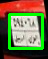

/content/rotate_images_ar/a-231-_JPG_jpg.rf.0da42755b6aa2101ef59ee2d60e2f409.jpg
83 71
/content/images_cropped/a-231-_JPG_jpg.rf.0da42755b6aa2101ef59ee2d60e2f409.jpg


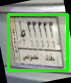

/content/rotate_images_ar/025_jpg.rf.5a308601e45fd68269101a3184322a2f.jpg
we are adjusting
Not y-centered
we are adjusting
Not x-centered
194 175
/content/images_cropped/025_jpg.rf.5a308601e45fd68269101a3184322a2f.jpg


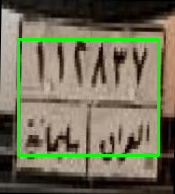

/content/rotate_images_ar/455_jpg.rf.c8b78f908b87cfb4f80fd1d1e4b15c23.jpg
146 244
/content/images_cropped/455_jpg.rf.c8b78f908b87cfb4f80fd1d1e4b15c23.jpg


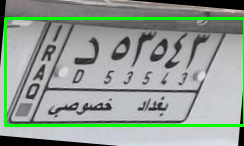

/content/rotate_images_ar/261_jpg.rf.693f3435e5f37f7e96599496c6a090a4.jpg
84 134
/content/images_cropped/261_jpg.rf.693f3435e5f37f7e96599496c6a090a4.jpg


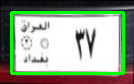

/content/rotate_images_ar/400_jpg.rf.28c6b1aa0f59d9fa4e1e81e5842dee76.jpg
148 185
92 74
91 74
/content/images_cropped/400_jpg.rf.28c6b1aa0f59d9fa4e1e81e5842dee76.jpg


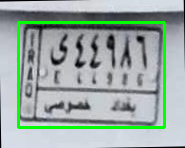

/content/rotate_images_ar/179_jpg.rf.922254f69ac3c9e73dddff1c93fafcb8.jpg
99 140
/content/images_cropped/179_jpg.rf.922254f69ac3c9e73dddff1c93fafcb8.jpg


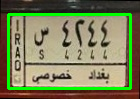

/content/rotate_images_ar/045_jpg.rf.6d856a6ca9bcf2ccb0b0dc6825797924.jpg
155 178
Not y-centered adjusting
we are adjusting
Not y-centered
/content/images_cropped/045_jpg.rf.6d856a6ca9bcf2ccb0b0dc6825797924.jpg


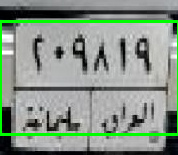

/content/rotate_images_ar/189_jpg.rf.b9d5b30ec71075a507f23d6622a1f7eb.jpg
98 155
/content/images_cropped/189_jpg.rf.b9d5b30ec71075a507f23d6622a1f7eb.jpg


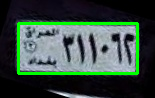

/content/rotate_images_ar/250_jpg.rf.16b52dd7548b1b0b8a257cc622bd9675.jpg
we are adjusting
Not x-centered
we are adjusting
Not x-centered
81 81
40 40
40 47
/content/images_cropped/250_jpg.rf.16b52dd7548b1b0b8a257cc622bd9675.jpg


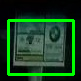

/content/rotate_images_ar/118_jpg.rf.26dcec77b4b7d16403942bca586889cc.jpg
127 157
/content/images_cropped/118_jpg.rf.26dcec77b4b7d16403942bca586889cc.jpg


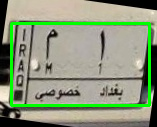

/content/rotate_images_ar/317_jpg.rf.8dc11c7ff9f4fccc2455716ea38f45b5.jpg
94 97
/content/images_cropped/317_jpg.rf.8dc11c7ff9f4fccc2455716ea38f45b5.jpg


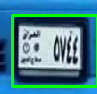

/content/rotate_images_ar/a-508-_JPG_jpg.rf.55721598ea577ef2c44ee790e23f194a.jpg
48 71
Not y-centered adjusting
we are adjusting
Not y-centered
/content/images_cropped/a-508-_JPG_jpg.rf.55721598ea577ef2c44ee790e23f194a.jpg


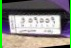

/content/rotate_images_ar/485_jpg.rf.91a743d8711bd0c0d86d74e1a60e342a2.jpg
56 43
/content/images_cropped/485_jpg.rf.91a743d8711bd0c0d86d74e1a60e342a2.jpg


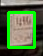

/content/rotate_images_ar/bz69_jpg.rf.f90cbc38fd48391f6f57ca1913b15a6c.jpg
74 92
46 37
47 37
/content/images_cropped/bz69_jpg.rf.f90cbc38fd48391f6f57ca1913b15a6c.jpg


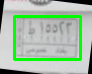

/content/rotate_images_ar/353_jpg.rf.87d68f4303f35d471d129867c8fc25a8.jpg
118 228
/content/images_cropped/353_jpg.rf.87d68f4303f35d471d129867c8fc25a8.jpg


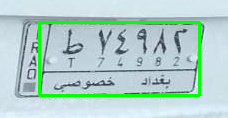

/content/rotate_images_ar/a-355-_JPG_jpg.rf.c85e2b56c5355e8e9c48e0a63e0d85f1.jpg
66 69
/content/images_cropped/a-355-_JPG_jpg.rf.c85e2b56c5355e8e9c48e0a63e0d85f1.jpg


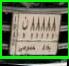

/content/rotate_images_ar/348_jpg.rf.93798dde0e7f8a7eca65ab22a3dec1cd.jpg
87 154
/content/images_cropped/348_jpg.rf.93798dde0e7f8a7eca65ab22a3dec1cd.jpg


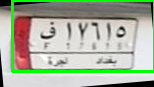

/content/rotate_images_ar/a-175-_JPG_jpg.rf.f6872354b69743328ccbe61c6d2ede9a.jpg
51 80
/content/images_cropped/a-175-_JPG_jpg.rf.f6872354b69743328ccbe61c6d2ede9a.jpg


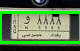

/content/rotate_images_ar/bz129_png_jpg.rf.b7b08ec9e96891391a2a41aa015e9082.jpg
51 80
/content/images_cropped/bz129_png_jpg.rf.b7b08ec9e96891391a2a41aa015e9082.jpg


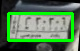

/content/rotate_images_ar/a-43-_JPG_jpg.rf.1f08691b9c8be739f8b0b76c83a051b2.jpg
42 55
/content/images_cropped/a-43-_JPG_jpg.rf.1f08691b9c8be739f8b0b76c83a051b2.jpg


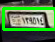

/content/rotate_images_ar/205_jpg.rf.c8534ffbadd4d84a06b929cc182f7efa.jpg
51 103
/content/images_cropped/205_jpg.rf.c8534ffbadd4d84a06b929cc182f7efa.jpg


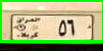

/content/rotate_images_ar/a-263-_JPG_jpg.rf.dc3116af80bd600f902fb689dd002137.jpg
45 44
Not y-centered adjusting
we are adjusting
Not y-centered
/content/images_cropped/a-263-_JPG_jpg.rf.dc3116af80bd600f902fb689dd002137.jpg


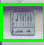

/content/rotate_images_ar/210_jpg.rf.476bda26faf9322e528e37228773adbc.jpg
110 136
/content/images_cropped/210_jpg.rf.476bda26faf9322e528e37228773adbc.jpg


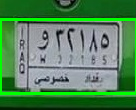

/content/rotate_images_ar/48_png.rf.f474577f25d41c4c25bfedae974bfa5f.jpg
68 65
Not x-centered adjusting
we are adjusting
Not x-centered
Not y-centered
Not y-centered adjusting
we are adjusting
/content/images_cropped/48_png.rf.f474577f25d41c4c25bfedae974bfa5f.jpg


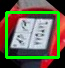

/content/rotate_images_ar/a-284-_JPG_jpg.rf.4481b55c37e387c5a9c1fdffe51a285e.jpg
66 65
Not y-centered adjusting
we are adjusting
Not y-centered
/content/images_cropped/a-284-_JPG_jpg.rf.4481b55c37e387c5a9c1fdffe51a285e.jpg


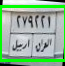

/content/rotate_images_ar/275_jpg.rf.1c12c068dc8301646e72d57b5317d59c.jpg
162 239
/content/images_cropped/275_jpg.rf.1c12c068dc8301646e72d57b5317d59c.jpg


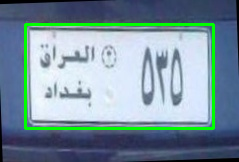

/content/rotate_images_ar/263_jpg.rf.17573144800e45c66a981c587ab1bc0c.jpg
57 189
/content/images_cropped/263_jpg.rf.17573144800e45c66a981c587ab1bc0c.jpg


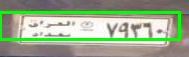

/content/rotate_images_ar/021_jpg.rf.241cea8f00dea616586dbdb05f793550.jpg
122 130
/content/images_cropped/021_jpg.rf.241cea8f00dea616586dbdb05f793550.jpg


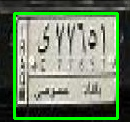

/content/rotate_images_ar/photo_2023-02-12_07-56-32_jpg.rf.63c68441075f11f27a3284747a18b580.jpg
56 57
Not y-centered adjusting
we are adjusting
Not y-centered
/content/images_cropped/photo_2023-02-12_07-56-32_jpg.rf.63c68441075f11f27a3284747a18b580.jpg


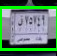

/content/rotate_images_ar/158_jpg.rf.a8ec1791f89b72973af805b1a5bad9ba.jpg
57 154
/content/images_cropped/158_jpg.rf.a8ec1791f89b72973af805b1a5bad9ba.jpg


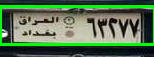

/content/rotate_images_ar/277_jpg.rf.8604d566b4baf5f879da8e224ec7071b.jpg
97 127
/content/images_cropped/277_jpg.rf.8604d566b4baf5f879da8e224ec7071b.jpg


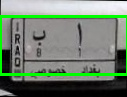

/content/rotate_images_ar/097_jpg.rf.910338ccbcf1af00c73f1075b2dd262a.jpg
94 128
/content/images_cropped/097_jpg.rf.910338ccbcf1af00c73f1075b2dd262a.jpg


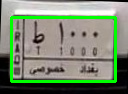

/content/rotate_images_ar/485_jpg.rf.91a743d8711bd0c0d86d74e1a60e342a.jpg
105 110
/content/images_cropped/485_jpg.rf.91a743d8711bd0c0d86d74e1a60e342a.jpg


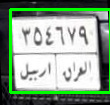

/content/rotate_images_ar/40_JPG_jpg.rf.bbb51bcaa32d153142537d1983c81323.jpg
71 81
/content/images_cropped/40_JPG_jpg.rf.bbb51bcaa32d153142537d1983c81323.jpg


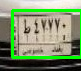

/content/rotate_images_ar/421_jpg.rf.d2d4d2ae5e3627243e0ea221bb656ed8.jpg
112 180
/content/images_cropped/421_jpg.rf.d2d4d2ae5e3627243e0ea221bb656ed8.jpg


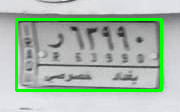

/content/rotate_images_ar/photo_2023-02-12_07-54-56_jpg.rf.92516d77badc2543d8bffc6f1f41e9ab.jpg
46 49
24 23
25 23
/content/images_cropped/photo_2023-02-12_07-54-56_jpg.rf.92516d77badc2543d8bffc6f1f41e9ab.jpg


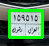

/content/rotate_images_ar/51_JPG_jpg.rf.3e30c08a07efe5bce09477cfa224ffe5.jpg
72 87
/content/images_cropped/51_JPG_jpg.rf.3e30c08a07efe5bce09477cfa224ffe5.jpg


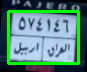

/content/rotate_images_ar/456_jpg.rf.ad8fe5bb75f2b47b732a6fb0ae50d3cd.jpg
75 190
/content/images_cropped/456_jpg.rf.ad8fe5bb75f2b47b732a6fb0ae50d3cd.jpg


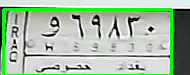

/content/rotate_images_ar/123_jpg.rf.97873db52d1ab7e497bd116fa8e3cea9.jpg
86 126
/content/images_cropped/123_jpg.rf.97873db52d1ab7e497bd116fa8e3cea9.jpg


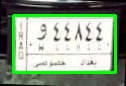

/content/rotate_images_ar/bz58_jpg.rf.da83a9281d1c72989a4332ab6bfb32f0.jpg
115 173
/content/images_cropped/bz58_jpg.rf.da83a9281d1c72989a4332ab6bfb32f0.jpg


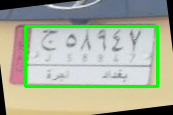

/content/rotate_images_ar/a-531-_JPG_jpg.rf.5fe6da22d2d3e80837db140a6ebd96d4.jpg
38 72
36 19
37 19
/content/images_cropped/a-531-_JPG_jpg.rf.5fe6da22d2d3e80837db140a6ebd96d4.jpg


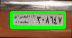

/content/rotate_images_ar/1_jpg.rf.e0d71bfac749526f7f57a7274f7f8f1e.jpg
61 60
/content/images_cropped/1_jpg.rf.e0d71bfac749526f7f57a7274f7f8f1e.jpg


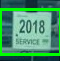

/content/rotate_images_ar/172_jpg.rf.aa7ca09a3e8687c73097ebb21557252d.jpg
72 99
/content/images_cropped/172_jpg.rf.aa7ca09a3e8687c73097ebb21557252d.jpg


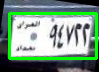

/content/rotate_images_ar/photo_2023-02-12_07-56-20_jpg.rf.791f8d34c744c7f5eb0e15b189e6f081.jpg
36 79
/content/images_cropped/photo_2023-02-12_07-56-20_jpg.rf.791f8d34c744c7f5eb0e15b189e6f081.jpg


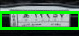

/content/rotate_images_ar/446_jpg.rf.059eb703dd4fff7bf0228e7121f89285.jpg
117 221
/content/images_cropped/446_jpg.rf.059eb703dd4fff7bf0228e7121f89285.jpg


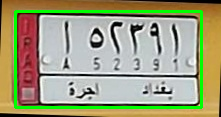

/content/rotate_images_ar/187_jpg.rf.e5d71253f97f384eefb42f5305069326.jpg
75 109
54 37
53 35
/content/images_cropped/187_jpg.rf.e5d71253f97f384eefb42f5305069326.jpg


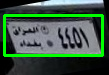

/content/rotate_images_ar/41_JPG_jpg.rf.7b7685d0f27ddb3a84b215305cc82087.jpg
78 77
/content/images_cropped/41_JPG_jpg.rf.7b7685d0f27ddb3a84b215305cc82087.jpg


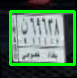

/content/rotate_images_ar/a-265-_JPG_jpg.rf.e281de964ca208f66d56fbdf8920b212.jpg
55 64
/content/images_cropped/a-265-_JPG_jpg.rf.e281de964ca208f66d56fbdf8920b212.jpg


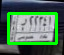

/content/rotate_images_ar/photo_2024-01-29_02-26-55_jpg.rf.73dccdd8631503038b65e74fe6c90d2d.jpg
50 48
/content/images_cropped/photo_2024-01-29_02-26-55_jpg.rf.73dccdd8631503038b65e74fe6c90d2d.jpg


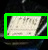

/content/rotate_images_ar/011_jpg.rf.b2fd2d2ba617f08597b1fe82093187f0.jpg
we are adjusting
we are adjusting
Not x-centered
Not y-centered
144 175
87 72
87 72
/content/images_cropped/011_jpg.rf.b2fd2d2ba617f08597b1fe82093187f0.jpg


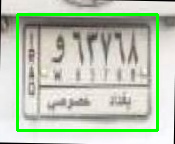

/content/rotate_images_ar/332_jpg.rf.42ca7240b94167a38f4bcef555091abe.jpg
69 131
/content/images_cropped/332_jpg.rf.42ca7240b94167a38f4bcef555091abe.jpg


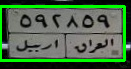

/content/rotate_images_ar/a-150-_JPG_jpg.rf.943095372214be178cb0c5f22c341320.jpg
52 53
/content/images_cropped/a-150-_JPG_jpg.rf.943095372214be178cb0c5f22c341320.jpg


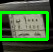

/content/rotate_images_ar/202_jpg.rf.9f4dc9aa70efdd9d3c0f3b5d51efd4142.jpg
94 123
/content/images_cropped/202_jpg.rf.9f4dc9aa70efdd9d3c0f3b5d51efd4142.jpg


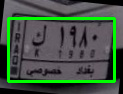

/content/rotate_images_ar/250_jpg.rf.16b52dd7548b1b0b8a257cc622bd96752.jpg
98 140
/content/images_cropped/250_jpg.rf.16b52dd7548b1b0b8a257cc622bd96752.jpg


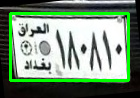

/content/rotate_images_ar/412_jpg.rf.a8e57465ce167d980d2c965ea98d77a1.jpg
150 158
Not y-centered adjusting
we are adjusting
Not x-centered
/content/images_cropped/412_jpg.rf.a8e57465ce167d980d2c965ea98d77a1.jpg


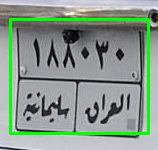

/content/rotate_images_ar/photo_2023-02-12_07-54-39_jpg.rf.80269e20499f0d6f78f4ed769c05349f.jpg
53 70
35 26
35 27
/content/images_cropped/photo_2023-02-12_07-54-39_jpg.rf.80269e20499f0d6f78f4ed769c05349f.jpg


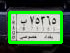

/content/rotate_images_ar/66_jpg.rf.47032f2c1c7d2a1bb2cbd7b9176df200.jpg
64 38
Not x-centered adjusting
we are adjusting
Not x-centered
Not y-centered
Not y-centered adjusting
we are adjusting
/content/images_cropped/66_jpg.rf.47032f2c1c7d2a1bb2cbd7b9176df200.jpg


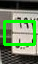

/content/rotate_images_ar/a-472-_JPG_jpg.rf.87e6f6d2712c3dc1394478dc3f4b121a.jpg
34 80
/content/images_cropped/a-472-_JPG_jpg.rf.87e6f6d2712c3dc1394478dc3f4b121a.jpg


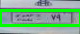

/content/rotate_images_ar/FB_IMG_1666327006200_jpg.rf.0447381f4960f83ba382316057795813.jpg
45 82
/content/images_cropped/FB_IMG_1666327006200_jpg.rf.0447381f4960f83ba382316057795813.jpg


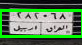

/content/rotate_images_ar/018_jpg.rf.c9d875cc92b9d4f9212f9955b988e299.jpg
174 154
/content/images_cropped/018_jpg.rf.c9d875cc92b9d4f9212f9955b988e299.jpg


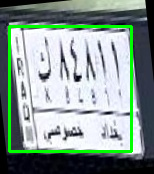

/content/rotate_images_ar/57_JPG_jpg.rf.79b17b9c6d51ef6357cc53a93f9a6e48.jpg
77 75
/content/images_cropped/57_JPG_jpg.rf.79b17b9c6d51ef6357cc53a93f9a6e48.jpg


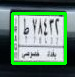

/content/rotate_images_ar/photo_2023-02-12_07-56-00_jpg.rf.f8aa64228e893d5cef23c18da903e58a.jpg
65 76
/content/images_cropped/photo_2023-02-12_07-56-00_jpg.rf.f8aa64228e893d5cef23c18da903e58a.jpg


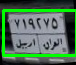

/content/rotate_images_ar/photo_2023-02-12_07-55-56_jpg.rf.f369cb5c0b55db4b2a838bf97e324549.jpg
52 82
Not y-centered adjusting
we are adjusting
Not y-centered
/content/images_cropped/photo_2023-02-12_07-55-56_jpg.rf.f369cb5c0b55db4b2a838bf97e324549.jpg


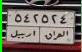

/content/rotate_images_ar/photo_2023-02-12_07-56-36_jpg.rf.7fa27e3d2e44c3d5f7b9413701ec6a9c.jpg
37 70
/content/images_cropped/photo_2023-02-12_07-56-36_jpg.rf.7fa27e3d2e44c3d5f7b9413701ec6a9c.jpg


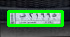

/content/rotate_images_ar/198_jpg.rf.2d0fce5d194de41debd20fe7525bf0f5.jpg
48 128
/content/images_cropped/198_jpg.rf.2d0fce5d194de41debd20fe7525bf0f5.jpg


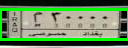

/content/rotate_images_ar/a-470-_JPG_jpg.rf.d28dd4a3ddf5d3bfa5dbb68c2d297de2.jpg
37 64
/content/images_cropped/a-470-_JPG_jpg.rf.d28dd4a3ddf5d3bfa5dbb68c2d297de2.jpg


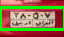

/content/rotate_images_ar/104_jpg.rf.0ed9868348ec11b38e0599fe313be3a0.jpg
82 133
/content/images_cropped/104_jpg.rf.0ed9868348ec11b38e0599fe313be3a0.jpg


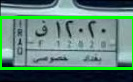

/content/rotate_images_ar/114_jpg.rf.518e09fd6bd2679e687ffcb503d6832a.jpg
102 134
67 51
67 51
/content/images_cropped/114_jpg.rf.518e09fd6bd2679e687ffcb503d6832a.jpg


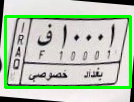

/content/rotate_images_ar/a-490-_JPG_jpg.rf.c299a3c25002c94bbee3a3f70c9bddd7.jpg
54 67
/content/images_cropped/a-490-_JPG_jpg.rf.c299a3c25002c94bbee3a3f70c9bddd7.jpg


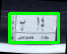

/content/rotate_images_ar/295_jpg.rf.0b85f848ffc971c682024a5cbeeee835.jpg
63 174
/content/images_cropped/295_jpg.rf.0b85f848ffc971c682024a5cbeeee835.jpg


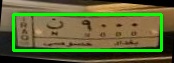

/content/rotate_images_ar/bz79_jpg.rf.40fbc09b9750d2ed30a5e4b386bc4f97.jpg
57 85
42 28
47 29
Not x-centered
we are adjusting
Not x-centered
Not y-centered
/content/images_cropped/bz79_jpg.rf.40fbc09b9750d2ed30a5e4b386bc4f97.jpg


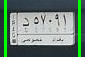

/content/rotate_images_ar/069_jpg.rf.5d9e8f2a22245542fb7a0f2a3ac55a2a.jpg
63 120
/content/images_cropped/069_jpg.rf.5d9e8f2a22245542fb7a0f2a3ac55a2a.jpg


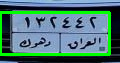

/content/rotate_images_ar/358_jpg.rf.33bb2be803624abd5f76e75cd71de719.jpg
203 248
Not y-centered adjusting
we are adjusting
/content/images_cropped/358_jpg.rf.33bb2be803624abd5f76e75cd71de719.jpg


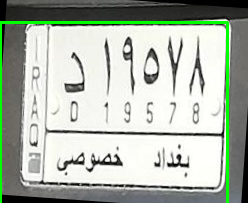

/content/rotate_images_ar/photo_2023-02-12_07-56-08_jpg.rf.f569df5a9fb39d40163b4e388e0a55b4.jpg
45 69
/content/images_cropped/photo_2023-02-12_07-56-08_jpg.rf.f569df5a9fb39d40163b4e388e0a55b4.jpg


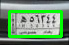

/content/rotate_images_ar/bz87_jpg.rf.3b8c887f07308d4258b65c2159e4de70.jpg
69 119
59 34
58 34
/content/images_cropped/bz87_jpg.rf.3b8c887f07308d4258b65c2159e4de70.jpg


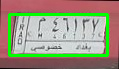

/content/rotate_images_ar/525_jpg.rf.f4816452469f63467f8fd69080e6c3e9.jpg
68 141
70 34
72 34
/content/images_cropped/525_jpg.rf.f4816452469f63467f8fd69080e6c3e9.jpg


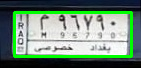

/content/rotate_images_ar/bz80_jpg.rf.e15c06df6283cec56fb4da9ed459e463.jpg
49 69
/content/images_cropped/bz80_jpg.rf.e15c06df6283cec56fb4da9ed459e463.jpg


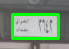

/content/rotate_images_ar/376_jpg.rf.88d386f3bfb41ca77131e36fed5291a3.jpg
114 217
/content/images_cropped/376_jpg.rf.88d386f3bfb41ca77131e36fed5291a3.jpg


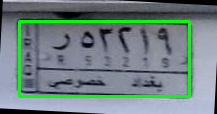

/content/rotate_images_ar/20_JPG_jpg.rf.189b6a17ae6d45d6dba9e06e5ecd01c8.jpg
77 87
/content/images_cropped/20_JPG_jpg.rf.189b6a17ae6d45d6dba9e06e5ecd01c8.jpg


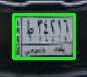

/content/rotate_images_ar/a-309-b_JPG_jpg.rf.f437b3fcc68f61a4bb6215d7808243be.jpg
52 76
/content/images_cropped/a-309-b_JPG_jpg.rf.f437b3fcc68f61a4bb6215d7808243be.jpg


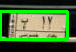

/content/rotate_images_ar/a-426-_JPG_jpg.rf.93081220d9e4d21f03946da46a1521c7.jpg
34 54
/content/images_cropped/a-426-_JPG_jpg.rf.93081220d9e4d21f03946da46a1521c7.jpg


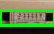

/content/rotate_images_ar/bz3_jpg.rf.8049d9be3bae1db1c43466c53592dbf2.jpg
65 76
/content/images_cropped/bz3_jpg.rf.8049d9be3bae1db1c43466c53592dbf2.jpg


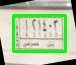

/content/rotate_images_ar/170_jpg.rf.e4dd4cb84a98dfc957c5b9b5cab6735e.jpg
124 164
82 62
92 47
Not x-centered
we are adjusting
Not x-centered
Not y-centered
we are adjusting
/content/images_cropped/170_jpg.rf.e4dd4cb84a98dfc957c5b9b5cab6735e.jpg


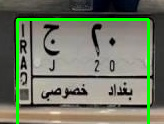

/content/rotate_images_ar/1_JPG_jpg.rf.ca2292efa05f502a389155610f637f07.jpg
64 74
/content/images_cropped/1_JPG_jpg.rf.ca2292efa05f502a389155610f637f07.jpg


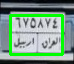

/content/rotate_images_ar/067_jpg.rf.1212c19bab5742c491b05439e0d9a3ab.jpg
98 150
/content/images_cropped/067_jpg.rf.1212c19bab5742c491b05439e0d9a3ab.jpg


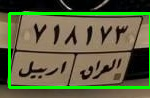

/content/rotate_images_ar/a-422-_JPG_jpg.rf.0c2ad4022a56e74513750500e4ea7c61.jpg
64 73
/content/images_cropped/a-422-_JPG_jpg.rf.0c2ad4022a56e74513750500e4ea7c61.jpg


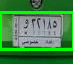

/content/rotate_images_ar/255_jpg.rf.7a2232c9b5532f446a4e9e1880c9db7e.jpg
90 106
/content/images_cropped/255_jpg.rf.7a2232c9b5532f446a4e9e1880c9db7e.jpg


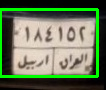

/content/rotate_images_ar/519_jpg.rf.07b1780b24590e3840b9c3d00b350004.jpg
91 101
/content/images_cropped/519_jpg.rf.07b1780b24590e3840b9c3d00b350004.jpg


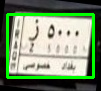

/content/rotate_images_ar/468_jpg.rf.96246de13438a5fa6fcbb79e4b22ce92.jpg
119 140
/content/images_cropped/468_jpg.rf.96246de13438a5fa6fcbb79e4b22ce92.jpg


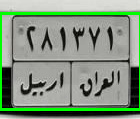

/content/rotate_images_ar/273_jpg.rf.529761297f07e9e58b68d9e72d89b302.jpg
73 86
/content/images_cropped/273_jpg.rf.529761297f07e9e58b68d9e72d89b302.jpg


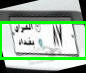

/content/rotate_images_ar/355_jpg.rf.6aa44c97377e52d8b9c9a1cc8f0106c5.jpg
119 183
/content/images_cropped/355_jpg.rf.6aa44c97377e52d8b9c9a1cc8f0106c5.jpg


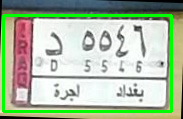

/content/rotate_images_ar/149_jpg.rf.e843eb92de61544b5776cfbd37764b0c.jpg
74 104
/content/images_cropped/149_jpg.rf.e843eb92de61544b5776cfbd37764b0c.jpg


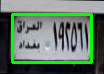

/content/rotate_images_ar/photo_2023-02-12_07-55-21_jpg.rf.fe797521d0af53d94c56c36696bc8452.jpg
37 64
/content/images_cropped/photo_2023-02-12_07-55-21_jpg.rf.fe797521d0af53d94c56c36696bc8452.jpg


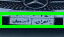

/content/rotate_images_ar/a-496-_JPG_jpg.rf.59980f92bcc481a6cad912952d2e4bfc.jpg
73 77
38 36
39 35
/content/images_cropped/a-496-_JPG_jpg.rf.59980f92bcc481a6cad912952d2e4bfc.jpg


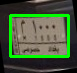

In [142]:
import os

paths=os.listdir('/content/rotate_images_ar')
for path in paths:
  path= "/content/rotate_images_ar/"+path
  print(path)
  visualize_canny_edges(path)
  edge_image_path = '/content/canny_edges.png'  # Replace with the path to your edge-detected image
  image_path = path  # Replace with the path to your original image
  edge_image = cv2.imread(edge_image_path, cv2.IMREAD_GRAYSCALE)
  visualize_license_plate_boxes(image_path, edge_image)


/content/rotated_images/189_jpg.rf.b9d5b30ec71075a507f23d6622a1f7eb.jpg
13 11 188 47
box area 8836
image area 14892


`np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
`np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)


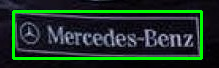

/content/images_cropped/189_jpg.rf.b9d5b30ec71075a507f23d6622a1f7eb.jpg


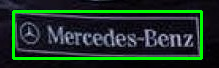

/content/rotated_images/70-1-_jpg.rf.d441ae9ef94c029ffcbfe74b95b8f4de.jpg
11 10 45 9
box area 1188
image area 3069


/content/images_cropped/70-1-_jpg.rf.d441ae9ef94c029ffcbfe74b95b8f4de.jpg


/content/rotated_images/419173054_777935504164308_496264249723982035_n_jpg.rf.7fe782987e9a6766473a034b8eb1b156.jpg
3 10 125 18
box area 2250
image area 4860


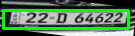

/content/images_cropped/419173054_777935504164308_496264249723982035_n_jpg.rf.7fe782987e9a6766473a034b8eb1b156.jpg


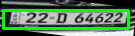

/content/rotated_images/firstframe.jpg
22 13 18 8
box area 144
image area 1568


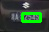

/content/images_cropped/firstframe.jpg


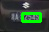

/content/rotated_images/5_jpg.rf.08e989a458736c430ac8684895d3050f.jpg
5 22 90 21
box area 1890
image area 6305


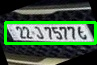

/content/images_cropped/5_jpg.rf.08e989a458736c430ac8684895d3050f.jpg


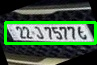

/content/rotated_images/58_jpg.rf.0f7e465b5f8d3acd39e43dcadb31b7f0.jpg
13 15 196 60
box area 11760
image area 20930


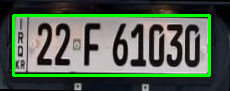

/content/images_cropped/58_jpg.rf.0f7e465b5f8d3acd39e43dcadb31b7f0.jpg


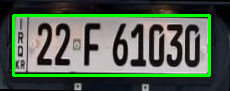

/content/rotated_images/14_jpg.rf.aaa3db98a8f0e3c867c91b2ec427bc8c.jpg
7 21 160 50
box area 8000
image area 17363


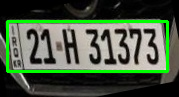

/content/images_cropped/14_jpg.rf.aaa3db98a8f0e3c867c91b2ec427bc8c.jpg


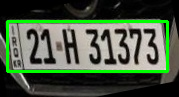

/content/rotated_images/70-13-_jpg.rf.fa2aea14b2828cc01a9b67c6c3cea43a.jpg
22 27 17 21
box area 3332
image area 8968


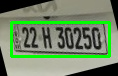

/content/images_cropped/70-13-_jpg.rf.fa2aea14b2828cc01a9b67c6c3cea43a.jpg


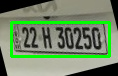

/content/rotated_images/428479596_2083530045364234_3401595779526985803_n_jpg.rf.e04cce7bf1401b66fa7418d2f531d39b.jpg
0 19 103 45
box area 4635
image area 9844


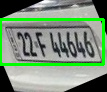

/content/images_cropped/428479596_2083530045364234_3401595779526985803_n_jpg.rf.e04cce7bf1401b66fa7418d2f531d39b.jpg


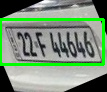

/content/rotated_images/417364312_1068529891141645_6625828181421494034_n_jpg.rf.f3d71e0a025ad3d1237b0a7c137fb060.jpg
24 12 32 11
box area 897
image area 2484


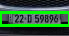

/content/images_cropped/417364312_1068529891141645_6625828181421494034_n_jpg.rf.f3d71e0a025ad3d1237b0a7c137fb060.jpg


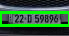

/content/rotated_images/52_jpg.rf.b397e1748e6adf4dadcfdb061d72aaf2.jpg
0 0 64 32
box area 2960
image area 3920


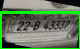

/content/images_cropped/52_jpg.rf.b397e1748e6adf4dadcfdb061d72aaf2.jpg


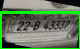

/content/rotated_images/427667093_1133225274664600_1272288515667003555_n_jpg.rf.fe8ee31a87b81f2b3c76095f0dfec927.jpg
0 13 93 39
box area 3627
image area 6603


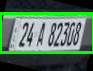

/content/images_cropped/427667093_1133225274664600_1272288515667003555_n_jpg.rf.fe8ee31a87b81f2b3c76095f0dfec927.jpg


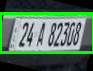

/content/rotated_images/427649041_308812638842663_5019511625679107493_n_jpg.rf.9998e3a09980c149e92cd23bf3219022.jpg
134 15 29 18
box area 4420
image area 9400


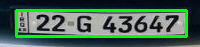

/content/images_cropped/427649041_308812638842663_5019511625679107493_n_jpg.rf.9998e3a09980c149e92cd23bf3219022.jpg


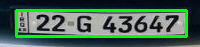

/content/rotated_images/419420193_2608644655967002_1421768417040176403_n_jpg.rf.e39b11b7b14e404ebe939432f104b554.jpg
18 16 13 13
box area 1292
image area 3813


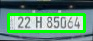

/content/images_cropped/419420193_2608644655967002_1421768417040176403_n_jpg.rf.e39b11b7b14e404ebe939432f104b554.jpg


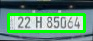

/content/rotated_images/27_png.rf.b0b8716a131c0677226f471ab3678c72.jpg
16 19 12 18
box area 2310
image area 4312


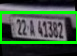

/content/images_cropped/27_png.rf.b0b8716a131c0677226f471ab3678c72.jpg


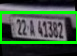

/content/rotated_images/15_png.rf.0976cfbb500a2152e1a3fc0c1a4e5857.jpg
20 22 13 19
box area 2117
image area 6080


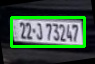

/content/images_cropped/15_png.rf.0976cfbb500a2152e1a3fc0c1a4e5857.jpg


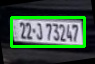

/content/rotated_images/57_jpg.rf.4d70900ecf4c5af1e6db08e7fc1fc015.jpg
16 18 47 16
box area 752
image area 3479


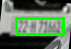

/content/images_cropped/57_jpg.rf.4d70900ecf4c5af1e6db08e7fc1fc015.jpg


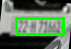

/content/rotated_images/14_jpg.rf.f1c081d395119dc3a3b80a247afbffc1.jpg
0 13 86 26
box area 2236
image area 3870


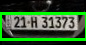

/content/images_cropped/14_jpg.rf.f1c081d395119dc3a3b80a247afbffc1.jpg


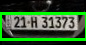

/content/rotated_images/1_jpg.rf.e0d71bfac749526f7f57a7274f7f8f1e.jpg
10 15 120 37
box area 4440
image area 8460


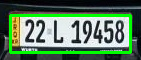

/content/images_cropped/1_jpg.rf.e0d71bfac749526f7f57a7274f7f8f1e.jpg


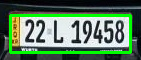

/content/rotated_images/13_jpg.rf.1665f839ba5e9b114f2e32a62ddd2005.jpg
83 26 21 30
box area 3627
image area 9360


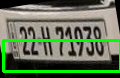

/content/images_cropped/13_jpg.rf.1665f839ba5e9b114f2e32a62ddd2005.jpg


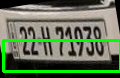

/content/rotated_images/419241033_2209276712612167_308946357964497821_n_jpg.rf.d8c0ae777f53338fc56caa1c81550fb6.jpg
52 14 18 13
box area 1387
image area 3240


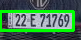

/content/images_cropped/419241033_2209276712612167_308946357964497821_n_jpg.rf.d8c0ae777f53338fc56caa1c81550fb6.jpg


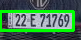

/content/rotated_images/69-3-_jpg.rf.2bd0216bca0355f5de78929ab9e42ced.jpg
28 22 23 36
box area 6864
image area 11850


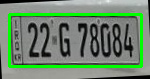

/content/images_cropped/69-3-_jpg.rf.2bd0216bca0355f5de78929ab9e42ced.jpg


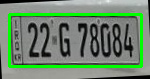

/content/rotated_images/57_jpg.rf.4d70900ecf4c5af1e6db08e7fc1fc0152.jpg
0 10 231 78
box area 18018
image area 22176


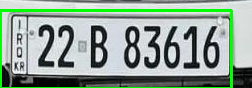

/content/images_cropped/57_jpg.rf.4d70900ecf4c5af1e6db08e7fc1fc0152.jpg


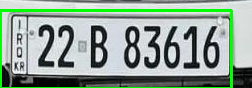

/content/rotated_images/59_jpg.rf.5a62af5074f6f4d20136f24a27ed931a.jpg
145 18 12 34
box area 7296
image area 12567


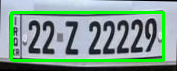

/content/images_cropped/59_jpg.rf.5a62af5074f6f4d20136f24a27ed931a.jpg


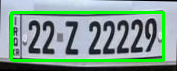

/content/rotated_images/66_jpg.rf.47032f2c1c7d2a1bb2cbd7b9176df200.jpg
8 14 120 45
box area 5400
image area 9990


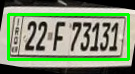

/content/images_cropped/66_jpg.rf.47032f2c1c7d2a1bb2cbd7b9176df200.jpg


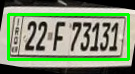

/content/rotated_images/70-3-_jpg.rf.2a17adf768ca0f94b5838147ddcf6a7a.jpg
31 13 49 16
box area 784
image area 3440


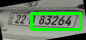

/content/images_cropped/70-3-_jpg.rf.2a17adf768ca0f94b5838147ddcf6a7a.jpg


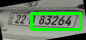

/content/rotated_images/70-13-_jpg.rf.155d171cdc72c0ac0e035e1b926569a9.jpg
0 8 57 35
box area 1995
image area 2623


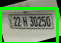

/content/images_cropped/70-13-_jpg.rf.155d171cdc72c0ac0e035e1b926569a9.jpg


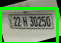

In [84]:
import os

paths=os.listdir('/content/rotated_images')
for path in paths:
  path= "/content/rotated_images/"+path
  print(path)
  visualize_canny_edges(path)
  edge_image_path = '/content/canny_edges.png'  # Replace with the path to your edge-detected image
  image_path = path  # Replace with the path to your original image
  edge_image = cv2.imread(edge_image_path, cv2.IMREAD_GRAYSCALE)
  visualize_license_plate_boxes(image_path, edge_image)


/content/rotated_images/189_jpg.rf.b9d5b30ec71075a507f23d6622a1f7eb.jpg
13 11 188 47
box area 8836
image area 14892


`np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
`np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)


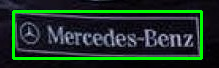

/content/images_cropped/189_jpg.rf.b9d5b30ec71075a507f23d6622a1f7eb.jpg


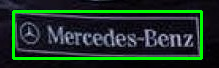

/content/rotated_images/70-1-_jpg.rf.d441ae9ef94c029ffcbfe74b95b8f4de.jpg
11 10 45 9
box area 1188
image area 3069


/content/images_cropped/70-1-_jpg.rf.d441ae9ef94c029ffcbfe74b95b8f4de.jpg


/content/rotated_images/419173054_777935504164308_496264249723982035_n_jpg.rf.7fe782987e9a6766473a034b8eb1b156.jpg
3 10 125 18
box area 2250
image area 4860


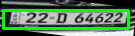

/content/images_cropped/419173054_777935504164308_496264249723982035_n_jpg.rf.7fe782987e9a6766473a034b8eb1b156.jpg


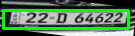

/content/rotated_images/firstframe.jpg
22 13 18 8
we are adjusting
Not x-centered
Not y-centered
we are adjusting
Not x-centered
Not y-centered
box area 702
image area 1568


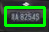

/content/images_cropped/firstframe.jpg


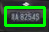

/content/rotated_images/5_jpg.rf.08e989a458736c430ac8684895d3050f.jpg
5 22 90 21
box area 1890
image area 6305


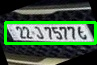

/content/images_cropped/5_jpg.rf.08e989a458736c430ac8684895d3050f.jpg


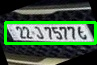

/content/rotated_images/58_jpg.rf.0f7e465b5f8d3acd39e43dcadb31b7f0.jpg
13 15 196 60
box area 11760
image area 20930


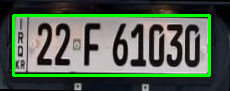

/content/images_cropped/58_jpg.rf.0f7e465b5f8d3acd39e43dcadb31b7f0.jpg


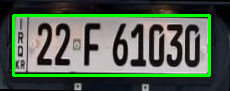

/content/rotated_images/14_jpg.rf.aaa3db98a8f0e3c867c91b2ec427bc8c.jpg
7 21 160 50
box area 8000
image area 17363


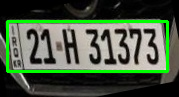

/content/images_cropped/14_jpg.rf.aaa3db98a8f0e3c867c91b2ec427bc8c.jpg


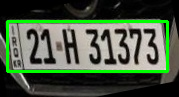

/content/rotated_images/70-13-_jpg.rf.fa2aea14b2828cc01a9b67c6c3cea43a.jpg
22 27 17 21
box area 3332
image area 8968


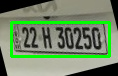

/content/images_cropped/70-13-_jpg.rf.fa2aea14b2828cc01a9b67c6c3cea43a.jpg


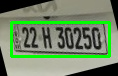

/content/rotated_images/428479596_2083530045364234_3401595779526985803_n_jpg.rf.e04cce7bf1401b66fa7418d2f531d39b.jpg
0 19 103 45
box area 4635
image area 9844


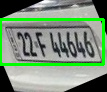

/content/images_cropped/428479596_2083530045364234_3401595779526985803_n_jpg.rf.e04cce7bf1401b66fa7418d2f531d39b.jpg


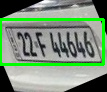

/content/rotated_images/417364312_1068529891141645_6625828181421494034_n_jpg.rf.f3d71e0a025ad3d1237b0a7c137fb060.jpg
24 12 32 11
box area 897
image area 2484


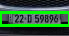

/content/images_cropped/417364312_1068529891141645_6625828181421494034_n_jpg.rf.f3d71e0a025ad3d1237b0a7c137fb060.jpg


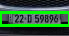

/content/rotated_images/52_jpg.rf.b397e1748e6adf4dadcfdb061d72aaf2.jpg
0 0 64 32
close to edge adjusting
we are adjusting
Not y-centered
box area 2960
image area 3920


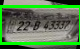

/content/images_cropped/52_jpg.rf.b397e1748e6adf4dadcfdb061d72aaf2.jpg


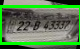

/content/rotated_images/427667093_1133225274664600_1272288515667003555_n_jpg.rf.fe8ee31a87b81f2b3c76095f0dfec927.jpg
0 13 93 39
box area 3627
image area 6603


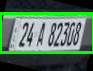

/content/images_cropped/427667093_1133225274664600_1272288515667003555_n_jpg.rf.fe8ee31a87b81f2b3c76095f0dfec927.jpg


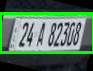

/content/rotated_images/427649041_308812638842663_5019511625679107493_n_jpg.rf.9998e3a09980c149e92cd23bf3219022.jpg
134 15 29 18
box area 4420
image area 9400


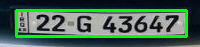

/content/images_cropped/427649041_308812638842663_5019511625679107493_n_jpg.rf.9998e3a09980c149e92cd23bf3219022.jpg


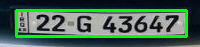

/content/rotated_images/419420193_2608644655967002_1421768417040176403_n_jpg.rf.e39b11b7b14e404ebe939432f104b554.jpg
18 16 13 13
box area 1292
image area 3813


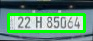

/content/images_cropped/419420193_2608644655967002_1421768417040176403_n_jpg.rf.e39b11b7b14e404ebe939432f104b554.jpg


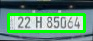

/content/rotated_images/27_png.rf.b0b8716a131c0677226f471ab3678c72.jpg
16 19 12 18
box area 2310
image area 4312


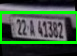

/content/images_cropped/27_png.rf.b0b8716a131c0677226f471ab3678c72.jpg


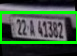

/content/rotated_images/15_png.rf.0976cfbb500a2152e1a3fc0c1a4e5857.jpg
20 22 13 19
box area 2117
image area 6080


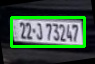

/content/images_cropped/15_png.rf.0976cfbb500a2152e1a3fc0c1a4e5857.jpg


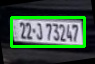

/content/rotated_images/57_jpg.rf.4d70900ecf4c5af1e6db08e7fc1fc015.jpg
16 18 47 16
we are adjusting
Not x-centered
we are adjusting
Not x-centered
box area 912
image area 3479


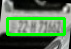

/content/images_cropped/57_jpg.rf.4d70900ecf4c5af1e6db08e7fc1fc015.jpg


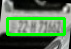

/content/rotated_images/14_jpg.rf.f1c081d395119dc3a3b80a247afbffc1.jpg
0 13 86 26
box area 2236
image area 3870


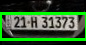

/content/images_cropped/14_jpg.rf.f1c081d395119dc3a3b80a247afbffc1.jpg


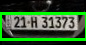

/content/rotated_images/1_jpg.rf.e0d71bfac749526f7f57a7274f7f8f1e.jpg
10 15 120 37
box area 4440
image area 8460


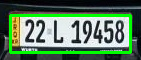

/content/images_cropped/1_jpg.rf.e0d71bfac749526f7f57a7274f7f8f1e.jpg


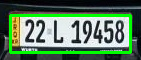

/content/rotated_images/13_jpg.rf.1665f839ba5e9b114f2e32a62ddd2005.jpg
83 26 21 30
box area 3627
image area 9360


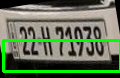

/content/images_cropped/13_jpg.rf.1665f839ba5e9b114f2e32a62ddd2005.jpg


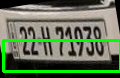

/content/rotated_images/419241033_2209276712612167_308946357964497821_n_jpg.rf.d8c0ae777f53338fc56caa1c81550fb6.jpg
52 14 18 13
box area 1387
image area 3240


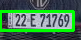

/content/images_cropped/419241033_2209276712612167_308946357964497821_n_jpg.rf.d8c0ae777f53338fc56caa1c81550fb6.jpg


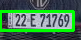

/content/rotated_images/69-3-_jpg.rf.2bd0216bca0355f5de78929ab9e42ced.jpg
28 22 23 36
box area 6864
image area 11850


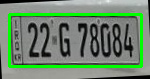

/content/images_cropped/69-3-_jpg.rf.2bd0216bca0355f5de78929ab9e42ced.jpg


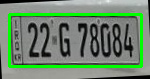

/content/rotated_images/57_jpg.rf.4d70900ecf4c5af1e6db08e7fc1fc0152.jpg
0 10 231 78
close to edge adjusting
we are adjusting
box area 18018
image area 22176


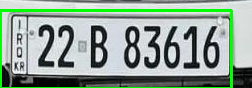

/content/images_cropped/57_jpg.rf.4d70900ecf4c5af1e6db08e7fc1fc0152.jpg


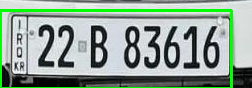

/content/rotated_images/59_jpg.rf.5a62af5074f6f4d20136f24a27ed931a.jpg
145 18 12 34
box area 7296
image area 12567


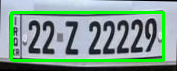

/content/images_cropped/59_jpg.rf.5a62af5074f6f4d20136f24a27ed931a.jpg


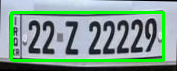

/content/rotated_images/66_jpg.rf.47032f2c1c7d2a1bb2cbd7b9176df200.jpg
8 14 120 45
box area 5400
image area 9990


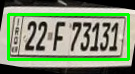

/content/images_cropped/66_jpg.rf.47032f2c1c7d2a1bb2cbd7b9176df200.jpg


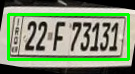

/content/rotated_images/70-3-_jpg.rf.2a17adf768ca0f94b5838147ddcf6a7a.jpg
31 13 49 16
we are adjusting
Not x-centered
we are adjusting
Not x-centered
box area 1104
image area 3440


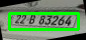

/content/images_cropped/70-3-_jpg.rf.2a17adf768ca0f94b5838147ddcf6a7a.jpg


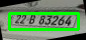

/content/rotated_images/70-13-_jpg.rf.155d171cdc72c0ac0e035e1b926569a9.jpg
0 8 57 35
close to edge adjusting
we are adjusting
box area 1995
image area 2623


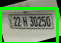

/content/images_cropped/70-13-_jpg.rf.155d171cdc72c0ac0e035e1b926569a9.jpg


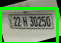

In [103]:
import os

paths=os.listdir('/content/rotated_images')
for path in paths:
  path= "/content/rotated_images/"+path
  print(path)
  visualize_canny_edges(path)
  edge_image_path = '/content/canny_edges.png'  # Replace with the path to your edge-detected image
  image_path = path  # Replace with the path to your original image
  edge_image = cv2.imread(edge_image_path, cv2.IMREAD_GRAYSCALE)
  visualize_license_plate_boxes(image_path, edge_image)


/content/rotated_images/189_jpg.rf.b9d5b30ec71075a507f23d6622a1f7eb.jpg
13 11 188 47
13 11 188 47
68 219
109 34
107 34
box area 8836
image area 14892


`np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
`np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)


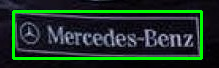

/content/images_cropped/189_jpg.rf.b9d5b30ec71075a507f23d6622a1f7eb.jpg


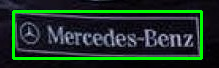

/content/rotated_images/70-1-_jpg.rf.d441ae9ef94c029ffcbfe74b95b8f4de.jpg
11 10 45 9
0 10 99 12
31 99
49 15
49 16
box area 1188
image area 3069


/content/images_cropped/70-1-_jpg.rf.d441ae9ef94c029ffcbfe74b95b8f4de.jpg


/content/rotated_images/419173054_777935504164308_496264249723982035_n_jpg.rf.7fe782987e9a6766473a034b8eb1b156.jpg
3 10 125 18
3 10 125 18
36 135
67 18
65 19
box area 2250
image area 4860


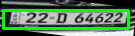

/content/images_cropped/419173054_777935504164308_496264249723982035_n_jpg.rf.7fe782987e9a6766473a034b8eb1b156.jpg


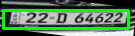

/content/rotated_images/firstframe.jpg
22 13 18 8
22 13 18 8
we are adjusting
Not x-centered
Not y-centered
we are adjusting
Not x-centered
Not y-centered
32 49
24 16
24 16
box area 702
image area 1568


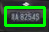

/content/images_cropped/firstframe.jpg


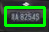

/content/rotated_images/5_jpg.rf.08e989a458736c430ac8684895d3050f.jpg
5 22 90 21
0 42 69 23
65 97
48 32
50 32
box area 1890
image area 6305


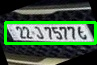

/content/images_cropped/5_jpg.rf.08e989a458736c430ac8684895d3050f.jpg


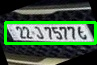

/content/rotated_images/58_jpg.rf.0f7e465b5f8d3acd39e43dcadb31b7f0.jpg
13 15 196 60
13 15 196 60
91 230
115 45
111 45
box area 11760
image area 20930


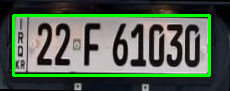

/content/images_cropped/58_jpg.rf.0f7e465b5f8d3acd39e43dcadb31b7f0.jpg


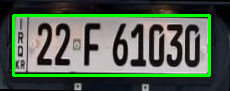

/content/rotated_images/14_jpg.rf.aaa3db98a8f0e3c867c91b2ec427bc8c.jpg
7 21 160 50
0 57 157 40
97 179
89 48
87 46
box area 8000
image area 17363


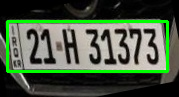

/content/images_cropped/14_jpg.rf.aaa3db98a8f0e3c867c91b2ec427bc8c.jpg


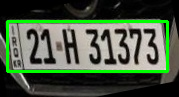

/content/rotated_images/70-13-_jpg.rf.fa2aea14b2828cc01a9b67c6c3cea43a.jpg
22 27 17 21
11 22 98 34
76 118
59 38
60 39
box area 3332
image area 8968


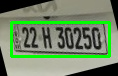

/content/images_cropped/70-13-_jpg.rf.fa2aea14b2828cc01a9b67c6c3cea43a.jpg


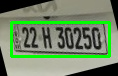

/content/rotated_images/428479596_2083530045364234_3401595779526985803_n_jpg.rf.e04cce7bf1401b66fa7418d2f531d39b.jpg
0 19 103 45
0 19 103 45
92 107
53 46
51 41
box area 4635
image area 9844


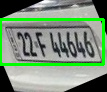

/content/images_cropped/428479596_2083530045364234_3401595779526985803_n_jpg.rf.e04cce7bf1401b66fa7418d2f531d39b.jpg


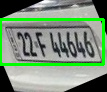

/content/rotated_images/417364312_1068529891141645_6625828181421494034_n_jpg.rf.f3d71e0a025ad3d1237b0a7c137fb060.jpg
24 12 32 11
0 12 69 13
36 69
34 18
34 18
box area 897
image area 2484


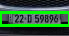

/content/images_cropped/417364312_1068529891141645_6625828181421494034_n_jpg.rf.f3d71e0a025ad3d1237b0a7c137fb060.jpg


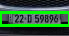

/content/rotated_images/52_jpg.rf.b397e1748e6adf4dadcfdb061d72aaf2.jpg
0 0 64 32
0 12 80 37
49 80
40 24
40 30
Not y-centered adjusting
we are adjusting
Not y-centered
box area 2960
image area 3920


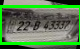

/content/images_cropped/52_jpg.rf.b397e1748e6adf4dadcfdb061d72aaf2.jpg


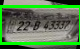

/content/rotated_images/427667093_1133225274664600_1272288515667003555_n_jpg.rf.fe8ee31a87b81f2b3c76095f0dfec927.jpg
0 13 93 39
0 13 93 39
71 93
46 35
46 32
box area 3627
image area 6603


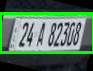

/content/images_cropped/427667093_1133225274664600_1272288515667003555_n_jpg.rf.fe8ee31a87b81f2b3c76095f0dfec927.jpg


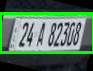

/content/rotated_images/427649041_308812638842663_5019511625679107493_n_jpg.rf.9998e3a09980c149e92cd23bf3219022.jpg
134 15 29 18
16 10 170 26
47 200
100 23
101 23
box area 4420
image area 9400


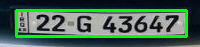

/content/images_cropped/427649041_308812638842663_5019511625679107493_n_jpg.rf.9998e3a09980c149e92cd23bf3219022.jpg


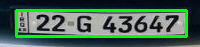

/content/rotated_images/419420193_2608644655967002_1421768417040176403_n_jpg.rf.e39b11b7b14e404ebe939432f104b554.jpg
18 16 13 13
8 14 76 17
41 93
46 20
46 22
box area 1292
image area 3813


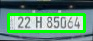

/content/images_cropped/419420193_2608644655967002_1421768417040176403_n_jpg.rf.e39b11b7b14e404ebe939432f104b554.jpg


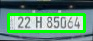

/content/rotated_images/27_png.rf.b0b8716a131c0677226f471ab3678c72.jpg
16 19 12 18
0 12 77 30
56 77
38 28
38 27
box area 2310
image area 4312


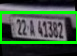

/content/images_cropped/27_png.rf.b0b8716a131c0677226f471ab3678c72.jpg


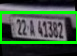

/content/rotated_images/15_png.rf.0976cfbb500a2152e1a3fc0c1a4e5857.jpg
20 22 13 19
11 17 73 29
64 95
47 32
47 31
box area 2117
image area 6080


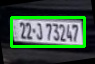

/content/images_cropped/15_png.rf.0976cfbb500a2152e1a3fc0c1a4e5857.jpg


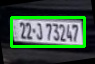

/content/rotated_images/57_jpg.rf.4d70900ecf4c5af1e6db08e7fc1fc015.jpg
16 18 47 16
16 18 47 16
we are adjusting
Not x-centered
we are adjusting
Not x-centered
49 71
35 24
35 26
box area 912
image area 3479


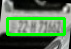

/content/images_cropped/57_jpg.rf.4d70900ecf4c5af1e6db08e7fc1fc015.jpg


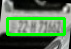

/content/rotated_images/14_jpg.rf.f1c081d395119dc3a3b80a247afbffc1.jpg
0 13 86 26
0 13 86 26
45 86
43 22
43 26
box area 2236
image area 3870


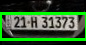

/content/images_cropped/14_jpg.rf.f1c081d395119dc3a3b80a247afbffc1.jpg


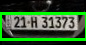

/content/rotated_images/1_jpg.rf.e0d71bfac749526f7f57a7274f7f8f1e.jpg
10 15 120 37
10 15 120 37
60 141
70 30
70 33
box area 4440
image area 8460


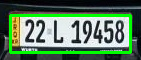

/content/images_cropped/1_jpg.rf.e0d71bfac749526f7f57a7274f7f8f1e.jpg


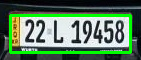

/content/rotated_images/13_jpg.rf.1665f839ba5e9b114f2e32a62ddd2005.jpg
83 26 21 30
3 40 117 31
78 120
60 39
61 55
Not y-centered adjusting
we are adjusting
Not y-centered
box area 3627
image area 9360


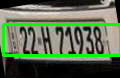

/content/images_cropped/13_jpg.rf.1665f839ba5e9b114f2e32a62ddd2005.jpg


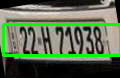

/content/rotated_images/419241033_2209276712612167_308946357964497821_n_jpg.rf.d8c0ae777f53338fc56caa1c81550fb6.jpg
52 14 18 13
0 11 73 19
40 81
40 20
36 20
box area 1387
image area 3240


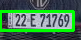

/content/images_cropped/419241033_2209276712612167_308946357964497821_n_jpg.rf.d8c0ae777f53338fc56caa1c81550fb6.jpg


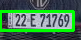

/content/rotated_images/69-3-_jpg.rf.2bd0216bca0355f5de78929ab9e42ced.jpg
28 22 23 36
9 14 132 52
79 150
75 39
75 40
box area 6864
image area 11850


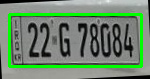

/content/images_cropped/69-3-_jpg.rf.2bd0216bca0355f5de78929ab9e42ced.jpg


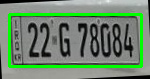

/content/rotated_images/57_jpg.rf.4d70900ecf4c5af1e6db08e7fc1fc0152.jpg
0 10 231 78
0 10 231 78
88 252
126 44
115 49
box area 18018
image area 22176


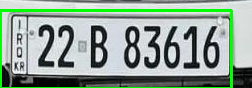

/content/images_cropped/57_jpg.rf.4d70900ecf4c5af1e6db08e7fc1fc0152.jpg


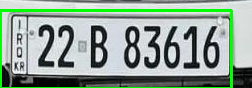

/content/rotated_images/59_jpg.rf.5a62af5074f6f4d20136f24a27ed931a.jpg
145 18 12 34
11 12 152 48
71 177
88 35
87 36
box area 7296
image area 12567


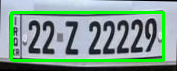

/content/images_cropped/59_jpg.rf.5a62af5074f6f4d20136f24a27ed931a.jpg


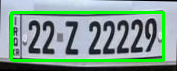

/content/rotated_images/66_jpg.rf.47032f2c1c7d2a1bb2cbd7b9176df200.jpg
8 14 120 45
8 14 120 45
74 135
67 37
68 36
box area 5400
image area 9990


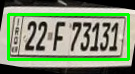

/content/images_cropped/66_jpg.rf.47032f2c1c7d2a1bb2cbd7b9176df200.jpg


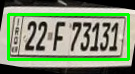

/content/rotated_images/70-3-_jpg.rf.2a17adf768ca0f94b5838147ddcf6a7a.jpg
31 13 49 16
31 13 49 16
we are adjusting
Not x-centered
we are adjusting
Not x-centered
40 86
43 20
43 21
box area 1104
image area 3440


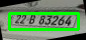

/content/images_cropped/70-3-_jpg.rf.2a17adf768ca0f94b5838147ddcf6a7a.jpg


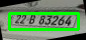

/content/rotated_images/70-13-_jpg.rf.155d171cdc72c0ac0e035e1b926569a9.jpg
0 8 57 35
0 8 57 35
43 61
30 21
28 25
box area 1995
image area 2623


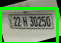

/content/images_cropped/70-13-_jpg.rf.155d171cdc72c0ac0e035e1b926569a9.jpg


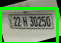

In [117]:
import os

paths=os.listdir('/content/rotated_images')
for path in paths:
  path= "/content/rotated_images/"+path
  print(path)
  visualize_canny_edges(path)
  edge_image_path = '/content/canny_edges.png'  # Replace with the path to your edge-detected image
  image_path = path  # Replace with the path to your original image
  edge_image = cv2.imread(edge_image_path, cv2.IMREAD_GRAYSCALE)
  visualize_license_plate_boxes(image_path, edge_image)


# Tesseract

In [ ]:
! apt install tesseract-ocr
! apt install libtesseract-dev

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 45 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 1s (4,982 kB/s)
Selecting previously unselected package tesseract-ocr-eng.
(Reading database ... 121925 files and directories currently installed.)
Preparing to unpack .../tesseract-ocr-

In [ ]:
! pip install Pillow
! pip install pytesseract

In [ ]:
# Load languages and scripts
!git clone --recurse-submodules https://github.com/tesseract-ocr/tessdata_fast.git 2> /dev/null || (cd tessdata_fast; git pull)
!cp tessdata_fast/*.traineddata /usr/share/tesseract-ocr/4.00/tessdata/
!cp -r tessdata_fast/script /usr/share/tesseract-ocr/4.00/tessdata/

Submodule path 'tessconfigs': checked out '3decf1c8252ba6dbeef0bf908f4b0aab7f18d113'


In [ ]:
# import the necessary packages
from pytesseract import Output
import pytesseract
import argparse
import imutils
import cv2
from PIL import Image
# load the input image, convert it from BGR to RGB channel ordering,
# and use Tesseract to determine the text orientation
pytesseract.pytesseract.tesseract_cmd = (
    r'/usr/bin/tesseract'
)
image = cv2.imread("/content/Images/018_jpg.rf.c9d875cc92b9d4f9212f9955b988e299.jpg")
rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
results = pytesseract.image_to_osd(image, output_type='dict')
print(results)


TesseractError: (1, 'Tesseract Open Source OCR Engine v4.1.1 with Leptonica Warning: Invalid resolution 0 dpi. Using 70 instead. Warning. Invalid resolution 0 dpi. Using 70 instead. Too few characters. Skipping this page Error during processing.')

# Deskew

In [ ]:
pip install deskew

In [ ]:
import numpy as np
from skimage import io
from skimage.color import rgb2gray
from skimage.transform import rotate

from deskew import determine_skew

image = io.imread('/content/pic1.jpg')
grayscale = rgb2gray(image)
angle = determine_skew(grayscale)
rotated = rotate(image, angle, resize=True) * 255
io.imsave('output.png', rotated.astype(np.uint8))

array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)
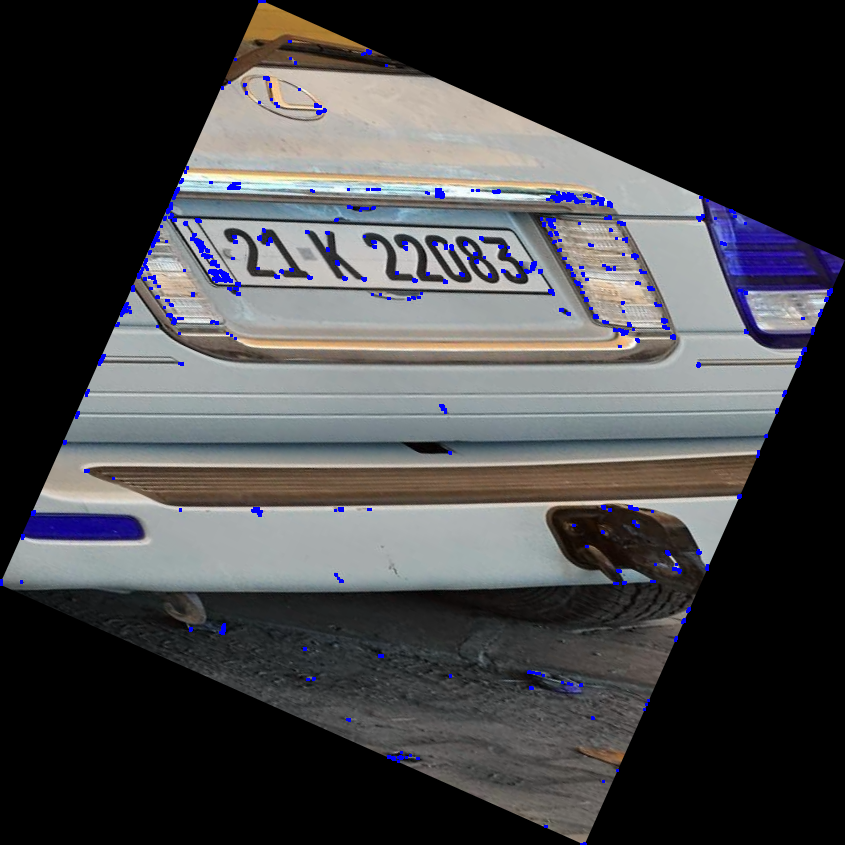

In [ ]:
import numpy as np
import cv2 as cv

filename = 'output.png'
img = cv.imread(filename)
gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)

gray = np.float32(gray)
dst = cv.cornerHarris(gray,2,3,0.04)

#result is dilated for marking the corners, not important
dst = cv.dilate(dst,None)

# Threshold for an optimal value, it may vary depending on the image.
img[dst>0.01*dst.max()]=[0,0,255]

img


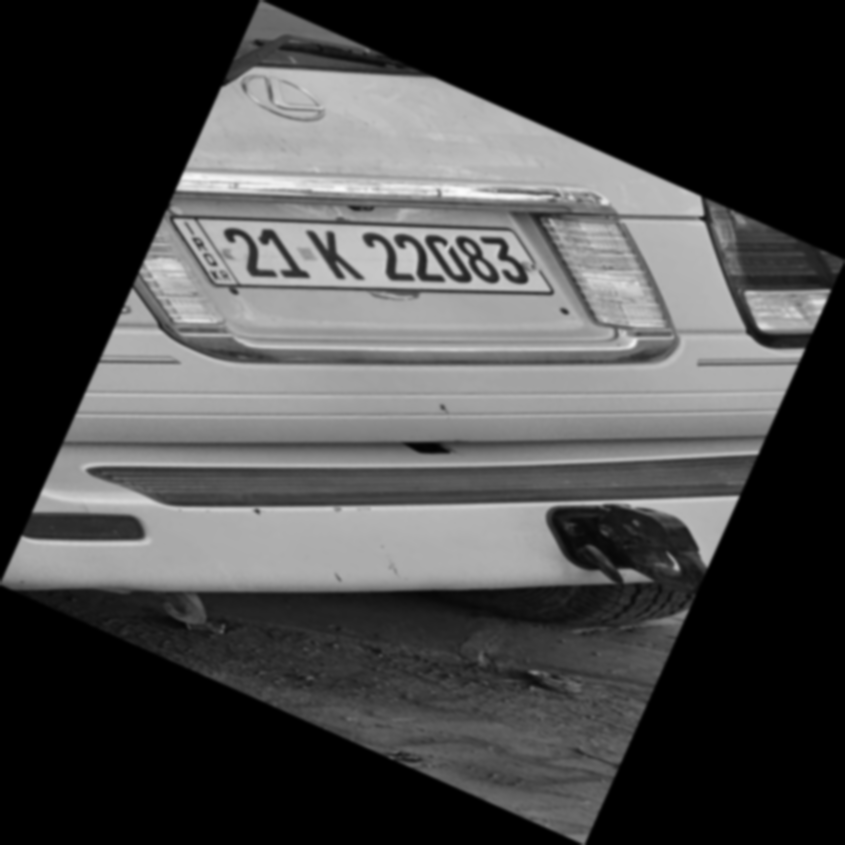

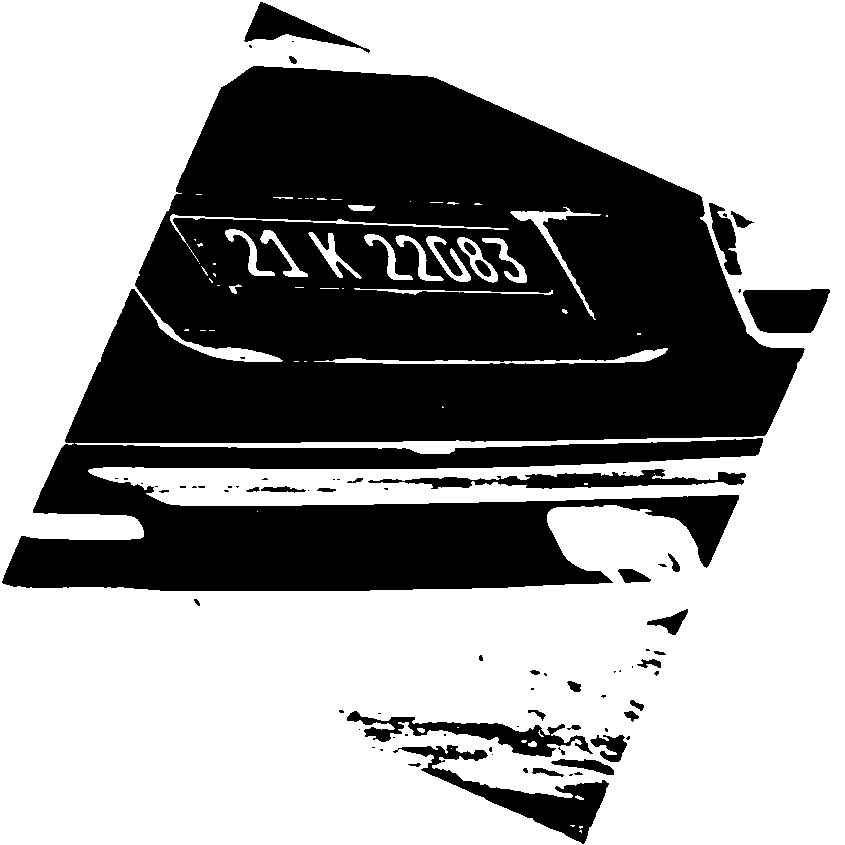

46


NameError: name 'totalLabels' is not defined

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Loading the image
img = cv2.imread('./output.png')

# preprocess the image
gray_img = cv2.cvtColor(img ,
						cv2.COLOR_BGR2GRAY)

# Applying 7x7 Gaussian Blur
blurred = cv2.GaussianBlur(gray_img, (7, 7), 0)
cv2_imshow(blurred)
# Applying threshold
threshold = cv2.threshold(blurred, 0, 255,
	cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
cv2_imshow(threshold)
# Apply the Component analysis function
output = cv2.connectedComponentsWithStats(
	img_dilation, 100, cv2.CV_32S)
(numLabels, labels, stats, centroids) = output
print(numLabels)

# Initialize a new image to
# store all the output components
output = np.zeros(gray_img.shape, dtype="uint8")

# Loop through each component
for i in range(1, totalLabels):

	# Area of the component
	area = values[i, cv2.CC_STAT_AREA]

	if (area > 140) and (area < 400):
		# Create a new image for bounding boxes
		new_img=img.copy()

		# Now extract the coordinate points
		x1 = values[i, cv2.CC_STAT_LEFT]
		y1 = values[i, cv2.CC_STAT_TOP]
		w = values[i, cv2.CC_STAT_WIDTH]
		h = values[i, cv2.CC_STAT_HEIGHT]

		# Coordinate of the bounding box
		pt1 = (x1, y1)
		pt2 = (x1+ w, y1+ h)
		(X, Y) = centroid[i]

		# Bounding boxes for each component
		cv2.rectangle(new_img,pt1,pt2,
					(0, 255, 0), 3)
		cv2.circle(new_img, (int(X),
							int(Y)),
				4, (0, 0, 255), -1)

		# Create a new array to show individual component
		component = np.zeros(gray_img.shape, dtype="uint8")
		componentMask = (label_ids == i).astype("uint8") * 255

		# Apply the mask using the bitwise operator
		component = cv2.bitwise_or(component,componentMask)
		output = cv2.bitwise_or(output, componentMask)

		# Show the final images
		cv2_imshow( new_img)
		cv2_imshow( component)
		cv2_imshow( output)
		cv2.waitKey(0)


# edges

In [ ]:
# # prompt: give the function to visulizer the dtecetc corners visualize_corners(image_path, corners)

# def visualize_corners(image, corners):
#     # Load the image


#     # Draw the corners on the image
#     for corner in corners:
#         cv2.circle(image, tuple(corner), 5, (0, 255, 0), -1)

#     # Show the image with corners
#     plt.imshow(image)
#     plt.title("Detected License Plate Corners")
#     plt.show()
# visualize_corners(rotate, corners)

In [ ]:
# import cv2
# import numpy as np
# import matplotlib.pyplot as plt
# def detect_license_plate_corners(image):
#     # Load the image

#     gray = image
#     # Edge detection
#     edges = cv2.Canny(gray, 50, 200)

#     # Find contours
#     contours, _ = cv2.findContours(edges, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

#     # Filter contours to find potential license plates
#     license_plate_contour = None
#     for contour in contours:
#         epsilon = 0.05 * cv2.arcLength(contour, True)
#         approx = cv2.approxPolyDP(contour, epsilon, True)
#         if len(approx) == 4:  # Check for quadrilateral
#             license_plate_contour = approx
#             break

#     if license_plate_contour is None:
#         raise ValueError("No license plate contour detected.")

#     # Extract corner points
#     corners = license_plate_contour.reshape(4, 2)

#     return corners

# # Example usage
# image_path = '/content/Images/70-1-_jpg.rf.d441ae9ef94c029ffcbfe74b95b8f4de.jpg'
# image = cv2.imread(image_path)

# corners = detect_license_plate_corners(image)

# print("Detected corners:", corners)
# visualize_corners(rotate, corners)

In [ ]:
import cv2

edge_image = cv2.imread("canny_edges.png", cv2.IMREAD_GRAYSCALE)
visualize_license_plate_boxes("saved.jpg", edge_image)

./cropped_image.jpg


C:\Users\User\AppData\Local\Temp\ipykernel_13036\872596686.py:38: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  box_perimeter = np.int0(box_perimeter)
C:\Users\User\AppData\Local\Temp\ipykernel_13036\872596686.py:47: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  box_area = np.int0(box_area)


In [ ]:
!pip install paddleocr

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 780.0/780.0 kB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 908.3/908.3 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 299.2/299.2 kB 12.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 20.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 35.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.9/60.9 MB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.1/67.1 MB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 59.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 244.3/244.3 kB 24.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.4/88.4 kB 11.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.0/132.0 kB 16.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.5/3.5 MB 49.9 MB/s e

In [ ]:
!pip install paddlepaddle

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 125.9/125.9 MB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 11.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 12.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 9.1 MB/s eta 0:00:00


In [ ]:
from paddleocr import PaddleOCR,draw_ocr
# Paddleocr supports Chinese, English, French, German, Korean and Japanese.
# You can set the parameter `lang` as `ch`, `en`, `fr`, `german`, `korean`, `japan`
# to switch the language model in order.
ocr = PaddleOCR(use_angle_cls=True, lang='en') # need to run only once to download and load model into memory
img_path = '/content/5_jpg.rf.08e989a458736c430ac8684895d3050f.jpg'
result = ocr.ocr(img_path, cls=True)
for idx in range(len(result)):
    res = result[idx]
    for line in res:
        print(line)


# draw result
from PIL import Image
result = result[0]
image = Image.open(img_path).convert('RGB')
boxes = [line[0] for line in result]
txts = [line[1][0] for line in result]
scores = [line[1][1] for line in result]
im_show = draw_ocr(image, boxes, txts, scores, font_path='./fonts/simfang.ttf')
im_show = Image.fromarray(im_show)
im_show.save('result.jpg')

download https://paddleocr.bj.bcebos.com/PP-OCRv3/english/en_PP-OCRv3_det_infer.tar to /root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer/en_PP-OCRv3_det_infer.tar


100%|██████████| 4.00M/4.00M [00:14<00:00, 285kiB/s] 


download https://paddleocr.bj.bcebos.com/PP-OCRv4/english/en_PP-OCRv4_rec_infer.tar to /root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer/en_PP-OCRv4_rec_infer.tar


100%|██████████| 10.2M/10.2M [00:15<00:00, 658kiB/s] 


download https://paddleocr.bj.bcebos.com/dygraph_v2.0/ch/ch_ppocr_mobile_v2.0_cls_infer.tar to /root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer/ch_ppocr_mobile_v2.0_cls_infer.tar


100%|██████████| 2.19M/2.19M [00:12<00:00, 176kiB/s]

[2024/06/26 20:08:40] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='/root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=6, max_text_length=25, rec_char_dict_path='

[2024/06/26 20:08:41] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.04838132858276367
[2024/06/26 20:08:41] ppocr DEBUG: cls num  : 1, elapsed : 0.029791831970214844
[2024/06/26 20:08:41] ppocr DEBUG: rec_res num  : 1, elapsed : 0.10642600059509277
[[[4.0, 3.0], [86.0, 3.0], [86.0, 20.0], [4.0, 20.0]], ('22375776', 0.8874877691268921)]


OSError: cannot open resource

In [ ]:
# prompt: download a file named x froim colab runtile to my local machine zip the folder before

from google.colab import files

# Get the file from the user

# Download the file

# Zip the folder
!zip -r folder.zip /content/images_cropped

# Download the zip file
files.download("folder.zip")


  adding: content/images_cropped/ (stored 0%)
  adding: content/images_cropped/70-1-_jpg.rf.d441ae9ef94c029ffcbfe74b95b8f4de.jpg (deflated 9%)
  adding: content/images_cropped/69-3-_jpg.rf.2bd0216bca0355f5de78929ab9e42ced.jpg (deflated 4%)
  adding: content/images_cropped/417364312_1068529891141645_6625828181421494034_n_jpg.rf.f3d71e0a025ad3d1237b0a7c137fb060.jpg (deflated 10%)
  adding: content/images_cropped/13_jpg.rf.1665f839ba5e9b114f2e32a62ddd2005.jpg (deflated 7%)
  adding: content/images_cropped/58_jpg.rf.0f7e465b5f8d3acd39e43dcadb31b7f0.jpg (deflated 4%)
  adding: content/images_cropped/66_jpg.rf.47032f2c1c7d2a1bb2cbd7b9176df200.jpg (deflated 5%)
  adding: content/images_cropped/428479596_2083530045364234_3401595779526985803_n_jpg.rf.e04cce7bf1401b66fa7418d2f531d39b.jpg (deflated 5%)
  adding: content/images_cropped/15_png.rf.0976cfbb500a2152e1a3fc0c1a4e5857.jpg (deflated 8%)
  adding: content/images_cropped/59_jpg.rf.5a62af5074f6f4d20136f24a27ed931a.jpg (deflated 5%)
  adding:

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Test on 1 photo

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
def find_license_plate_boxes_old(edge_image, image_path):
    # Find contours in the edge-detected image
    contours, _ = cv2.findContours(edge_image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    # Initialize variables to hold the largest contours by area and perimeter
    largest_contour_area = None
    largest_contour_perimeter = None
    largest_area = 0
    largest_perimeter = 0

    # Loop through all detected contours
    for contour in contours:
        image = cv2.imread(image_path)
        cv2.drawContours(image, contour, -1, (0, 255, 0), 2)

        # Display the original image with contours
        cv2_imshow(image)
        # Calculate the perimeter of the contour
        perimeter = cv2.arcLength(contour, True)
        # Approximate the contour
        approx = cv2.approxPolyDP(contour, 0.02 * perimeter, True)
        print(len(approx))
        # Consider contours that have between 4 and 5 corners (approximate to a rectangle)
        if 2 <= len(approx) <= 17:

            area = cv2.contourArea(contour)

            # Update if the current contour has the largest area
            print(area)
            print(perimeter)
            # Update if the current contour has the largest perimeter
            if perimeter > largest_perimeter:
                rect_perimeter = cv2.minAreaRect(contour)
                box_perimeter = cv2.boxPoints(rect_perimeter)
                box_perimeter = np.int0(box_perimeter)

                largest_contour_perimeter = contour
                largest_perimeter = perimeter

            # Update if the current contour has the largest area
            if area > largest_area:
                rect_area = cv2.minAreaRect(contour)
                box_area = cv2.boxPoints(rect_area)
                box_area = np.int0(box_area)

                largest_contour_area = contour
                largest_area = area

    # Check if any contours were found
    if largest_contour_area is not None and largest_contour_perimeter is not None:
        # Get bounding box coordinates for the largest area
        x_area, y_area, w_area, h_area = cv2.boundingRect(largest_contour_area)
        # Get bounding box coordinates for the largest perimeter
        x_perimeter, y_perimeter, w_perimeter, h_perimeter = cv2.boundingRect(largest_contour_perimeter)

        # Determine which box has the largest area between the two
        box_area1 = w_area * h_area
        box_area2 = w_perimeter * h_perimeter

        if box_area1 > box_area2:
            return (x_area, y_area, w_area, h_area), largest_contour_area
        else:
            return (x_perimeter, y_perimeter, w_perimeter, h_perimeter), largest_contour_perimeter
    else:
        raise ValueError("No suitable license plate contours detected.")

def visualize_license_plate_boxes(image_path, edge_image):
    # Load the original image

    image = cv2.imread(image_path)
    # Find the bounding boxes of the license plate
    bounding_box, contour = find_license_plate_boxes(edge_image,image_path)
    x, y, w, h = bounding_box

    # Draw the bounding box on the image
    cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)

    # Draw the contour

    cv2.drawContours(image, [contour], -1, (255, 0, 0), 2)
    # Display the result
    cv2_imshow(image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()


# Example usage
paths=os.listdir('/content/images_rotated')
for path in paths:
  path= "/content/images_rotated/13_jpg.rf.1665f839ba5e9b114f2e32a62ddd2005.jpg"
  print(path)
  visualize_canny_edges(path)
  edge_image_path = '/content/canny_edges.png'  # Replace with the path to your edge-detected image
  image_path = path  # Replace with the path to your original image
  edge_image = cv2.imread(edge_image_path, cv2.IMREAD_GRAYSCALE)
  visualize_license_plate_boxes(image_path, edge_image)
  break

70-1-_jpg.rf.d441ae9ef94c029ffcbfe74b95b8f4de.jpg


<ipython-input-14-222639a38467>:20: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  box = np.int0(box)
<ipython-input-14-222639a38467>:79: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  box = np.int0(cv2.transform(np.array([box]), rotation_matrix)[0])


69-3-_jpg.rf.2bd0216bca0355f5de78929ab9e42ced.jpg


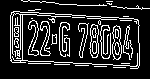

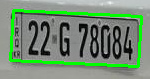

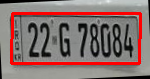

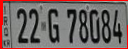

417364312_1068529891141645_6625828181421494034_n_jpg.rf.f3d71e0a025ad3d1237b0a7c137fb060.jpg


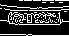

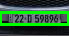

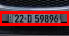

13_jpg.rf.1665f839ba5e9b114f2e32a62ddd2005.jpg


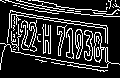

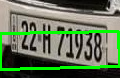

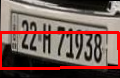

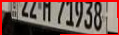

58_jpg.rf.0f7e465b5f8d3acd39e43dcadb31b7f0.jpg


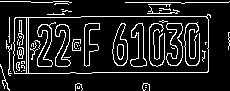

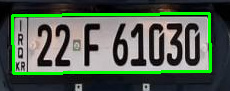

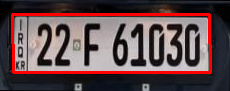

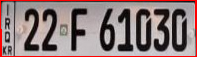

66_jpg.rf.47032f2c1c7d2a1bb2cbd7b9176df200.jpg


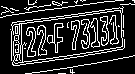

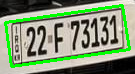

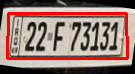

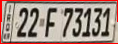

428479596_2083530045364234_3401595779526985803_n_jpg.rf.e04cce7bf1401b66fa7418d2f531d39b.jpg


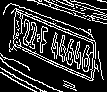

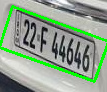

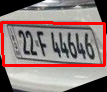

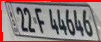

15_png.rf.0976cfbb500a2152e1a3fc0c1a4e5857.jpg


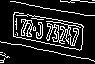

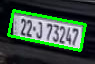

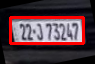

59_jpg.rf.5a62af5074f6f4d20136f24a27ed931a.jpg


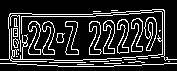

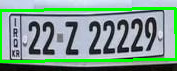

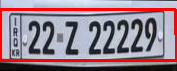

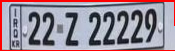

189_jpg.rf.b9d5b30ec71075a507f23d6622a1f7eb.jpg


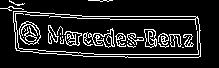

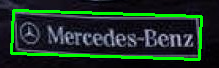

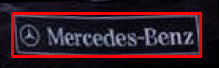

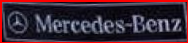

52_jpg.rf.b397e1748e6adf4dadcfdb061d72aaf2.jpg


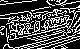

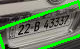

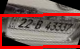

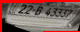

57_jpg.rf.4d70900ecf4c5af1e6db08e7fc1fc015.jpg


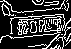

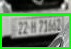

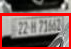

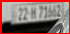

70-13-_jpg.rf.155d171cdc72c0ac0e035e1b926569a9.jpg


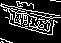

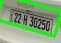

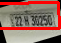

57_jpg.rf.4d70900ecf4c5af1e6db08e7fc1fc0152.jpg


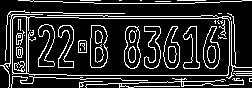

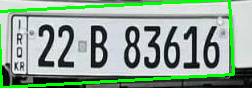

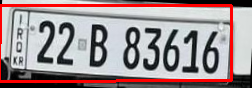

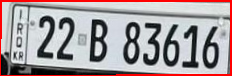

27_png.rf.b0b8716a131c0677226f471ab3678c72.jpg


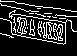

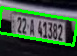

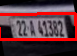

14_jpg.rf.f1c081d395119dc3a3b80a247afbffc1.jpg


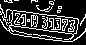

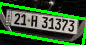

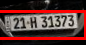

5_jpg.rf.08e989a458736c430ac8684895d3050f.jpg


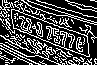

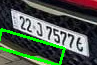

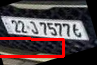

70-13-_jpg.rf.fa2aea14b2828cc01a9b67c6c3cea43a.jpg


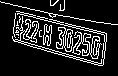

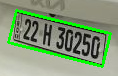

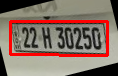

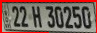

70-3-_jpg.rf.2a17adf768ca0f94b5838147ddcf6a7a.jpg


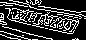

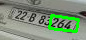

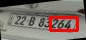

419420193_2608644655967002_1421768417040176403_n_jpg.rf.e39b11b7b14e404ebe939432f104b554.jpg


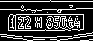

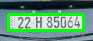

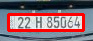

427649041_308812638842663_5019511625679107493_n_jpg.rf.9998e3a09980c149e92cd23bf3219022.jpg


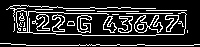

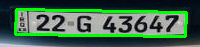

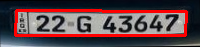

419173054_777935504164308_496264249723982035_n_jpg.rf.7fe782987e9a6766473a034b8eb1b156.jpg


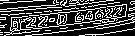

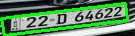

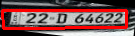

14_jpg.rf.aaa3db98a8f0e3c867c91b2ec427bc8c.jpg


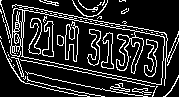

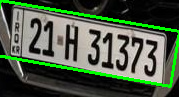

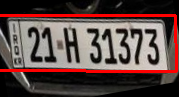

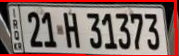

1_jpg.rf.e0d71bfac749526f7f57a7274f7f8f1e.jpg


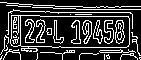

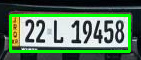

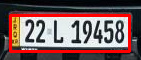

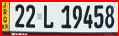

a-567-_JPG_jpg.rf.944dc3f4160c5d0eb41eaf414fe83c48.jpg


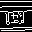

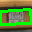

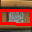

419241033_2209276712612167_308946357964497821_n_jpg.rf.d8c0ae777f53338fc56caa1c81550fb6.jpg


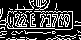

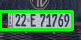

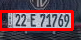

427667093_1133225274664600_1272288515667003555_n_jpg.rf.fe8ee31a87b81f2b3c76095f0dfec927.jpg


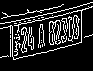

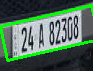

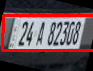

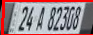

In [ ]:
import cv2
import numpy as np

def find_license_plate_min_area_rect(edge_image):
    # Find contours in the edge-detected image
    contours, _ = cv2.findContours(edge_image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    largest_area = 0
    largest_contour = None
    largest_perimeter=0

    # Loop through all detected contours
    for contour in contours:
        area = cv2.contourArea(contour)
        perimeter = cv2.arcLength(contour,True)
        if perimeter >largest_perimeter:

            rect = cv2.minAreaRect(contour)
            box = cv2.boxPoints(rect)
            box = np.int0(box)

            largest_contour = contour
            largest_area = area
            largest_perimeter=perimeter

    if largest_contour is not None:
        return box, rect

    else:
        raise ValueError("No suitable license plate contour detected.")

def rotate_and_crop(image, rect):
    width, height = int(rect[1][0]), int(rect[1][1])
    angle = rect[2]

    if width < height:
        width, height = height, width
        angle -= 90
    center = rect[0]

    # Compute the rotation matrix to align the rectangle horizontally
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)

    # Rotate the entire image
    rotated_image = cv2.warpAffine(image, rotation_matrix, (image.shape[1], image.shape[0]))

    # Calculate new bounding box coordinates in the rotated image
    x = int(center[0] - width / 2)
    y = int(center[1] - height / 2)

    # Clamp coordinates to be within image boundaries
    x = max(0, min(x, rotated_image.shape[1] - width))
    y = max(0, min(y, rotated_image.shape[0] - height))
    width = min(width, rotated_image.shape[1] - x)
    height = min(height, rotated_image.shape[0] - y)

    # Crop the aligned rectangle from the rotated image
    cropped_image = rotated_image[y:y + height, x:x + width]

    return cropped_image, rotated_image, rotation_matrix

def crop_and_save_license_plate(image_path, edge_image_path, save_path):
    image = cv2.imread(image_path)
    edge_image = cv2.imread(edge_image_path, cv2.IMREAD_GRAYSCALE)

    # Find the minimum area rectangle of the license plate
    box, rect = find_license_plate_min_area_rect(edge_image)

    # Rotate and crop the image based on the aligned rectangle
    cropped_image, rotated_image, rotation_matrix = rotate_and_crop(image, rect)

    # Save the cropped image
    cv2.imwrite(save_path, cropped_image)

    # Draw the bounding box on the original and rotated image for visualization
    cv2.drawContours(image, [box], 0, (0, 255, 0), 2)

    # Apply the same rotation to the original box points for visualization
    box = np.int0(cv2.transform(np.array([box]), rotation_matrix)[0])
    cv2.drawContours(rotated_image, [box], 0, (0, 0, 255), 2)

    # Display the result
    cv2_imshow( image)
    cv2_imshow(rotated_image)
    cv2_imshow( cropped_image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()
paths=os.listdir('/content/images')
for path in paths:
  print(path)
  path= '/content/images/'+path
  visualize_canny_edges(path)
  edge_image_path = '/content/canny_edges.png'  # Path to the edge-detected image
  original_image_path = path  # Path to the original image
  save_path = '/content/cropped.jpg'  # Path to save the cropped image

  # Crop and save the license plate with contour simplification
  crop_and_save_license_plate(original_image_path, edge_image_path, save_path)

# # Example usage
# edge_image_path = '/content/canny_edges.png'  # Path to the edge-detected image
# original_image_path = '/content/14_jpg.rf.aaa3db98a8f0e3c867c91b2ec427bc8c.jpg'  # Path to the original image
# save_path = '/content/cropped3.jpg'  # Path to save the cropped image

# # Load edge-detected image
# edge_image = cv2.imread(edge_image_path, cv2.IMREAD_GRAYSCALE)

# # Crop and save the license plate
# crop_and_save_license_plate(original_image_path, edge_image_path, save_path)

/content/images_resized/RESIZED_14_jpg.rf.f1c081d395119dc3a3b80a247afbffc1.jpg


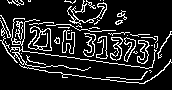

((95.33251190185547, 73.04196166992188), (23.126399993896484, 151.98292541503906), 88.10347747802734)


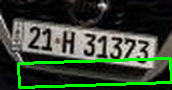

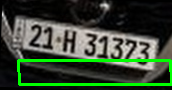

/content/images_resized/RESIZED_57_jpg.rf.4d70900ecf4c5af1e6db08e7fc1fc0152.jpg


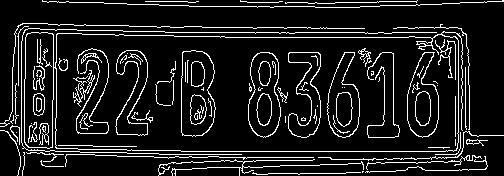

((256.5282287597656, 92.34869384765625), (403.21795654296875, 117.72178649902344), 0.15915453433990479)


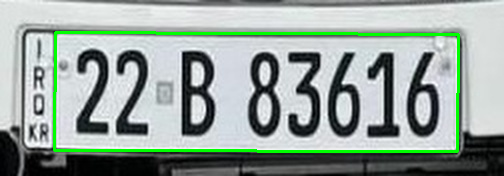

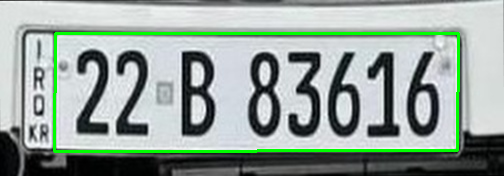

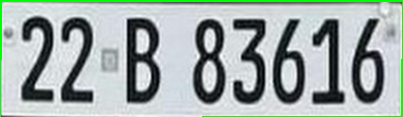

/content/images_resized/RESIZED_57_jpg.rf.4d70900ecf4c5af1e6db08e7fc1fc015.jpg


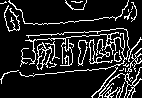

((131.8000030517578, 7.600000858306885), (0.6324555277824402, 3.1622774600982666), 18.43494987487793)


error: OpenCV(4.8.0) /io/opencv/modules/imgcodecs/src/loadsave.cpp:787: error: (-215:Assertion failed) !_img.empty() in function 'imwrite'


In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
def visualize_canny_edges(image_path, low_threshold=20, high_threshold=180):
    # Load the image
    print(image_path)
    image = cv2.imread(image_path)

    # Convert to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Apply Canny edge detector
    edges = cv2.Canny(gray_image, low_threshold, high_threshold)

    # Display the original and edge-detected images side by side
    combined_image = np.hstack((gray_image, edges))

    # Add text labels to differentiate between original and edge-detected images
    cv2.putText(combined_image, 'Original', (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    cv2.putText(combined_image, 'Edges', (gray_image.shape[1] + 10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

    # Show the combined image
    cv2_imshow(edges)
    cv2.imwrite('canny_edges.png', edges)
    cv2.waitKey(0)
    cv2.destroyAllWindows()





def find_license_plate_min_area_rect_with_coverage(edge_image, min_coverage=0.75, max_iterations=10):
    contours, _ = cv2.findContours(edge_image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    largest_area = 0
    largest_perimeter=0
    best_rect = None
    best_box = None
    for contour in contours:
        approx = cv2.approxPolyDP(contour, 0.02 * cv2.arcLength(contour, True), True)
        if len(approx) == 4:
          original_length = len(contour)
          perimeter = cv2.arcLength(contour,True)
          area = cv2.contourArea(contour)
          if perimeter > largest_perimeter:
              original_length = len(contour)
              for i in range(max_iterations):
                  epsilon = i * cv2.arcLength(contour, True) / (max_iterations - 1)
                  approx_contour = cv2.approxPolyDP(contour, epsilon, True)
                  image1= cv2.imread(original_image_path)
                  cv2.drawContours(image1, approx_contour, -1, (0, 255, 0), 2)

                    # Display the original image with contours
                  # Check if the simplified contour covers at least the required percentage
                  if len(approx_contour) >= min_coverage * original_length:
                      rect = cv2.minAreaRect(approx_contour)
                      box = cv2.boxPoints(rect)
                      box = np.intp(box)

                      largest_area = area
                      largest_perimeter=perimeter
                      best_rect = rect
                      best_box = box
                      break

    if best_rect is not None:
        return best_box, best_rect
    else:
        raise ValueError("No suitable license plate contour detected.")

def rotate_and_crop(image, rect):
    width, height = int(rect[1][0]), int(rect[1][1])
    angle = rect[2]
    if width < height:
        width, height = height, width
        angle -= 90
    center = rect[0]

    # Compute the rotation matrix to align the rectangle horizontally
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)

    # Rotate the entire image
    rotated_image = cv2.warpAffine(image, rotation_matrix, (image.shape[1], image.shape[0]))

    # Calculate new bounding box coordinates in the rotated image
    x = int(center[0] - width / 2)
    y = int(center[1] - height / 2)

    # Clamp coordinates to be within image boundaries
    x = max(0, min(x, rotated_image.shape[1] - width))
    y = max(0, min(y, rotated_image.shape[0] - height))
    width = min(width, rotated_image.shape[1] - x)
    height = min(height, rotated_image.shape[0] - y)

    # Crop the aligned rectangle from the rotated image
    cropped_image = rotated_image[y:y + height, x:x + width]

    return cropped_image, rotated_image, rotation_matrix

def crop_and_save_license_plate_vertically(image_path, edge_image_path, save_path, min_coverage=0.75):
    image = cv2.imread(image_path)
    edge_image = cv2.imread(edge_image_path, cv2.IMREAD_GRAYSCALE)

    # Find the minimum area rectangle of the license plate with contour simplification
    box, rect = find_license_plate_min_area_rect_with_coverage(edge_image, min_coverage)
    print(rect)
    # Rotate and crop the image based on the aligned rectangle
    cropped_image, rotated_image, rotation_matrix = rotate_and_crop(image, rect)

    # Save the cropped image
    cv2.imwrite(save_path, cropped_image)

    # Draw the bounding box on the original and rotated image for visualization
    cv2.drawContours(image, [box], 0, (0, 255, 0), 2)

    # Apply the same rotation to the original box points for visualization
    box = np.intp(cv2.transform(np.array([box]), rotation_matrix)[0])
    cv2.drawContours(rotated_image, [box], 0, (0, 255, 0), 2)

    # Display the result
    cv2_imshow(image)
    cv2_imshow(rotated_image)
    cv2_imshow(cropped_image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()
# Example usage
# Example usage
paths=os.listdir('/content/images_resized')
for path in paths:
  path= '/content/images_resized/'+path
  visualize_canny_edges(path)
  edge_image_path = '/content/canny_edges.png'  # Path to the edge-detected image
  original_image_path = path  # Path to the original image
  save_path = '/content/cropped.jpg'  # Path to save the cropped image

  # Crop and save the license plate with contour simplification
  crop_and_save_license_plate_vertically(original_image_path, edge_image_path, save_path, min_coverage=0.75)


# Macathon Code

In [ ]:
import cv2
import itertools, os, time
import numpy as np
import argparse
import pandas as pd
import operator
import os

In [ ]:
def label_to_en(label):
    new = ""
    for l in label:
        if l == " ":
            continue
        elif l in string.digits:
            new += l
        else:
            try:
                new = new + ar_to_en[l]
            except:
                continue

    missing = max_letters - len(new)
    if missing > 0:
        new = new + "X" * missing
    return new

# Function to reverse a string
def reverse_str(s):
    return s[::-1]

# Function to convert label to Arabic
def label_to_ar(label):
    label = reverse_str(label)
    ar_label = ""
    for i in label:
        if i == "X":
            continue
        else:
            ar_label += en_to_ar[i] + " "
    ar_label = ar_label.strip()
    return ar_label

# Function to get label from indexes
def get_label(idxes):
    label = ""
    for idx in idxes:
        if idx < len(letters):
            label += letters[idx]
    return label

# Function to decode label
def decode_label(out):
    out_best = list(np.argmax(out[0, 2:], axis=1))
    out_best = [k for k, g in itertools.groupby(out_best)]
    outstr = ''
    for i in out_best:
        if i < len(letters):
            outstr += letters[i]
    return outstr

In [ ]:
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, Input
from tensorflow.keras.layers import BatchNormalization, Reshape, Lambda
from tensorflow.keras.layers import LSTM, Bidirectional
from tensorflow.keras.layers import add, concatenate


# VGG Blocks
class VggBlock1(keras.layers.Layer):
    def __init__(self, num_filters, do_maxpool: bool = True, **kwargs):
        super(VggBlock1, self).__init__(**kwargs)
        self.num_filters = num_filters
        self.do_maxpool = do_maxpool
        self.conv = Conv2D(
            num_filters, (3, 3), padding="same", kernel_initializer="he_normal"
        )
        self.bn = BatchNormalization()
        self.relu = Activation("relu")
        if self.do_maxpool:
            self.pool = MaxPooling2D(pool_size=(2, 2))

    def call(self, inputs):
        x = self.conv(inputs)
        x = self.bn(x)
        x = self.relu(x)
        if self.do_maxpool:
            x = self.pool(x)
        return x

    def get_config(self):
        config = super(VggBlock1, self).get_config()
        config.update({
            'num_filters': self.num_filters,
            'do_maxpool': self.do_maxpool
        })
        return config


class VggBlock2(keras.layers.Layer):
    def __init__(self, num_filters, **kwargs):
        super(VggBlock2, self).__init__(**kwargs)
        self.num_filters = num_filters

        self.conv1 = Conv2D(
            num_filters, (3, 3), padding="same", kernel_initializer="he_normal"
        )
        self.bn1 = BatchNormalization()
        self.relu1 = Activation("relu")
        self.conv2 = Conv2D(
            num_filters, (3, 3), padding="same", kernel_initializer="he_normal"
        )
        self.bn2 = BatchNormalization()
        self.relu2 = Activation("relu")
        self.pool = MaxPooling2D(pool_size=(1, 2))

    def call(self, inputs):
        x = self.conv1(inputs)
        x = self.bn1(x)
        x = self.relu1(x)
        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu2(x)
        x = self.pool(x)
        return x

    def get_config(self):
        config = super(VggBlock2, self).get_config()
        config.update({"num_filters": self.num_filters})
        return config



# RNN
class BI_LSTM_Block(keras.layers.Layer):
    def __init__(self, num_units, merge_mode, **kwargs):
        super(BI_LSTM_Block, self).__init__(**kwargs)
        self.num_units = num_units
        self.merge_mode = merge_mode

        self.bi_lstm = Bidirectional(
            LSTM(num_units, return_sequences=True, kernel_initializer="he_normal"),
            merge_mode=merge_mode,
        )
        self.bn = BatchNormalization()

    def call(self, inputs):
        x = self.bi_lstm(inputs)
        x = self.bn(x)
        return x

    def get_config(self):
        config = super(BI_LSTM_Block, self).get_config()
        config.update({"num_units": self.num_units, "merge_mode": self.merge_mode})
        return config



def ctc_lamda_func(args):
    y_pred, labels, input_length, label_length = args

    y_pred = y_pred[:, 2:, :]
    return keras.backend.ctc_batch_cost(labels, y_pred, input_length, label_length)


def build_model(training):

    input_shape = (128, 64, 1)

    inputs = Input(name="the_input", shape=input_shape, dtype="float32")

    # VGG (CNN)
    x = VggBlock1(64, name="VGG_Block1")(inputs)
    x = VggBlock1(128, name="VGG_Block2")(x)
    x = VggBlock2(256, name="VGG_Block3")(x)
    x = VggBlock2(512, name="VGG_Block4")(x)
    x = VggBlock1(512, do_maxpool=False, name="VGG_Block5")(x)

    # CNN to RNN
    new_shape = (32, 2048)
    x = Reshape(target_shape=new_shape, name="reshape")(x)
    x = Dense(64, activation="relu", kernel_initializer="he_normal", name="dense1")(x)

    # RNN
    x = BI_LSTM_Block(256, merge_mode="sum", name="BI_LSTM_Block1")(x)
    x = BI_LSTM_Block(128, merge_mode="concat", name="BI_LSTM_Block2")(x)

    x = Dropout(0.25)(x)

    # RNN output to character activations
    x = Dense(num_classes, kernel_initializer="he_normal", name="dense2")(x)
    y_pred = Activation("softmax", name="softmax")(x)

    labels = Input(name="the_labels", shape=[max_text_len], dtype="float32")
    input_length = Input(name="input_length", shape=[1], dtype="int64")
    label_length = Input(name="label_length", shape=[1], dtype="int64")

    loss_out = Lambda(ctc_lamda_func, output_shape=(1,), name="ctc")(
        [y_pred, labels, input_length, label_length]
    )

    if training:
        return keras.Model(
            inputs=[inputs, labels, input_length, label_length], outputs=loss_out
        )
    else:
        return keras.Model(inputs=[inputs], outputs=y_pred)

In [ ]:
import string

# Original mapping from class_name to English letters
original_mapping = {
    "1": "1", "6": "6", "5": "5", "4": "4", "7": "7", "9": "9", "3": "3", "2": "2", "8": "8",
    "meem": "م", "0": "0", "raa": "ر", "seen": "س", "alif": "ا", "daal": "د", "noon": "ن",
    "waw": "و", "ain": "ع", "haa": "ه", "laam": "ل", "jeem": "ج", "baa": "ب", "qaaf": "ق",
    "yaa": "ى", "faa": "ف", "Taa": "ط", "saad": "ص", "thaa": "ث", "ghayn": "ج", "sheen": "ش",
    "Thaa": "ظ", "khaa": "خ", "kaaf": "ك", "taa": "ت", "zay": "ز", "zaal": "ذ", "7aa": "ح",
    "daad": "ض"
}

# Arabic to English mapping
ar_to_en = {
    "١": "1", "٢": "2", "٣": "3", "٤": "4", "٥": "5", "٦": "6", "٧": "7", "٨": "8", "٩": "9", "٠": "0",
    "ا": "A", "ب": "B", "ت": "C", "ث": "D", "ج": "E", "ح": "F", "خ": "G", "د": "H", "ذ": "I",
    "ر": "J", "ز": "K", "س": "L", "ش": "M", "ص": "N", "ض": "O", "ط": "P", "ظ": "Q", "ع": "R", "غ": "S",
    "ف": "T", "ق": "U", "ك": "V", "ل": "W", "م": "n", "ن": "Y", "ه": "Z", "و": "a", "ى": "b",
    "1": "1", "2": "2", "3": "3", "4": "4", "5": "5", "6": "6", "7": "7", "8": "8", "9": "9", "0": "0"
}

en_to_ar = {v: k for k, v in ar_to_en.items()}

# Remove duplicate values to get unique letters
unique_letters = sorted(set(ar_to_en.values()))

# Add 'X' as the padding character
unique_letters.append('X')

# Convert the unique letters list to a string
CHAR_VECTOR = ''.join(unique_letters)

# Create a list of letters
letters = [letter for letter in CHAR_VECTOR]

num_classes = len(letters) + 1

In [ ]:
max_text_len = 17

In [ ]:
import os
import pandas as pd

def predict_and_submit(model, test_images_folder, output_csv_file):
    predictions_df = pd.DataFrame(columns=['img_name', 'label'])

    start = time.time()
    for img_name in os.listdir(test_images_folder):
        img_path = os.path.join(test_images_folder, img_name)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

        img_pred = img.astype(np.float32)
        img_pred = cv2.resize(img_pred, (128, 64))
        img_pred = (img_pred / 255.0)
        img_pred = img_pred.T
        img_pred = np.expand_dims(img_pred, axis=-1)
        img_pred = np.expand_dims(img_pred, axis=0)

        net_out_value = model.predict(img_pred, verbose=1)
        pred_text = decode_label(net_out_value)
        pred_text_ar = label_to_ar(pred_text)

        # Assuming 'img_name' and 'label' are columns in your DataFrame
        new_row = {'img_name': img_name, 'label': ''.join(pred_text_ar).replace(" ", "")}
        predictions_df = pd.concat([predictions_df, pd.DataFrame([new_row])], ignore_index=True)


        print(f"Predicted label for {img_name}: {pred_text_ar}")

    predictions_df.to_csv(output_csv_file, index=False)

    end = time.time()
    print(f"Time taken: {end - start:.2f} seconds")


# Get RCNN model
model = build_model(False)
try:
        model.load_weights("/content/model_ad_best.keras")
        print("...Previous weight data...")
except:
        raise Exception("No weight file!")
test_images_folder = "/content/test_images"
output_csv_file = "/content/submission.csv"

predict_and_submit(model, test_images_folder, output_csv_file)

...Previous weight data...
1/1 [==============================] - 2s 2s/step
Predicted label for iraq.png: و ا ن 9 9 8
1/1 [==============================] - 0s 184ms/step
Predicted label for bz55_jpg.rf.530decdda9e06c7af61f364545a894ed.jpg: ب 1 1
1/1 [==============================] - 0s 187ms/step
Predicted label for Picture1.jpg: ه ف ر د 0 4
1/1 [==============================] - 0s 171ms/step
Predicted label for WhatsApp-Image-2024-01-28-at-04-41-05_fd4debcb_jpg.rf.e830b7f4f8118db677a22a48b2f68fa8.jpg: ص 8 8 8 1


AttributeError: 'NoneType' object has no attribute 'astype'

# Fun

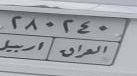

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
# Load the image
image = cv2.imread("/content/bz55_jpg.rf.530decdda9e06c7af61f364545a894ed.jpg")

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply edge detection
edges = cv2.Canny(gray, 50, 150)

# Find contours
contours, _ = cv2.findContours(edges, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

# Filter and find the contour of the license plate
for contour in contours:
    approx = cv2.approxPolyDP(contour, 0.02 * cv2.arcLength(contour, True), True)
    if len(approx) == 4:
        # Draw the contour on the original image
        cv2.drawContours(image, [approx], -1, (0, 255, 0), 3)
        # Print corner points
        print("Corner points: ", approx)
        break

# Display the result
cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()


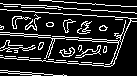

In [ ]:
import cv2
import numpy as np

def visualize_canny_edges(image_path, low_threshold=50, high_threshold=150):
    # Load the image
    image = cv2.imread(image_path)

    # Convert to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Canny edge detector
    edges = cv2.Canny(gray_image, low_threshold, high_threshold)

    # Display the original and edge-detected images side by side
    combined_image = np.hstack((gray_image, edges))

    # Add text labels to differentiate between original and edge-detected images
    cv2.putText(combined_image, 'Original', (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    cv2.putText(combined_image, 'Edges', (gray_image.shape[1] + 10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

    # Show the combined image
    cv2_imshow(edges)
    cv2.imwrite('canny_edges.png', edges)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

# Example usage
image_path = '/content/bz55_jpg.rf.530decdda9e06c7af61f364545a894ed.jpg'  # Replace with your image path
visualize_canny_edges(image_path)


<ipython-input-150-712f7a3686bc>:16: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  box = np.int0(box)
<ipython-input-150-712f7a3686bc>:71: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  box = np.int0(cv2.transform(np.array([box]), rotation_matrix)[0])


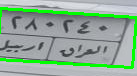

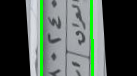

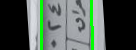

In [ ]:
import cv2
import numpy as np

def find_license_plate_min_area_rect(edge_image):
    # Find contours in the edge-detected image
    contours, _ = cv2.findContours(edge_image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    largest_area = 0
    largest_contour = None

    for contour in contours:
        area = cv2.contourArea(contour)
        if area > largest_area:
            rect = cv2.minAreaRect(contour)
            box = cv2.boxPoints(rect)
            box = np.int0(box)
            largest_contour = contour
            largest_area = area

    if largest_contour is not None:
        return box, rect
    else:
        raise ValueError("No suitable license plate contour detected.")

def rotate_and_crop(image, rect):
    width, height = int(rect[1][0]), int(rect[1][1])
    angle = rect[2]
    # angle=90-angle
    # print(angle)
    # angle=90-angle
    center = rect[0]

    # Compute the rotation matrix to align the rectangle horizontally
    rotation_matrix = cv2.getRotationMatrix2D(center, angle+90, 1.0)

    # Rotate the entire image
    rotated_image = cv2.warpAffine(image, rotation_matrix, (image.shape[1], image.shape[0]))

    # Calculate new bounding box coordinates in the rotated image
    x = int(center[0] - width / 2)
    y = int(center[1] - height / 2)

    # Clamp coordinates to be within image boundaries
    x = max(0, min(x, rotated_image.shape[1] - width))
    y = max(0, min(y, rotated_image.shape[0] - height))
    width = min(width, rotated_image.shape[1] - x)
    height = min(height, rotated_image.shape[0] - y)

    # Crop the aligned rectangle from the rotated image
    cropped_image = rotated_image[y:y + height, x:x + width]

    return cropped_image, rotated_image, rotation_matrix

def crop_and_save_license_plate(image_path, edge_image_path, save_path):
    image = cv2.imread(image_path)
    edge_image = cv2.imread(edge_image_path, cv2.IMREAD_GRAYSCALE)

    # Find the minimum area rectangle of the license plate
    box, rect = find_license_plate_min_area_rect(edge_image)

    # Rotate and crop the image based on the aligned rectangle
    cropped_image, rotated_image, rotation_matrix = rotate_and_crop(image, rect)

    # Save the cropped image
    cv2.imwrite(save_path, cropped_image)

    # Draw the bounding box on the original and rotated image for visualization
    cv2.drawContours(image, [box], 0, (0, 255, 0), 2)

    # Apply the same rotation to the original box points for visualization
    box = np.int0(cv2.transform(np.array([box]), rotation_matrix)[0])
    cv2.drawContours(rotated_image, [box], 0, (0, 255, 0), 2)

    # Display the result
    cv2_imshow( image)
    cv2_imshow(rotated_image)
    cv2_imshow( cropped_image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()


# Example usage
edge_image_path = '/content/canny_edges.png'  # Path to the edge-detected image
original_image_path = '/content/bz55_jpg.rf.530decdda9e06c7af61f364545a894ed.jpg'  # Path to the original image
save_path = '/content/cropped3.jpg'  # Path to save the cropped image

# Load edge-detected image
edge_image = cv2.imread(edge_image_path, cv2.IMREAD_GRAYSCALE)

# Crop and save the license plate
crop_and_save_license_plate(original_image_path, edge_image_path, save_path)

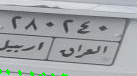

<ipython-input-153-3ccdc2ffd98e>:26: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  box = np.int0(box)


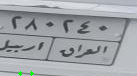

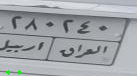

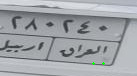

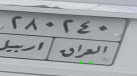

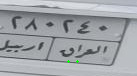

...

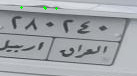

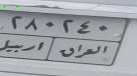

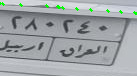

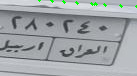

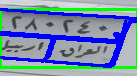

In [ ]:
import cv2
import numpy as np

def find_license_plate_box(edge_image):
    # Find contours in the edge-detected image
    contours, _ = cv2.findContours(edge_image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    # Initialize variables to hold the largest contour
    largest_contour = None
    largest_area = 0

    # Loop through all detected contours
    for contour in contours:
        # Calculate the area of the contour
        image = cv2.imread('/content/bz55_jpg.rf.530decdda9e06c7af61f364545a894ed.jpg')
        cv2.drawContours(image, contour, -1, (0, 255, 0), 2)

        # Display the original image with contours
        cv2_imshow(image)
        area = cv2.contourArea(contour)

        # Consider contours that are reasonably large and have four corners
        if area > 0.9*largest_area:
            rect = cv2.minAreaRect(contour)
            box = cv2.boxPoints(rect)
            box = np.int0(box)

            largest_contour = contour
            largest_area = area

    # Check if a contour was found
    if largest_contour is not None:

        # Get bounding box coordinates
        x, y, w, h = cv2.boundingRect(largest_contour)
        return (x, y, w, h), largest_contour
    else:
        raise ValueError("No suitable license plate contour detected.")

def visualize_license_plate_box(image_path, edge_image):
    # Load the original image
    image = cv2.imread(image_path)

    # Find the bounding box of the license plate
    bounding_box, contour = find_license_plate_box(edge_image)
    x, y, w, h = bounding_box

    # Draw the bounding box on the image
    cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)

    # Draw the contour
    cv2.drawContours(image, [contour], -1, (255, 0, 0), 2)

    # Display the result
    cv2_imshow( image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

# Example usage
edge_image_path = '/content/canny_edges.png'  # Replace with the path to your edge-detected image
image_path = '/content/bz55_jpg.rf.530decdda9e06c7af61f364545a894ed.jpg'  # Replace with the path to your original image

# Load edge-detected image
edge_image = cv2.imread(edge_image_path, cv2.IMREAD_GRAYSCALE)

visualize_license_plate_box(image_path, edge_image)
